In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import backend as K

In [ ]:
import os
import zipfile

# Define the list of zip file paths in your Google Drive
zip_files = [
    '/content/drive/MyDrive/project data/ISIC2018_Task3_Test_GroundTruth.zip',
    '/content/drive/MyDrive/project data/ISIC2018_Task3_Test_Input.zip',
    '/content/drive/MyDrive/project data/ISIC2018_Task3_Training_GroundTruth.zip',
    '/content/drive/MyDrive/project data/ISIC2018_Task3_Training_Input.zip',
    '/content/drive/MyDrive/project data/ISIC2018_Task3_Validation_GroundTruth.zip',
    '/content/drive/MyDrive/project data/ISIC2018_Task3_Validation_Input.zip'
]

# Define extraction directory
extract_dir = '/content/ISIC2018/'
os.makedirs(extract_dir, exist_ok=True)

# Unzip each file
for zip_file in zip_files:
    try:
        with zipfile.ZipFile(zip_file, 'r') as zip_ref:
            zip_ref.extractall(extract_dir)
        print(f"{zip_file} extracted successfully!")
    except zipfile.BadZipFile:
        print(f"Error: {zip_file} is not a valid ZIP file and could not be extracted.")
    except Exception as e:
        print(f"An error occurred with {zip_file}: {e}")



/content/drive/MyDrive/project data/ISIC2018_Task3_Test_GroundTruth.zip extracted successfully!
/content/drive/MyDrive/project data/ISIC2018_Task3_Test_Input.zip extracted successfully!
/content/drive/MyDrive/project data/ISIC2018_Task3_Training_GroundTruth.zip extracted successfully!
/content/drive/MyDrive/project data/ISIC2018_Task3_Training_Input.zip extracted successfully!
/content/drive/MyDrive/project data/ISIC2018_Task3_Validation_GroundTruth.zip extracted successfully!
/content/drive/MyDrive/project data/ISIC2018_Task3_Validation_Input.zip extracted successfully!


In [ ]:
# Check the contents of the extracted folder
!ls /content/ISIC2018/ISIC2018_Task3_Training_Input/
!ls /content/ISIC2018/ISIC2018_Task3_Test_Input/
!ls /content/ISIC2018/ISIC2018_Task3_Validation_Input/


ATTRIBUTION.txt   ISIC_0026309.jpg  ISIC_0028313.jpg  ISIC_0030317.jpg	ISIC_0032321.jpg
ISIC_0024306.jpg  ISIC_0026310.jpg  ISIC_0028314.jpg  ISIC_0030318.jpg	ISIC_0032322.jpg
ISIC_0024307.jpg  ISIC_0026311.jpg  ISIC_0028315.jpg  ISIC_0030319.jpg	ISIC_0032323.jpg
ISIC_0024308.jpg  ISIC_0026312.jpg  ISIC_0028316.jpg  ISIC_0030320.jpg	ISIC_0032324.jpg
ISIC_0024309.jpg  ISIC_0026313.jpg  ISIC_0028317.jpg  ISIC_0030321.jpg	ISIC_0032325.jpg
ISIC_0024310.jpg  ISIC_0026314.jpg  ISIC_0028318.jpg  ISIC_0030322.jpg	ISIC_0032326.jpg
ISIC_0024311.jpg  ISIC_0026315.jpg  ISIC_0028319.jpg  ISIC_0030323.jpg	ISIC_0032327.jpg
ISIC_0024312.jpg  ISIC_0026316.jpg  ISIC_0028320.jpg  ISIC_0030324.jpg	ISIC_0032328.jpg
ISIC_0024313.jpg  ISIC_0026317.jpg  ISIC_0028321.jpg  ISIC_0030325.jpg	ISIC_0032329.jpg
ISIC_0024314.jpg  ISIC_0026318.jpg  ISIC_0028322.jpg  ISIC_0030326.jpg	ISIC_0032330.jpg
ISIC_0024315.jpg  ISIC_0026319.jpg  ISIC_0028323.jpg  ISIC_0030327.jpg	ISIC_0032331.jpg
ISIC_0024316.jpg  ISIC_0026320.j

In [ ]:
import pandas as pd

# Define CSV file paths after extraction
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'

# Load the CSV files
train_labels = pd.read_csv(train_csv_path)
val_labels = pd.read_csv(val_csv_path)
test_labels = pd.read_csv(test_csv_path)

# Check the loaded CSV data
print(train_labels.head())
print(val_labels.head())
print(test_labels.head())


          image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0024306  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0024307  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0024308  0.0  1.0  0.0    0.0  0.0  0.0   0.0
3  ISIC_0024309  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0024310  1.0  0.0  0.0    0.0  0.0  0.0   0.0
          image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0034321  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0034322  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0034323  0.0  0.0  1.0    0.0  0.0  0.0   0.0
3  ISIC_0034324  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0034325  0.0  1.0  0.0    0.0  0.0  0.0   0.0
          image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0034524  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0034525  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0034526  0.0  0.0  0.0    0.0  1.0  0.0   0.0
3  ISIC_0034527  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0034528  0.0  1.0  0.0    0.0  0.0  0.0   0.0


In [ ]:
import pandas as pd


# Add .jpg extension to the filenames
train_labels['image'] = train_labels['image'].astype(str) + '.jpg'
val_labels['image'] = val_labels['image'].astype(str) + '.jpg'
test_labels['image'] = test_labels['image'].astype(str) + '.jpg'

# Save the updated CSV files
train_labels.to_csv(train_csv_path, index=False)
val_labels.to_csv(val_csv_path, index=False)
test_labels.to_csv(test_csv_path, index=False)

print("CSV filenames updated with .jpg extension.")


CSV filenames updated with .jpg extension.


In [ ]:
# Check the loaded CSV data
print(train_labels.head())
print(val_labels.head())
print(test_labels.head())

              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0024306.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0024307.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0024308.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
3  ISIC_0024309.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0024310.jpg  1.0  0.0  0.0    0.0  0.0  0.0   0.0
              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0034321.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0034322.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0034323.jpg  0.0  0.0  1.0    0.0  0.0  0.0   0.0
3  ISIC_0034324.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0034325.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0034524.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0034525.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0034526.jpg  0.0  0.0  0.0    0.0  1.0  0.0   0.0
3  ISIC_0034527.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_003452

In [ ]:
import os

# Define paths to your directories
train_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# List all files in each directory
train_files = os.listdir(train_dir)
val_files = os.listdir(val_dir)
test_files = os.listdir(test_dir)

# Filter out non-image files
def filter_images(files):
    return [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Get only image files
train_images = filter_images(train_files)
val_images = filter_images(val_files)
test_images = filter_images(test_files)

# Print number of image files
print(f'Train images: {len(train_images)}')
print(f'Validation images: {len(val_images)}')
print(f'Test images: {len(test_images)}')


Train images: 10015
Validation images: 193
Test images: 1512


In [ ]:
import os
from PIL import Image

# Define paths to your directories
train_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

def check_images(directory):
    # List all files in the directory
    files = os.listdir(directory)
    jpg_files = [f for f in files if f.lower().endswith('.jpg')]
    non_jpg_files = [f for f in files if not f.lower().endswith('.jpg')]
    corrupted_files = []

    # Check image integrity
    for file in jpg_files:
        try:
            with Image.open(os.path.join(directory, file)) as img:
                img.verify()  # Verify image integrity
        except (IOError, SyntaxError) as e:
            corrupted_files.append(file)

    return jpg_files, non_jpg_files, corrupted_files

# Check training, validation, and test directories
train_jpg_files, train_non_jpg_files, train_corrupted_files = check_images(train_dir)
val_jpg_files, val_non_jpg_files, val_corrupted_files = check_images(val_dir)
test_jpg_files, test_non_jpg_files, test_corrupted_files = check_images(test_dir)

# Print results
print("Training Directory:")
print(f"Total images: {len(train_jpg_files)}")
print(f"Non-JPG files: {len(train_non_jpg_files)}")
print(f"Corrupted files: {len(train_corrupted_files)}")

print("\nValidation Directory:")
print(f"Total images: {len(val_jpg_files)}")
print(f"Non-JPG files: {len(val_non_jpg_files)}")
print(f"Corrupted files: {len(val_corrupted_files)}")

print("\nTest Directory:")
print(f"Total images: {len(test_jpg_files)}")
print(f"Non-JPG files: {len(test_non_jpg_files)}")
print(f"Corrupted files: {len(test_corrupted_files)}")


Training Directory:
Total images: 10015
Non-JPG files: 2
Corrupted files: 0

Validation Directory:
Total images: 193
Non-JPG files: 2
Corrupted files: 0

Test Directory:
Total images: 1512
Non-JPG files: 2
Corrupted files: 0


In [ ]:
import os

# Define the directories
train_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'


valid_extensions = {'.jpg', '.jpeg', '.png'}

def remove_non_image_files(directory):
    for filename in os.listdir(directory):
        # Get the file extension
        ext = os.path.splitext(filename)[1].lower()

        if ext not in valid_extensions:
            file_path = os.path.join(directory, filename)
            os.remove(file_path)
            print(f"Removed: {file_path}")

# Remove non-image files from each directory
remove_non_image_files(train_dir)
remove_non_image_files(val_dir)
remove_non_image_files(test_dir)

print("Non-image files have been removed.")


Removed: /content/ISIC2018/ISIC2018_Task3_Training_Input/LICENSE.txt
Removed: /content/ISIC2018/ISIC2018_Task3_Training_Input/ATTRIBUTION.txt
Removed: /content/ISIC2018/ISIC2018_Task3_Validation_Input/LICENSE.txt
Removed: /content/ISIC2018/ISIC2018_Task3_Validation_Input/ATTRIBUTION.txt
Removed: /content/ISIC2018/ISIC2018_Task3_Test_Input/LICENSE.txt
Removed: /content/ISIC2018/ISIC2018_Task3_Test_Input/ATTRIBUTION.txt
Non-image files have been removed.


In [ ]:
import pandas as pd

# Define CSV file paths
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'

# Load the CSV files
train_labels = pd.read_csv(train_csv_path)
val_labels = pd.read_csv(val_csv_path)
test_labels = pd.read_csv(test_csv_path)

# Preview the first few rows of each CSV
print("Training Data:")
print(train_labels.head())
print("\nValidation Data:")
print(val_labels.head())
print("\nTest Data:")
print(test_labels.head())


Training Data:
              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0024306.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0024307.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0024308.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
3  ISIC_0024309.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0024310.jpg  1.0  0.0  0.0    0.0  0.0  0.0   0.0

Validation Data:
              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0034321.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0034322.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0034323.jpg  0.0  0.0  1.0    0.0  0.0  0.0   0.0
3  ISIC_0034324.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0034325.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0

Test Data:
              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0034524.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0034525.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0034526.jpg  0.0  0.0  0.0    0.0  1.0  0.0   0.0
3  ISIC_0034527.jpg  0.0  1

In [ ]:
import os

def list_image_files(directory):
    return [f for f in os.listdir(directory) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Define directories
train_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# List image files
train_images = list_image_files(train_dir)
val_images = list_image_files(val_dir)
test_images = list_image_files(test_dir)

# Display counts
print(f"\nTotal images in training directory: {len(train_images)}")
print(f"Total images in validation directory: {len(val_images)}")
print(f"Total images in test directory: {len(test_images)}")



Total images in training directory: 10015
Total images in validation directory: 193
Total images in test directory: 1512



Sample Training Images:


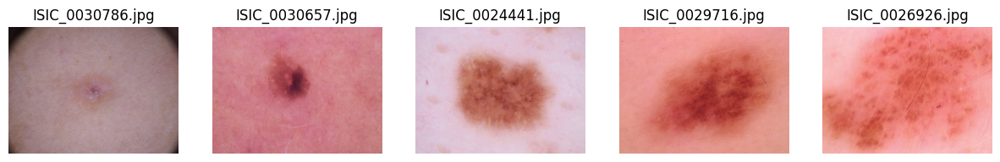


Sample Validation Images:


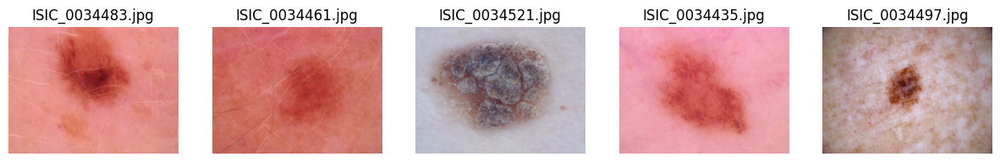


Sample Test Images:


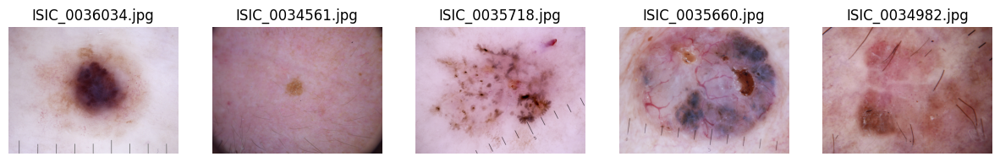

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_sample_images(directory, num_images=5):
    image_files = list_image_files(directory)
    sample_images = image_files[:num_images]

    plt.figure(figsize=(15, 15))
    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(directory, img_file)
        img = mpimg.imread(img_path)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(img_file)
    plt.show()

print("\nSample Training Images:")
show_sample_images(train_dir)

print("\nSample Validation Images:")
show_sample_images(val_dir)

print("\nSample Test Images:")
show_sample_images(test_dir)


1. Data Preparation
Ensure that your images and labels are properly aligned. You might want to create a utility function to preprocess the data. Here’s an example to help you get started:

In [ ]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

def preprocess_image(file_path, label):
    # Read and decode the image
    image = tf.io.read_file(file_path)
    image = tf.image.decode_jpeg(image, channels=3)

    # Resize the image
    image = tf.image.resize(image, [224, 224])

    # Normalize the image
    image = image / 255.0

    return image, label

def create_dataset(image_files, labels_df, batch_size=32):
    image_paths = [image_file for image_file in image_files]
    labels = labels_df.set_index('image').reindex([file.split('/')[-1] for file in image_paths])  # Ensure filenames match

    labels = labels.fillna(0)  # Replace NaNs with 0 for missing labels
    labels = labels.values.tolist()

    # Create a TensorFlow Dataset
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(image_paths)).batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return dataset

# Create datasets
train_dataset = create_dataset(train_images, train_labels)
val_dataset = create_dataset(val_images, val_labels)
test_dataset = create_dataset(test_images, test_labels)


In [ ]:
import os

def check_files(csv_path, image_dir):
    labels = pd.read_csv(csv_path)
    image_files = set(list_image_files(image_dir))
    missing_files = []

    for image_name in labels['image']:
        image_file = image_name  # adjust this if needed
        if image_file not in image_files:
            missing_files.append(image_file)

    if missing_files:
        print(f"Missing files: {missing_files}")
    else:
        print("All files are present.")

# Check each dataset
check_files(train_csv_path, train_dir)
check_files(val_csv_path, val_dir)
check_files(test_csv_path, test_dir)


All files are present.
All files are present.
All files are present.


In [ ]:
import os
import pandas as pd

def find_missing_files(csv_path, image_dir):
    labels = pd.read_csv(csv_path)
    image_files = set(os.listdir(image_dir))
    missing_files = []

    for image_name in labels['image']:
        if image_name not in image_files:
            missing_files.append(image_name)

    return missing_files

# Check for missing files in each dataset
missing_train = find_missing_files(train_csv_path, train_dir)
missing_val = find_missing_files(val_csv_path, val_dir)
missing_test = find_missing_files(test_csv_path, test_dir)

print(f"Missing files in training set: {missing_train}")
print(f"Missing files in validation set: {missing_val}")
print(f"Missing files in test set: {missing_test}")


Missing files in training set: []
Missing files in validation set: []
Missing files in test set: []


In [ ]:
def parse_function(filename, label):
    image = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])
    image = image / 255.0  # Normalize to [0, 1]
    return image, label

def create_dataset(csv_path, image_dir, batch_size=32):
    labels = pd.read_csv(csv_path)
    filenames = labels['image'].apply(lambda x: os.path.join(image_dir, x)).tolist()
    labels = labels.drop(columns=['image']).values

    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
    dataset = dataset.map(parse_function, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Create datasets
train_data = create_dataset(train_csv_path, train_dir)
val_data = create_dataset(val_csv_path, val_dir)
test_data = create_dataset(test_csv_path, test_dir)


In [ ]:
import shutil

def remove_non_image_files(directory):
    for file_name in os.listdir(directory):
        if not file_name.lower().endswith('.jpg'):
            os.remove(os.path.join(directory, file_name))

remove_non_image_files(train_dir)
remove_non_image_files(val_dir)
remove_non_image_files(test_dir)


In [ ]:
print("Training directory:", train_dir)
print("Validation directory:", val_dir)
print("Test directory:", test_dir)


Training directory: /content/ISIC2018/ISIC2018_Task3_Training_Input
Validation directory: /content/ISIC2018/ISIC2018_Task3_Validation_Input
Test directory: /content/ISIC2018/ISIC2018_Task3_Test_Input


In [ ]:
from PIL import Image

def verify_image(file_path):
    try:
        img = Image.open(file_path)
        img.verify()  # Verify if the image is corrupted
        return True
    except (IOError, SyntaxError) as e:
        print(f"Corrupted file: {file_path}")
        return False

# Check a few files from each directory
for file_name in os.listdir(train_dir)[:5]:
    verify_image(os.path.join(train_dir, file_name))

for file_name in os.listdir(val_dir)[:5]:
    verify_image(os.path.join(val_dir, file_name))

for file_name in os.listdir(test_dir)[:5]:
    verify_image(os.path.join(test_dir, file_name))


In [ ]:
import tensorflow as tf
import pandas as pd

# Function to load image files and labels
def load_image_dataset(image_dir, labels_csv):
    labels_df = pd.read_csv(labels_csv)
    image_paths = image_dir + '/' + labels_df['image'].values
    labels = labels_df.drop(columns=['image']).values

    def parse_image(img_path, label):
        img = tf.io.read_file(img_path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, [224, 224])
        img = img / 255.0  # Normalize to [0, 1]
        return img, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(parse_image, num_parallel_calls=tf.data.AUTOTUNE)
    return dataset

# Load datasets
train_dataset = load_image_dataset('/content/ISIC2018/ISIC2018_Task3_Training_Input', '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv')
val_dataset = load_image_dataset('/content/ISIC2018/ISIC2018_Task3_Validation_Input', '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv')
test_dataset = load_image_dataset('/content/ISIC2018/ISIC2018_Task3_Test_Input', '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv')


In [ ]:
def preprocess_dataset(dataset, batch_size=32, shuffle_buffer_size=1000):
    dataset = dataset.shuffle(shuffle_buffer_size)  # Shuffle dataset
    dataset = dataset.batch(batch_size)  # Batch dataset
    dataset = dataset.prefetch(tf.data.AUTOTUNE)  # Prefetch for performance
    return dataset

# Prepare datasets
batch_size = 32
train_dataset = preprocess_dataset(train_dataset, batch_size=batch_size)
val_dataset = preprocess_dataset(val_dataset, batch_size=batch_size)
test_dataset = preprocess_dataset(test_dataset, batch_size=batch_size)


In [ ]:
for img, label in train_dataset.take(1):
    print("Image shape:", img.shape)
    print("Label shape:", label.shape)


Image shape: (32, 224, 224, 3)
Label shape: (32, 7)


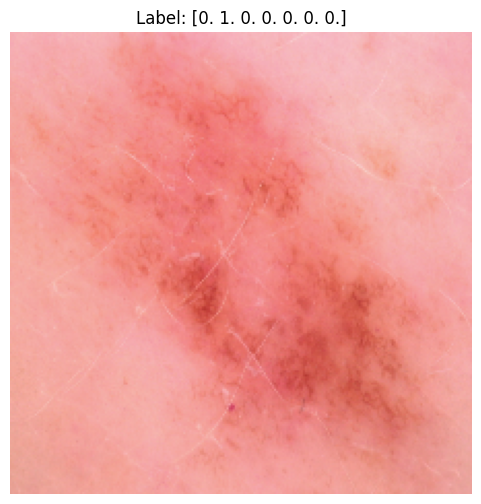

In [ ]:
import matplotlib.pyplot as plt

def display_sample(dataset):
    for img, label in dataset.take(1):
        plt.figure(figsize=(6, 6))
        plt.imshow(img[0])
        plt.title(f"Label: {label[0]}")
        plt.axis('off')
        plt.show()

display_sample(train_dataset)


In [ ]:
print("Number of training samples:", len(list(train_dataset.unbatch())))
print("Number of validation samples:", len(list(val_dataset.unbatch())))
print("Number of test samples:", len(list(test_dataset.unbatch())))


Number of training samples: 10015
Number of validation samples: 193
Number of test samples: 1512


In [ ]:
# Load the CSV file containing the labels
csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
df = pd.read_csv(csv_path)

# Assuming the columns for classes are named 'MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'
class_columns = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Calculate the sum of occurrences for each class
class_distribution = df[class_columns].sum()

# Print the distribution
print(class_distribution)

MEL      1113.0
NV       6705.0
BCC       514.0
AKIEC     327.0
BKL      1099.0
DF        115.0
VASC      142.0
dtype: float64


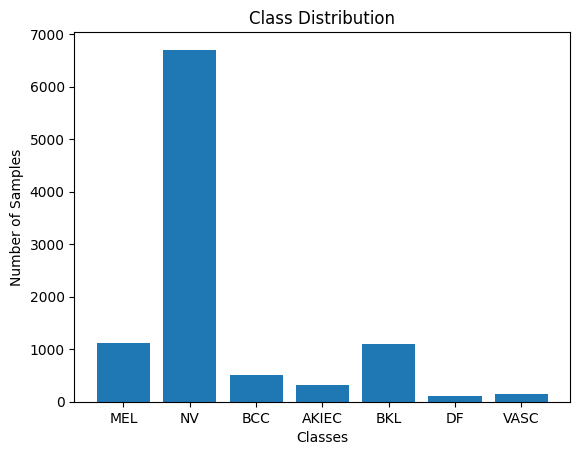

In [ ]:
import matplotlib.pyplot as plt

# Assuming `class_distribution` is the result from one of the previous methods
plt.bar(class_distribution.index, class_distribution.values)
plt.xlabel('Classes')
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()


In [ ]:
# Load the CSV file containing the labels
csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
df = pd.read_csv(csv_path)

# Assuming the columns for classes are named 'MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'
class_columns = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Calculate the sum of occurrences for each class
class_distribution = df[class_columns].sum()

# Print the distribution
print(class_distribution)

MEL       21.0
NV       123.0
BCC       15.0
AKIEC      8.0
BKL       22.0
DF         1.0
VASC       3.0
dtype: float64


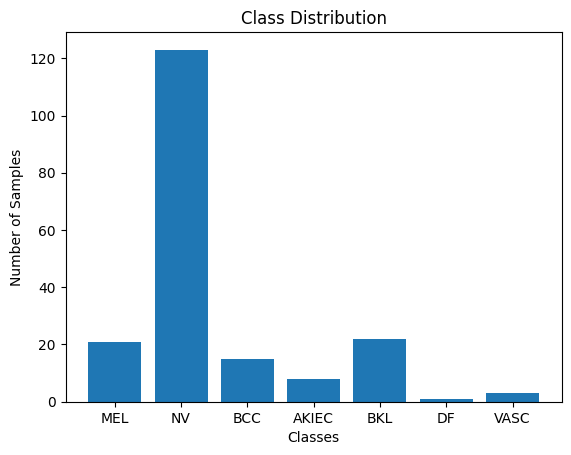

In [ ]:
# Assuming `class_distribution` is the result from one of the previous methods
plt.bar(class_distribution.index, class_distribution.values)
plt.xlabel('Classes')
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()


In [ ]:
# Load the CSV file containing the labels
csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
df = pd.read_csv(csv_path)

# Assuming the columns for classes are named 'MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'
class_columns = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Calculate the sum of occurrences for each class
class_distribution = df[class_columns].sum()

# Print the distribution
print(class_distribution)

MEL      171.0
NV       909.0
BCC       93.0
AKIEC     43.0
BKL      217.0
DF        44.0
VASC      35.0
dtype: float64


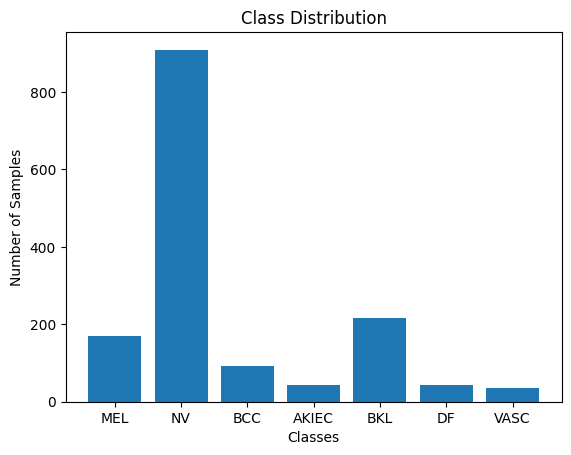

In [ ]:
# Assuming `class_distribution` is the result from one of the previous methods
plt.bar(class_distribution.index, class_distribution.values)
plt.xlabel('Classes')
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()


Training of Convolutional Neural Network

Adding Regularisation

In [ ]:
# # Focal loss implementation
# def focal_loss(gamma=2., alpha=.25):
#     def focal_loss_fixed(y_true, y_pred):
#         y_true = tf.convert_to_tensor(y_true, tf.float32)
#         y_pred = tf.convert_to_tensor(y_pred, tf.float32)
#         alpha_t = y_true * alpha + (tf.ones_like(y_true) - y_true) * (1 - alpha)
#         p_t = y_true * y_pred + (tf.ones_like(y_true) - y_true) * (tf.ones_like(y_true) - y_pred)
#         fl = - alpha_t * K.pow((tf.ones_like(y_true) - p_t), gamma) * K.log(p_t)
#         return K.sum(fl, axis=-1)
#     return focal_loss_fixed

In [ ]:
# # Common callbacks
# early_stopping = EarlyStopping(
#     monitor='val_loss',
#     patience=3,
#     restore_best_weights=True
# )

# reduce_lr = ReduceLROnPlateau(
#     monitor='val_loss',
#     factor=0.1,
#     patience=3,
#     min_lr=1e-6
# )

Defining and Detailing of CNN models

In [ ]:
# # Define VGG16 model
# def build_vgg16():
#     base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
#     x = base_model.output
#     x = tf.keras.layers.GlobalAveragePooling2D()(x)
#     predictions = tf.keras.layers.Dense(7, activation='softmax')(x)
#     model = tf.keras.Model(inputs=base_model.input, outputs=predictions)
#     return model

In [ ]:
# # Define the rest of the models
# def build_resnet50():
#     base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
#     x = base_model.output
#     x = tf.keras.layers.GlobalAveragePooling2D()(x)
#     predictions = tf.keras.layers.Dense(7, activation='softmax')(x)
#     model = tf.keras.Model(inputs=base_model.input, outputs=predictions)
#     return model

In [ ]:
# def build_efficientnetb0():
#     base_model = tf.keras.applications.EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
#     x = base_model.output
#     x = tf.keras.layers.GlobalAveragePooling2D()(x)
#     predictions = tf.keras.layers.Dense(7, activation='softmax')(x)
#     model = tf.keras.Model(inputs=base_model.input, outputs=predictions)
#     return model

In [ ]:
# def build_inceptionv3():
#     base_model = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
#     x = base_model.output
#     x = tf.keras.layers.GlobalAveragePooling2D()(x)
#     predictions = tf.keras.layers.Dense(7, activation='softmax')(x)
#     model = tf.keras.Model(inputs=base_model.input, outputs=predictions)
#     return model

Compile and Train the model

In [ ]:
# Compile and train the model
def compile_and_train(model, train_data, val_data, model_name, class_weights=None, epochs=10):
    # Define ModelCheckpoint for saving the best model
    model_checkpoint = ModelCheckpoint(
        f'{model_name}_best_model.keras',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,
        mode='min',
        verbose=1
    )

    # Compile the model with focal loss
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=focal_loss(),
        metrics=['accuracy']
    )

    # Train the model with class weights if provided
    history = model.fit(
        train_data,
        epochs=epochs,
        validation_data=val_data,
        callbacks=[early_stopping, reduce_lr, model_checkpoint],
        class_weight=class_weights  # Use class weights to handle imbalance
    )
    return history

In [ ]:
# Define your class weights according to the imbalance in your data
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}

In [ ]:
# Prepare your data (replace with your actual data loading code)
train_data = train_dataset
val_data = val_dataset

In [ ]:
#Build and train models
resnet50_model = build_resnet50()
history_resnet50 = compile_and_train(resnet50_model, train_data, val_data, 'resnet50', epochs=10)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.7208 - loss: 0.1567
Epoch 1: val_loss improved from inf to 0.87370, saving model to resnet50_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 109s 163ms/step - accuracy: 0.7209 - loss: 0.1566 - val_accuracy: 0.0155 - val_loss: 0.8737 - learning_rate: 1.0000e-04
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.8367 - loss: 0.0909
Epoch 2: val_loss improved from 0.87370 to 0.58999, saving model to resnet50_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - accuracy: 0.8367 - loss: 0.0909 - val_accuracy: 0.6373 - val_loss: 0.5900 - learning_rate: 1.0000e-04
Epoch 3/10
312/313 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.9001 - loss: 0.0586
Epoch 3: val_loss improved from 0.58999 to 0.45417, saving model to resnet50_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - accuracy: 0.9002 - loss: 0.0585 - val_accuracy: 0.6736 - val_loss: 0

In [ ]:
#Build and train models
vgg16_model = build_vgg16()
history_vgg16 = compile_and_train(vgg16_model, train_data, val_data, 'vgg16', epochs=10)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.6501 - loss: 0.1967
Epoch 1: val_loss improved from inf to 0.15450, saving model to resnet50_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - accuracy: 0.6502 - loss: 0.1967 - val_accuracy: 0.7150 - val_loss: 0.1545 - learning_rate: 1.0000e-04
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.7055 - loss: 0.1480
Epoch 2: val_loss improved from 0.15450 to 0.14608, saving model to resnet50_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - accuracy: 0.7055 - loss: 0.1480 - val_accuracy: 0.7409 - val_loss: 0.1461 - learning_rate: 1.0000e-04
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.7252 - loss: 0.1390
Epoch 3: val_loss improved from 0.14608 to 0.14265, saving model to resnet50_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - accuracy: 0.7252 - loss: 0.1390 - val_accuracy: 0.7565 - val_loss: 0.

In [ ]:
# Train InceptionV3
inceptionv3_model = build_inceptionv3()
history_inceptionv3 = compile_and_train(inceptionv3_model, train_data, val_data, 'inceptionv3', epochs=10)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.6839 - loss: 0.1715
Epoch 1: val_loss improved from inf to 0.12190, saving model to inceptionv3_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 132s 198ms/step - accuracy: 0.6841 - loss: 0.1714 - val_accuracy: 0.7824 - val_loss: 0.1219 - learning_rate: 1.0000e-04
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.8510 - loss: 0.0823
Epoch 2: val_loss did not improve from 0.12190
313/313 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step - accuracy: 0.8511 - loss: 0.0823 - val_accuracy: 0.7306 - val_loss: 0.1395 - learning_rate: 1.0000e-04
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.9139 - loss: 0.0509
Epoch 3: val_loss did not improve from 0.12190
313/313 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - accuracy: 0.9139 - loss: 0.0509 - val_accuracy: 0.8187 - val_loss: 0.1320 - learning_rate: 1.0000e-04
Epoch 4/10
312/313 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - ac

In [ ]:
efficientnetb0_model = build_efficientnetb0()
history_efficientnetb0 = compile_and_train(efficientnetb0_model, train_data, val_data, 'efficientnetb0', epochs=10)


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.6868 - loss: 0.1734
Epoch 1: val_loss did not improve from inf
313/313 ━━━━━━━━━━━━━━━━━━━━ 140s 210ms/step - accuracy: 0.6870 - loss: 0.1733 - val_accuracy: 0.6373 - val_loss: inf - learning_rate: 1.0000e-04
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.8441 - loss: 0.0848
Epoch 2: val_loss did not improve from inf
313/313 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - accuracy: 0.8441 - loss: 0.0848 - val_accuracy: 0.3731 - val_loss: inf - learning_rate: 1.0000e-04
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.8951 - loss: 0.0591
Epoch 3: val_loss improved from inf to 0.10414, saving model to efficientnetb0_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step - accuracy: 0.8951 - loss: 0.0591 - val_accuracy: 0.8446 - val_loss: 0.1041 - learning_rate: 1.0000e-04
Epoch 4/10
312/313 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.9

L2- Reguralization

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K

# Focal loss implementation
def focal_loss(gamma=2., alpha=.25):
    def focal_loss_fixed(y_true, y_pred):
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.convert_to_tensor(y_pred, tf.float32)
        alpha_t = y_true * alpha + (tf.ones_like(y_true) - y_true) * (1 - alpha)
        p_t = y_true * y_pred + (tf.ones_like(y_true) - y_true) * (tf.ones_like(y_true) - y_pred)
        fl = - alpha_t * K.pow((tf.ones_like(y_true) - p_t), gamma) * K.log(p_t)
        return K.sum(fl, axis=-1)
    return focal_loss_fixed

# Common callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=3,
    min_lr=1e-6
)

# Define VGG16 model with L2 regularization
def build_vgg16():
    base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    x = base_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    # Add L2 regularization in the Dense layer
    predictions = tf.keras.layers.Dense(7, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(x)
    model = tf.keras.Model(inputs=base_model.input, outputs=predictions)
    return model

# Define ResNet50 model with L2 regularization
def build_resnet50():
    base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    x = base_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    # Add L2 regularization in the Dense layer
    predictions = tf.keras.layers.Dense(7, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(x)
    model = tf.keras.Model(inputs=base_model.input, outputs=predictions)
    return model

# Define EfficientNetB0 model with L2 regularization
def build_efficientnetb0():
    base_model = tf.keras.applications.EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    x = base_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    # Add L2 regularization in the Dense layer
    predictions = tf.keras.layers.Dense(7, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(x)
    model = tf.keras.Model(inputs=base_model.input, outputs=predictions)
    return model

# Define InceptionV3 model with L2 regularization
def build_inceptionv3():
    base_model = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    x = base_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    # Add L2 regularization in the Dense layer
    predictions = tf.keras.layers.Dense(7, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(x)
    model = tf.keras.Model(inputs=base_model.input, outputs=predictions)
    return model

# Compile and train the model
def compile_and_train(model, train_data, val_data, model_name, class_weights=None, epochs=10):
    # Define ModelCheckpoint for saving the best model
    model_checkpoint = ModelCheckpoint(
        f'{model_name}_best_model.keras',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,
        mode='min',
        verbose=1
    )

    # Compile the model with focal loss
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=focal_loss(),
        metrics=['accuracy']
    )

    # Train the model with class weights if provided
    history = model.fit(
        train_data,
        epochs=epochs,
        validation_data=val_data,
        callbacks=[early_stopping, reduce_lr, model_checkpoint],
        class_weight=class_weights  # Use class weights to handle imbalance
    )
    return history

# Define your class weights according to the imbalance in your data
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}

# Calculate class weights
total_samples = sum(class_distribution.values())
class_weights = {i: total_samples / (len(class_distribution) * count) for i, count in class_distribution.items()}

# Prepare your data (replace with your actual data loading code)
train_data = train_dataset
val_data = val_dataset



In [ ]:
# Build and train the ResNet50 model
resnet50_model = build_resnet50()
history_resnet50 = compile_and_train(resnet50_model, train_data, val_data, 'resnet50', class_weights=class_weights, epochs=10)



94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.5361 - loss: 0.4207
Epoch 1: val_loss improved from inf to 0.89217, saving model to resnet50_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 113s 170ms/step - accuracy: 0.5362 - loss: 0.4205 - val_accuracy: 0.1140 - val_loss: 0.8922 - learning_rate: 1.0000e-04
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.7333 - loss: 0.2273
Epoch 2: val_loss improved from 0.89217 to 0.39848, saving model to resnet50_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step - accuracy: 0.7334 - loss: 0.2273 - val_accuracy: 0.3627 - val_loss: 0.3985 - learning_rate: 1.0000e-04
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.7848 - loss: 0.1918
Epoch 3: val_loss did not improve from 0.39848
313/313 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - accuracy: 0.7847 - loss: 0.1918 - val_accuracy: 0.3782 - val_loss: 0.4699 - learning_rate: 1.0000e-04
Epoch 4/10
31

In [ ]:
#Build and train models
vgg16_model = build_vgg16()
history_vgg16 = compile_and_train(vgg16_model, train_data, val_data, 'vgg16', epochs=10)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.6762 - loss: 0.3084
Epoch 1: val_loss improved from inf to 0.21799, saving model to vgg16_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - accuracy: 0.6762 - loss: 0.3083 - val_accuracy: 0.7306 - val_loss: 0.2180 - learning_rate: 1.0000e-04
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.7284 - loss: 0.1965
Epoch 2: val_loss improved from 0.21799 to 0.17900, saving model to vgg16_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - accuracy: 0.7284 - loss: 0.1965 - val_accuracy: 0.6995 - val_loss: 0.1790 - learning_rate: 1.0000e-04
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.7235 - loss: 0.1675
Epoch 3: val_loss improved from 0.17900 to 0.14579, saving model to vgg16_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - accuracy: 0.7236 - loss: 0.1675 - val_accuracy: 0.7927 - val_loss: 0.1458 - le

In [ ]:
# Train InceptionV3
inceptionv3_model = build_inceptionv3()
history_inceptionv3 = compile_and_train(inceptionv3_model, train_data, val_data, 'inceptionv3', epochs=10)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - accuracy: 0.7172 - loss: 0.2887
Epoch 1: val_loss improved from inf to 0.21952, saving model to inceptionv3_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 138s 208ms/step - accuracy: 0.7173 - loss: 0.2886 - val_accuracy: 0.7927 - val_loss: 0.2195 - learning_rate: 1.0000e-04
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.8428 - loss: 0.1771
Epoch 2: val_loss improved from 0.21952 to 0.20321, saving model to inceptionv3_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - accuracy: 0.8428 - loss: 0.1770 - val_accuracy: 0.7927 - val_loss: 0.2032 - learning_rate: 1.0000e-04
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.9043 - loss: 0.1186
Epoch 3: val_loss improved from 0.20321 to 0.19070, saving model to inceptionv3_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - accuracy: 0.9044 - loss: 0.1185 - val_accuracy: 0.7668 - va

In [ ]:
efficientnetb0_model = build_efficientnetb0()
history_efficientnetb0 = compile_and_train(efficientnetb0_model, train_data, val_data, 'efficientnetb0', epochs=10)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.6947 - loss: 0.3015
Epoch 1: val_loss did not improve from inf
313/313 ━━━━━━━━━━━━━━━━━━━━ 143s 217ms/step - accuracy: 0.6949 - loss: 0.3013 - val_accuracy: 0.5440 - val_loss: inf - learning_rate: 1.0000e-04
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.8373 - loss: 0.1760
Epoch 2: val_loss did not improve from inf
313/313 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.8373 - loss: 0.1760 - val_accuracy: 0.6114 - val_loss: inf - learning_rate: 1.0000e-04
Epoch 3/10
312/313 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.8854 - loss: 0.1268
Epoch 3: val_loss improved from inf to 0.15214, saving model to efficientnetb0_best_model.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step - accuracy: 0.8854 - loss: 0.1267 - val_accuracy: 0.8187 - val_loss: 0.1521 - learning_rate: 1.0000e-04


In [ ]:
# Define new paths if needed
new_drive_path = '/content/drive/MyDrive/New_Model_Checkpoints'
os.makedirs(new_drive_path, exist_ok=True)

# Save models using the native Keras format
resnet50_model.save(os.path.join(new_drive_path, 'resnet50_final.keras'))
vgg16_model.save(os.path.join(new_drive_path, 'vgg16_final.keras'))
inceptionv3_model.save(os.path.join(new_drive_path, 'inceptionv3_final.keras'))
efficientnetb0_model.save(os.path.join(new_drive_path, 'efficientnetb0_final.keras'))

In [ ]:
import tensorflow as tf
import os

# Re-define the focal loss function
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_sum(loss, axis=1)
    return focal_loss_fixed

# Define the directory path on Google Drive where the models are saved
new_drive_path = '/content/drive/MyDrive/New_Model_Checkpoints'

# Load the saved models with the custom loss function
resnet50_model_path = os.path.join(new_drive_path, 'resnet50_final.keras')
vgg16_model_path = os.path.join(new_drive_path, 'vgg16_final.keras')
inceptionv3_model_path = os.path.join(new_drive_path, 'inceptionv3_final.keras')
efficientnetb0_model_path = os.path.join(new_drive_path, 'efficientnetb0_final.keras')

# Load each model, providing the custom loss function to the `custom_objects` parameter
resnet50_model = tf.keras.models.load_model(resnet50_model_path, custom_objects={'focal_loss_fixed': focal_loss()})
print("ResNet50 model loaded successfully.")

vgg16_model = tf.keras.models.load_model(vgg16_model_path, custom_objects={'focal_loss_fixed': focal_loss()})
print("VGG16 model loaded successfully.")

inceptionv3_model = tf.keras.models.load_model(inceptionv3_model_path, custom_objects={'focal_loss_fixed': focal_loss()})
print("InceptionV3 model loaded successfully.")

efficientnetb0_model = tf.keras.models.load_model(efficientnetb0_model_path, custom_objects={'focal_loss_fixed': focal_loss()})
print("EfficientNetB0 model loaded successfully.")


ResNet50 model loaded successfully.
VGG16 model loaded successfully.
InceptionV3 model loaded successfully.
EfficientNetB0 model loaded successfully.


In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report

# Register the focal loss function
@tf.keras.utils.register_keras_serializable()
def focal_loss(gamma=2., alpha=.25):
    def focal_loss_fixed(y_true, y_pred):
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.convert_to_tensor(y_pred, tf.float32)
        alpha_t = y_true * alpha + (tf.ones_like(y_true) - y_true) * (1 - alpha)
        p_t = y_true * y_pred + (tf.ones_like(y_true) - y_true) * (tf.ones_like(y_true) - y_pred)
        fl = - alpha_t * tf.pow((tf.ones_like(y_true) - p_t), gamma) * tf.math.log(p_t)
        return tf.reduce_sum(fl, axis=-1)
    return focal_loss_fixed

# Function to load and evaluate models
def evaluate_model(model_path, test_data):
    # Load the model with custom_objects for the focal loss function
    try:
        model = tf.keras.models.load_model(model_path, custom_objects={'focal_loss_fixed': focal_loss()})
    except Exception as e:
        print(f"Error loading model {model_path}: {e}")
        return None, None, None, None

    # Evaluate the model on the test dataset
    test_loss, test_accuracy = model.evaluate(test_data, verbose=1)

    # Extract true labels and predicted labels
    y_true = np.concatenate([y for x, y in test_data], axis=0)
    y_pred = np.argmax(model.predict(test_data), axis=-1)
    y_true = np.argmax(y_true, axis=-1)

    return test_loss, test_accuracy, y_true, y_pred

# Define model paths (update with correct paths if needed)
model_paths = {
    'ResNet50': '/content/drive/MyDrive/New_Model_Checkpoints/resnet50_final.keras',
    'EfficientNetB0': '/content/drive/MyDrive/New_Model_Checkpoints/efficientnetb0_final.keras',
    'VGG16': '/content/drive/MyDrive/New_Model_Checkpoints/vgg16_final.keras',
    'InceptionV3': '/content/drive/MyDrive/New_Model_Checkpoints/inceptionv3_final.keras'
}

# Class names (modify according to your task)
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Collect results for each model
results = {}
for model_name, model_path in model_paths.items():
    print(f'Evaluating {model_name}...')
    test_loss, test_accuracy, y_true, y_pred = evaluate_model(model_path, test_data)

    if y_true is not None and y_pred is not None:
        results[model_name] = (y_true, y_pred)

        # Print classification report for each model
        print(f'\nClassification Report for {model_name}:\n')
        report = classification_report(y_true, y_pred, target_names=class_names)
        print(report)
    else:
        print(f"Skipping evaluation for {model_name} due to loading or data issues.")


Evaluating ResNet50...
48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - accuracy: 0.7879 - loss: 0.2008
48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

Classification Report for ResNet50:

              precision    recall  f1-score   support

         MEL       0.43      0.75      0.55       171
          NV       0.92      0.82      0.86       909
         BCC       0.65      0.45      0.53        93
       AKIEC       0.76      0.30      0.43        43
         BKL       0.61      0.73      0.67       217
          DF       0.81      0.57      0.67        44
        VASC       0.56      0.57      0.56        35

    accuracy                           0.75      1512
   macro avg       0.68      0.60      0.61      1512
weighted avg       0.79      0.75      0.75      1512

Evaluating EfficientNetB0...
48/48 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - accuracy: 0.5534 - loss: inf
48/48 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step

Classification Report for EfficientNetB0:

              precision    recall  f1-s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7523 - loss: 0.1452
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

Classification Report for VGG16:

              precision    recall  f1-score   support

         MEL       0.54      0.31      0.39       171
          NV       0.78      0.96      0.86       909
         BCC       0.57      0.39      0.46        93
       AKIEC       0.56      0.35      0.43        43
         BKL       0.59      0.52      0.56       217
          DF       0.00      0.00      0.00        44
        VASC       0.89      0.49      0.63        35

    accuracy                           0.73      1512
   macro avg       0.56      0.43      0.48      1512
weighted avg       0.69      0.73      0.70      1512

Evaluating InceptionV3...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


48/48 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - accuracy: 0.6529 - loss: 0.2968
48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step

Classification Report for InceptionV3:

              precision    recall  f1-score   support

         MEL       0.25      0.86      0.39       171
          NV       0.94      0.65      0.77       909
         BCC       0.69      0.40      0.50        93
       AKIEC       1.00      0.07      0.13        43
         BKL       0.58      0.47      0.52       217
          DF       0.86      0.14      0.24        44
        VASC       0.45      0.71      0.55        35

    accuracy                           0.61      1512
   macro avg       0.68      0.47      0.44      1512
weighted avg       0.78      0.61      0.64      1512



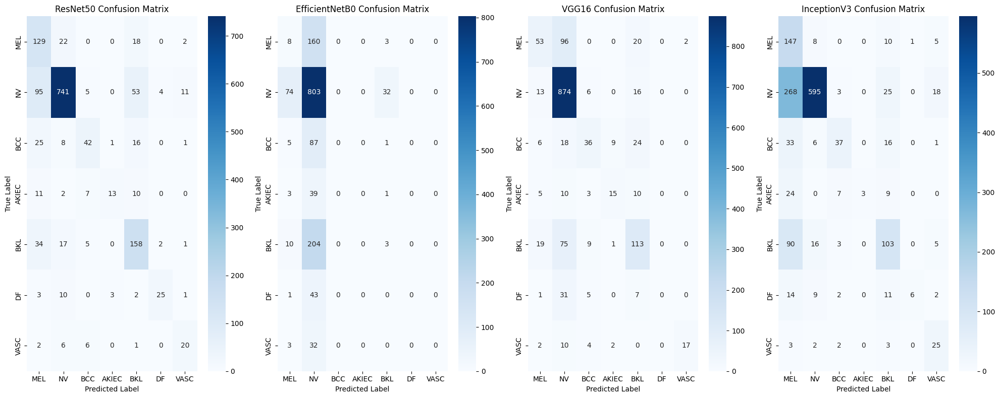

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, class_names, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_all_models_confusion_matrices(results, class_names):
    num_models = len(results)
    fig, axes = plt.subplots(1, num_models, figsize=(20, 8))

    for ax, (model_name, (y_true, y_pred)) in zip(axes, results.items()):
        cm = confusion_matrix(y_true, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax)
        ax.set_title(f'{model_name} Confusion Matrix')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

# Define your class names
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Plot confusion matrices for all models
plot_all_models_confusion_matrices(results, class_names)

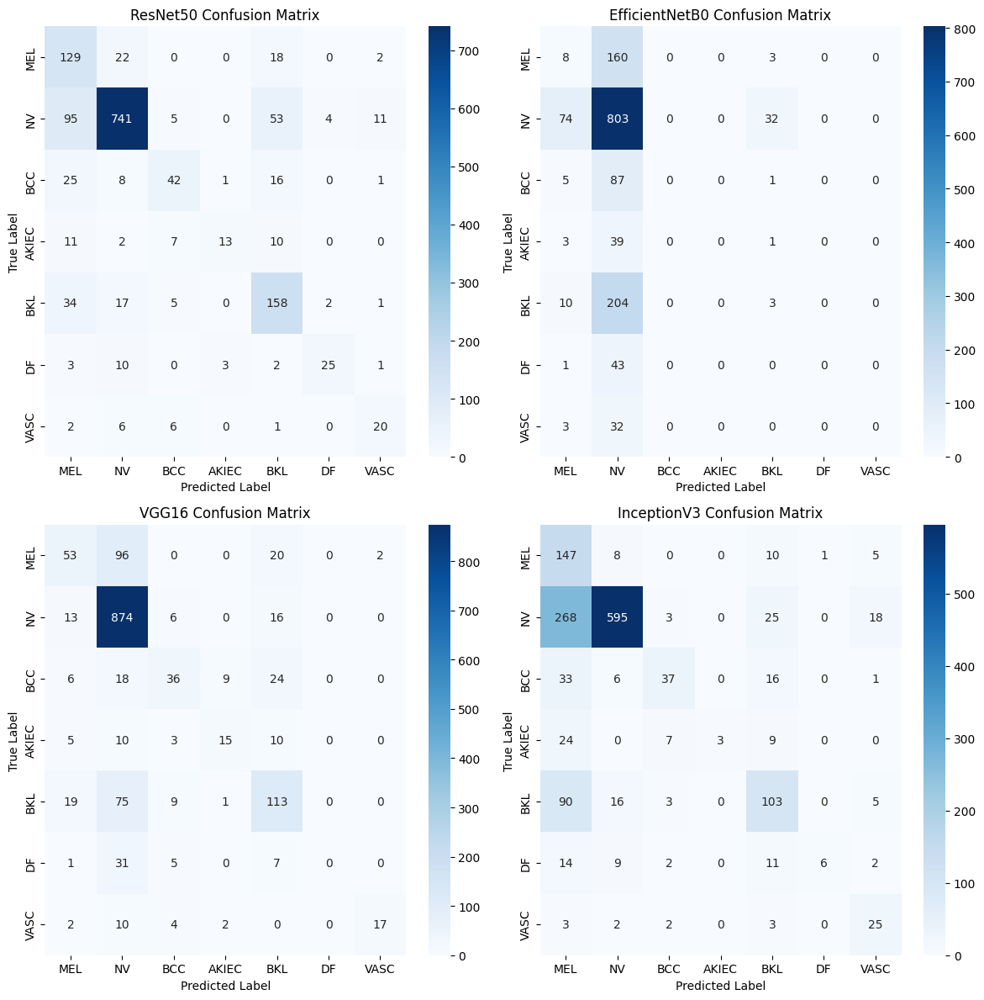

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, class_names, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(14, 14))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_all_models_confusion_matrices(results, class_names):
    num_models = len(results)
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))  # Adjust for 2x2 grid

    # Flatten the axes array for easier iteration
    axes = axes.flatten()

    for ax, (model_name, (y_true, y_pred)) in zip(axes, results.items()):
        cm = confusion_matrix(y_true, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax)
        ax.set_title(f'{model_name} Confusion Matrix')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('True Label')

    # If there are fewer than 4 models, remove any unused subplots
    for i in range(num_models, 4):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

# Define your class names
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Example usage
plot_all_models_confusion_matrices(results, class_names)


Visual Evaluation

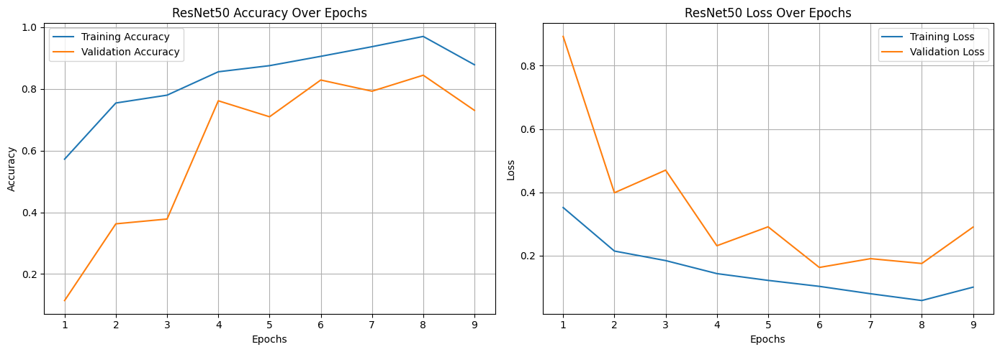

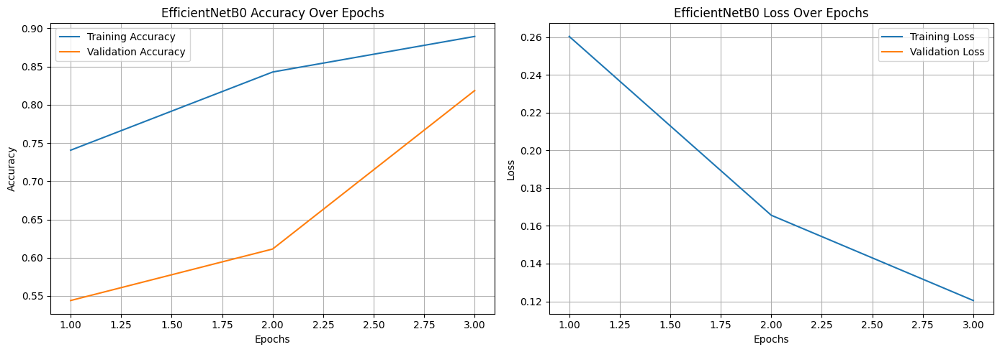

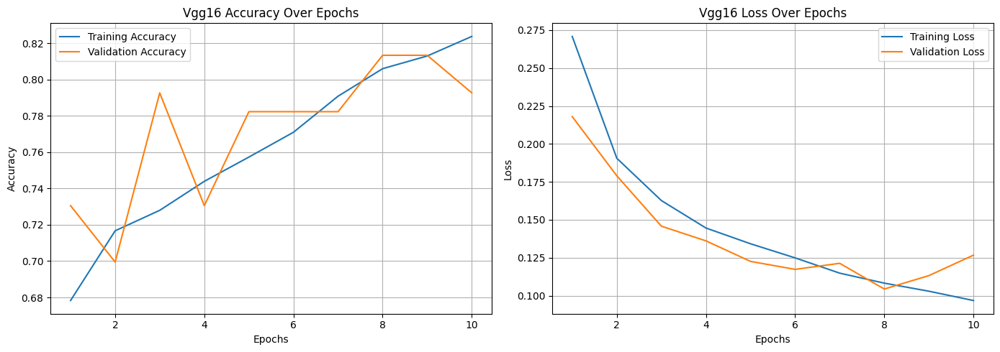

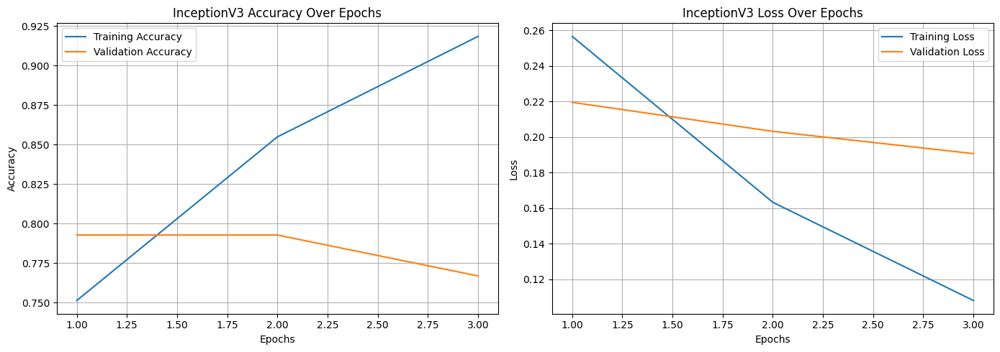

In [ ]:
import matplotlib.pyplot as plt

# Function to collect metrics during training
def collect_metrics(history, model_name, metrics):
    metrics[model_name]['accuracy'] = history.history['accuracy']
    metrics[model_name]['val_accuracy'] = history.history['val_accuracy']
    metrics[model_name]['loss'] = history.history['loss']
    metrics[model_name]['val_loss'] = history.history['val_loss']

# Function to plot loss vs accuracy over epochs for a model
def plot_performance(metrics, model_name):
    epochs = range(1, len(metrics[model_name]['accuracy']) + 1)

    plt.figure(figsize=(14, 5))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics[model_name]['accuracy'], label='Training Accuracy')
    plt.plot(epochs, metrics[model_name]['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics[model_name]['loss'], label='Training Loss')
    plt.plot(epochs, metrics[model_name]['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Dictionary to store metrics for each model
metrics = {
    'ResNet50': {'accuracy': [], 'val_accuracy': [], 'loss': [], 'val_loss': []},
    'EfficientNetB0': {'accuracy': [], 'val_accuracy': [], 'loss': [], 'val_loss': []},
    'Vgg16': {'accuracy': [], 'val_accuracy': [], 'loss': [], 'val_loss': []},
    'InceptionV3': {'accuracy': [], 'val_accuracy': [], 'loss': [], 'val_loss': []}
}

# Example: collect metrics for each model (after training)
# Replace `history_<model_name>` with the actual history object returned by `model.fit()`
collect_metrics(history_resnet50, 'ResNet50', metrics)
collect_metrics(history_efficientnetb0, 'EfficientNetB0', metrics)
collect_metrics(history_vgg16, 'Vgg16', metrics)
collect_metrics(history_inceptionv3, 'InceptionV3', metrics)

# Example: Plot performance for each model
plot_performance(metrics, 'ResNet50')
plot_performance(metrics, 'EfficientNetB0')
plot_performance(metrics, 'Vgg16')
plot_performance(metrics, 'InceptionV3')


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize

# Register the focal loss function
@tf.keras.utils.register_keras_serializable()
def focal_loss(gamma=2., alpha=.25):
    def focal_loss_fixed(y_true, y_pred):
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.convert_to_tensor(y_pred, tf.float32)
        alpha_t = y_true * alpha + (tf.ones_like(y_true) - y_true) * (1 - alpha)
        p_t = y_true * y_pred + (tf.ones_like(y_true) - y_true) * (tf.ones_like(y_true) - y_pred)
        fl = - alpha_t * tf.pow((tf.ones_like(y_true) - p_t), gamma) * tf.math.log(p_t)
        return tf.reduce_sum(fl, axis=-1)
    return focal_loss_fixed

# Function to load and evaluate models
def evaluate_model(model_path, test_data):
    model = tf.keras.models.load_model(model_path, custom_objects={'focal_loss_fixed': focal_loss()})
    test_loss, test_accuracy = model.evaluate(test_data, verbose=1)

    # Extract true labels and predicted probabilities
    y_true = np.concatenate([y for x, y in test_data], axis=0)
    y_pred_prob = model.predict(test_data)
    y_pred = np.argmax(y_pred_prob, axis=-1)
    y_true = np.argmax(y_true, axis=-1)

    return test_loss, test_accuracy, y_true, y_pred, y_pred_prob


In [ ]:
# Plot ROC Curves
def plot_roc_curves(y_true, y_pred_prob, class_names, model_name):
    y_true_binarized = label_binarize(y_true, classes=[i for i in range(len(class_names))])
    plt.figure(figsize=(10, 8))
    for i in range(len(class_names)):
        fpr, tpr, _ = roc_curve(y_true_binarized[:, i], y_pred_prob[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f'ROC Curve for {model_name}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()


In [ ]:
# Plot Precision-Recall Curves
def plot_precision_recall_curves(y_true, y_pred_prob, class_names, model_name):
    y_true_binarized = label_binarize(y_true, classes=[i for i in range(len(class_names))])
    plt.figure(figsize=(10, 8))
    for i in range(len(class_names)):
        precision, recall, _ = precision_recall_curve(y_true_binarized[:, i], y_pred_prob[:, i])
        plt.plot(recall, precision, label=f'{class_names[i]}')

    plt.title(f'Precision-Recall Curve for {model_name}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend(loc="lower left")
    plt.grid(True)
    plt.show()

In [ ]:
# Plot Normalized Confusion Matrix
def plot_normalized_confusion_matrix(y_true, y_pred, class_names, model_name):
    cm = confusion_matrix(y_true, y_pred, normalize='true')
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Normalized Confusion Matrix for {model_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [ ]:
# Plot Loss vs Accuracy
def plot_loss_vs_accuracy(history, model_name):
    epochs = range(1, len(history.history['accuracy']) + 1)
    plt.figure(figsize=(14, 5))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history.history['accuracy'], label='Training Accuracy')
    plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history.history['loss'], label='Training Loss')
    plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


In [ ]:
model_paths = {
    'ResNet50': 'resnet50_best_model.keras',
    'EfficientNetB0': 'efficientnetb0_best_model.keras',
    'Vgg16': 'vgg16_best_model.keras',
    'InceptionV3': 'inceptionv3_best_model.keras'
}
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Collect results for each model
for model_name, model_path in model_paths.items():
    print(f'Evaluating {model_name}...')
    test_loss, test_accuracy, y_true, y_pred, y_pred_prob = evaluate_model(model_path, test_data)

    # Print classification report
    print(f'\nClassification Report for {model_name}:\n')
    report = classification_report(y_true, y_pred, target_names=class_names)
    print(report)

Evaluating ResNet50...
48/48 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7879 - loss: 0.2008
48/48 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

Classification Report for ResNet50:

              precision    recall  f1-score   support

         MEL       0.43      0.75      0.55       171
          NV       0.92      0.82      0.86       909
         BCC       0.65      0.45      0.53        93
       AKIEC       0.76      0.30      0.43        43
         BKL       0.61      0.73      0.67       217
          DF       0.81      0.57      0.67        44
        VASC       0.56      0.57      0.56        35

    accuracy                           0.75      1512
   macro avg       0.68      0.60      0.61      1512
weighted avg       0.79      0.75      0.75      1512

Evaluating EfficientNetB0...
48/48 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - accuracy: 0.5622 - loss: inf
48/48 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step

Classification Report for EfficientNetB0:

              precision    recall  f1-sco

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - accuracy: 0.7523 - loss: 0.1452
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

Classification Report for Vgg16:

              precision    recall  f1-score   support

         MEL       0.54      0.31      0.39       171
          NV       0.78      0.96      0.86       909
         BCC       0.57      0.39      0.46        93
       AKIEC       0.56      0.35      0.43        43
         BKL       0.59      0.52      0.56       217
          DF       0.00      0.00      0.00        44
        VASC       0.89      0.49      0.63        35

    accuracy                           0.73      1512
   macro avg       0.56      0.43      0.48      1512
weighted avg       0.69      0.73      0.70      1512

Evaluating InceptionV3...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


48/48 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - accuracy: 0.7664 - loss: 0.2110
48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step

Classification Report for InceptionV3:

              precision    recall  f1-score   support

         MEL       0.42      0.47      0.45       171
          NV       0.81      0.93      0.87       909
         BCC       0.82      0.35      0.50        93
       AKIEC       0.56      0.35      0.43        43
         BKL       0.63      0.47      0.53       217
          DF       0.64      0.48      0.55        44
        VASC       0.92      0.34      0.50        35

    accuracy                           0.73      1512
   macro avg       0.69      0.49      0.55      1512
weighted avg       0.73      0.73      0.72      1512



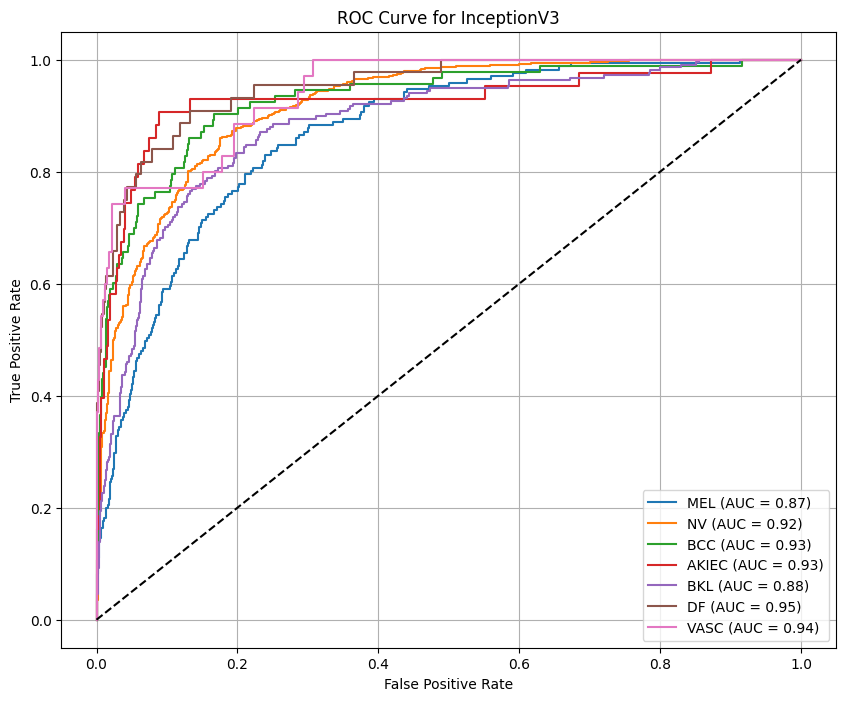

In [ ]:
# Plot ROC Curve
plot_roc_curves(y_true, y_pred_prob, class_names, model_name)

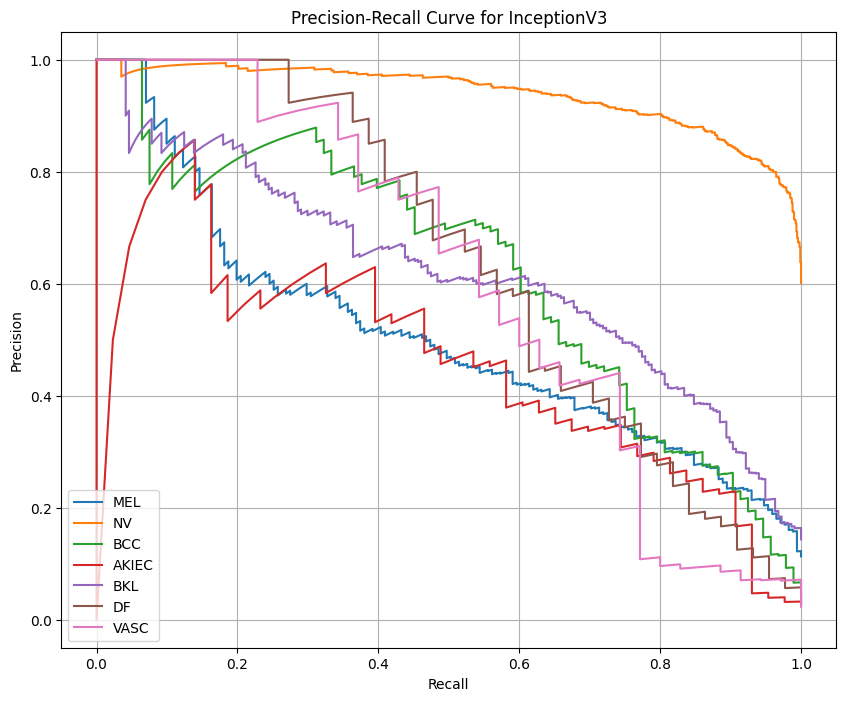

In [ ]:
# Plot Precision-Recall Curve
plot_precision_recall_curves(y_true, y_pred_prob, class_names, model_name)


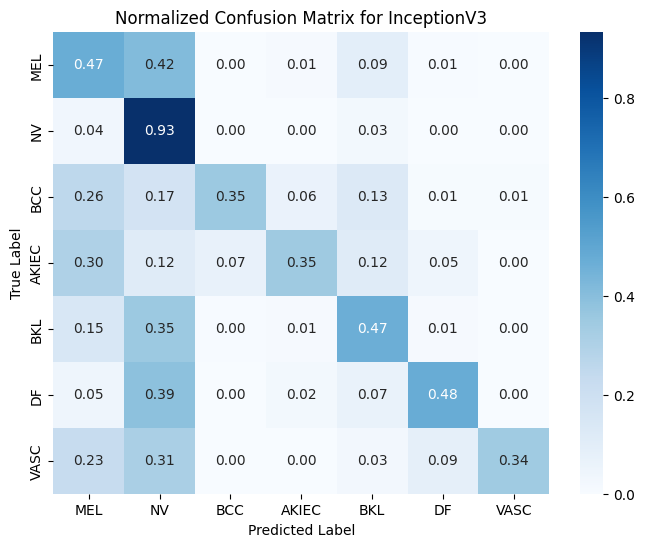

In [ ]:
# Plot Normalized Confusion Matrix
plot_normalized_confusion_matrix(y_true, y_pred, class_names, model_name)


48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step

Plotting for ResNet50...



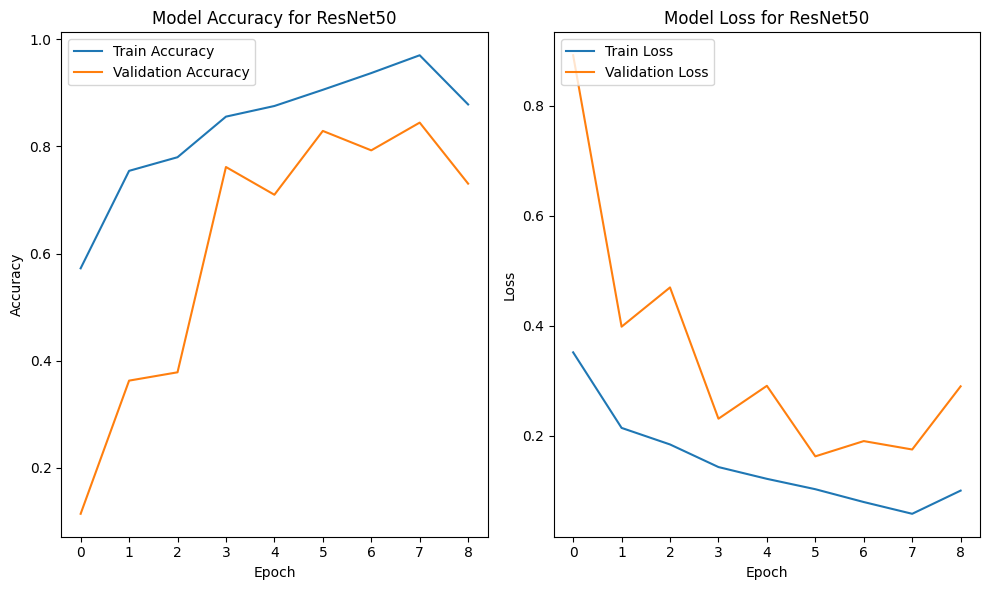

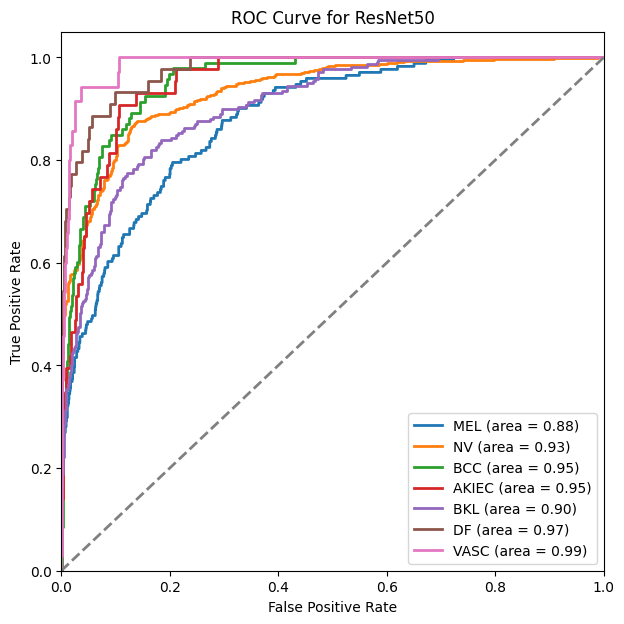

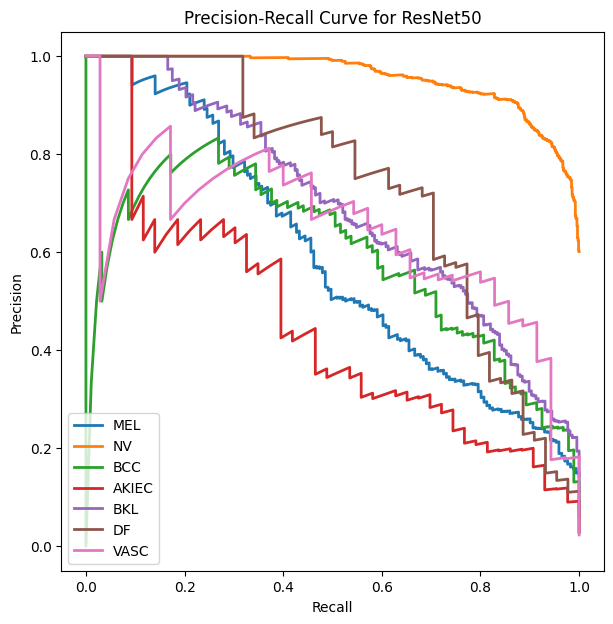


Plotting for EfficientNetB0...



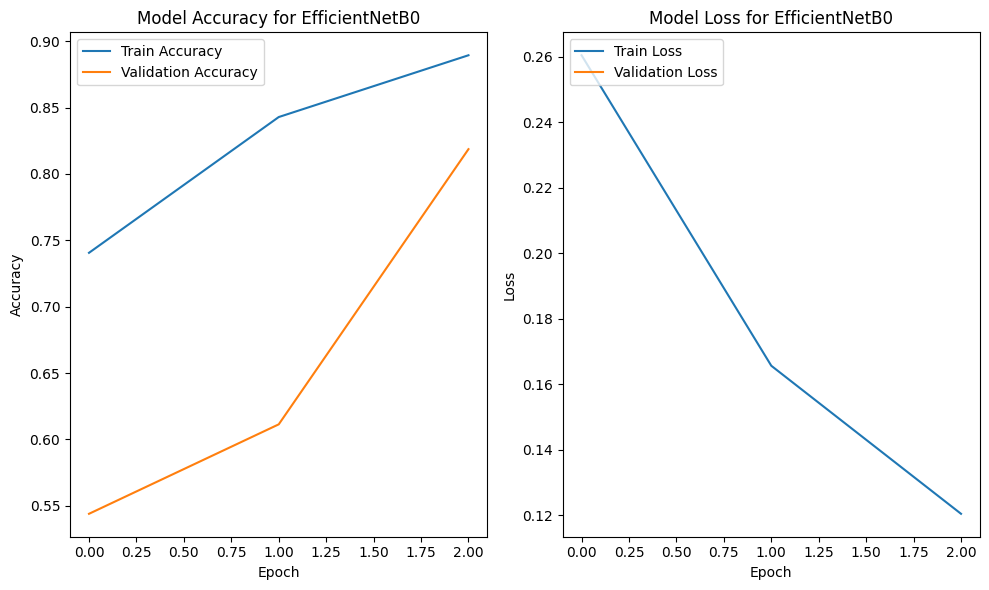

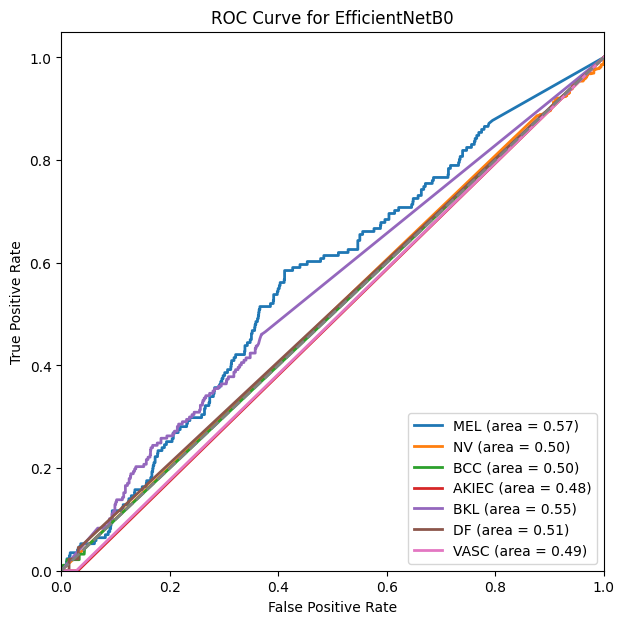

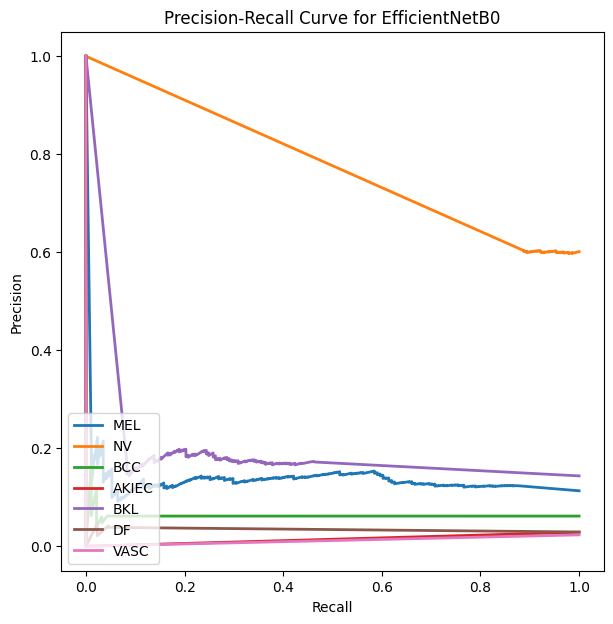


Plotting for VGG16...



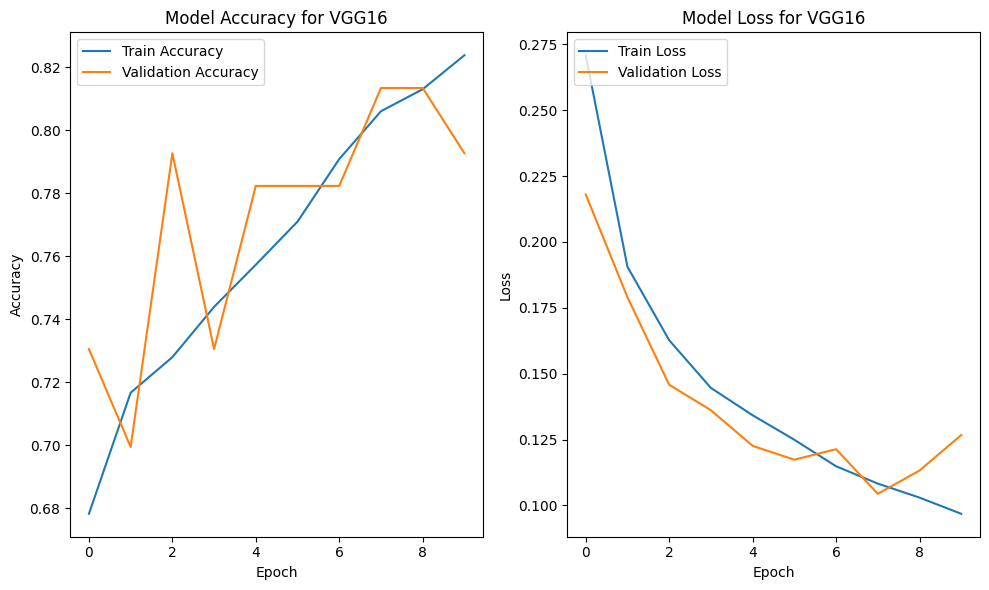

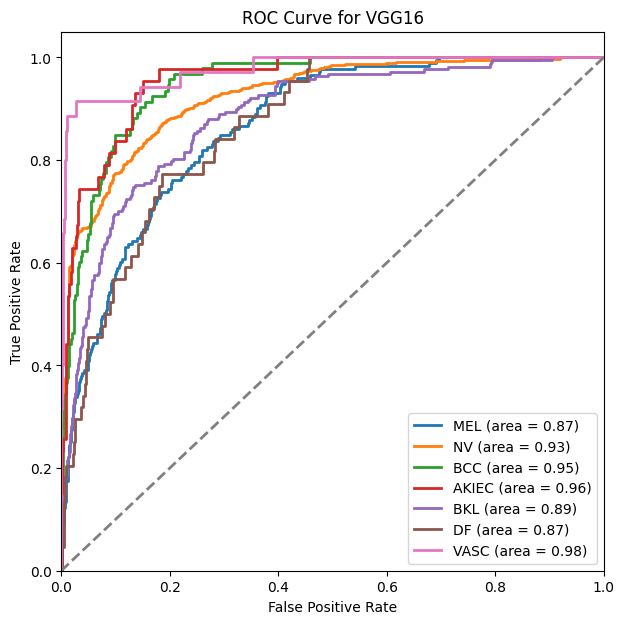

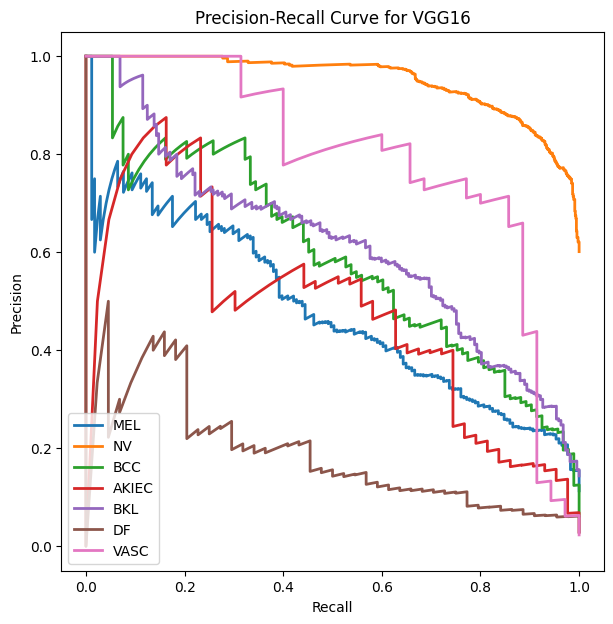


Plotting for InceptionV3...



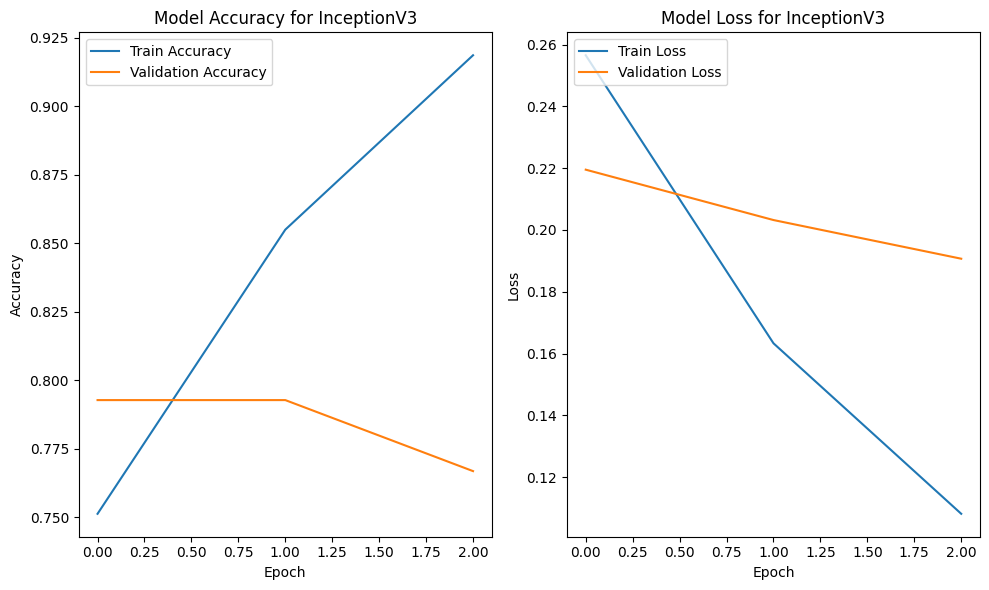

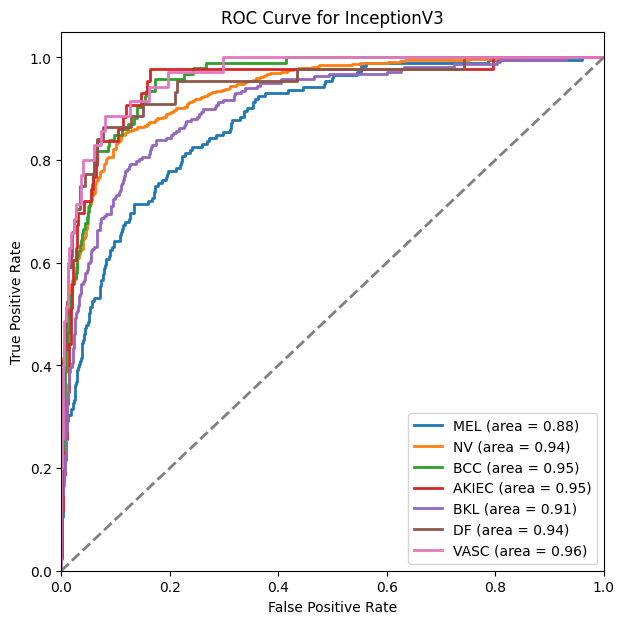

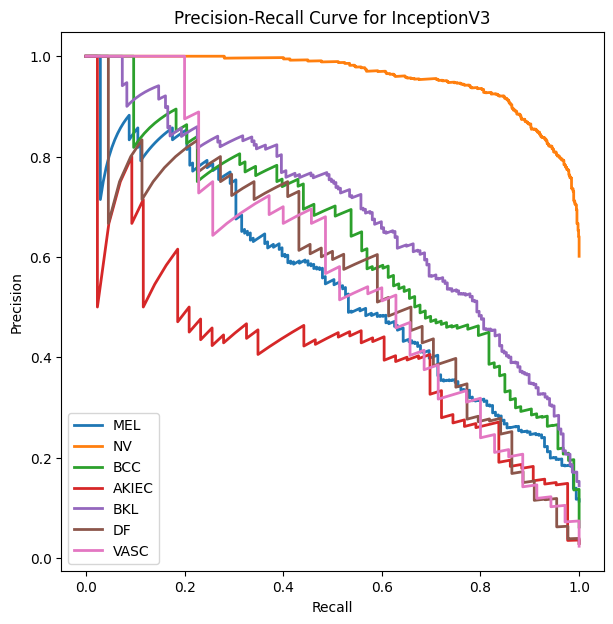

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve, auc, precision_recall_curve, classification_report

# Example class names (modify according to your task)
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Function to plot training history
def plot_training_history(history, model_name):
    if history is None:
        print(f"No training history available for {model_name}.")
        return

    # Plot training & validation accuracy values
    plt.figure(figsize=(10, 6))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Model Accuracy for {model_name}')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')

    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss for {model_name}')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

# Function to plot ROC curve
def plot_roc_curve(y_true, y_score, model_name, class_names):
    if len(y_true) == 0 or len(y_score) == 0:
        print(f"No scores available for {model_name}.")
        return

    # One-hot encode y_true if not already
    if len(y_true.shape) == 1:
        y_true = np.eye(len(class_names))[y_true]

    # Compute ROC curve and ROC area for each class
    plt.figure(figsize=(7, 7))
    for i in range(len(class_names)):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'{class_names[i]} (area = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

# Function to plot Precision-Recall curve
def plot_precision_recall_curve(y_true, y_score, model_name, class_names):
    if len(y_true) == 0 or len(y_score) == 0:
        print(f"No scores available for {model_name}.")
        return

    # One-hot encode y_true if not already
    if len(y_true.shape) == 1:
        y_true = np.eye(len(class_names))[y_true]

    # Compute precision-recall curve and average precision for each class
    plt.figure(figsize=(7, 7))
    for i in range(len(class_names)):
        precision, recall, _ = precision_recall_curve(y_true[:, i], y_score[:, i])
        plt.plot(recall, precision, lw=2, label=f'{class_names[i]}')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve for {model_name}')
    plt.legend(loc='lower left')
    plt.show()

# Assuming 'results' contains y_true and y_pred for each model
# 'model_scores' should contain the probability scores (predicted probabilities) for each model

# Replace 'history', 'y_true', 'y_pred', and 'model_scores' with your actual data for each model
models_data = {
    'ResNet50': {
        'history': history_resnet50,
        'y_true': results['ResNet50'][0],    # Replace with actual true labels for ResNet50
        'y_pred': results['ResNet50'][1],    # Replace with actual predicted labels for ResNet50
        'model_scores': resnet50_model.predict(test_data)  # Replace with actual predicted scores for ResNet50
    },
    'EfficientNetB0': {
        'history': history_efficientnetb0,
        'y_true': results['EfficientNetB0'][0],
        'y_pred': results['EfficientNetB0'][1],
        'model_scores': efficientnetb0_model.predict(test_data)
    },
    'VGG16': {
        'history': history_vgg16,
        'y_true': results['VGG16'][0],
        'y_pred': results['VGG16'][1],
        'model_scores': vgg16_model.predict(test_data)
    },
    'InceptionV3': {
        'history': history_inceptionv3,
        'y_true': results['InceptionV3'][0],
        'y_pred': results['InceptionV3'][1],
        'model_scores': inceptionv3_model.predict(test_data)
    }
}

# Iterate over each model and plot the required metrics
for model_name, data in models_data.items():
    print(f"\nPlotting for {model_name}...\n")

    # Plot training history
    plot_training_history(data['history'], model_name)

    # Plot ROC curve
    plot_roc_curve(data['y_true'], data['model_scores'], model_name, class_names)

    # Plot Precision-Recall curve
    plot_precision_recall_curve(data['y_true'], data['model_scores'], model_name, class_names)


Evaluating ResNet50...
48/48 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7879 - loss: 0.2008
48/48 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

Classification Report for ResNet50:

              precision    recall  f1-score   support

         MEL       0.43      0.75      0.55       171
          NV       0.92      0.82      0.86       909
         BCC       0.65      0.45      0.53        93
       AKIEC       0.76      0.30      0.43        43
         BKL       0.61      0.73      0.67       217
          DF       0.81      0.57      0.67        44
        VASC       0.56      0.57      0.56        35

    accuracy                           0.75      1512
   macro avg       0.68      0.60      0.61      1512
weighted avg       0.79      0.75      0.75      1512



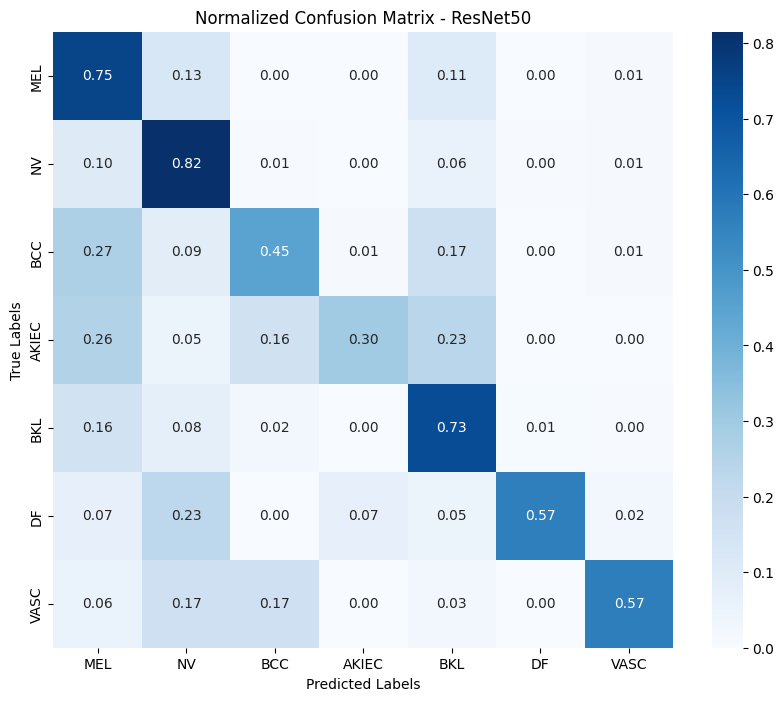

Evaluating EfficientNetB0...
48/48 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - accuracy: 0.5534 - loss: inf
48/48 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step

Classification Report for EfficientNetB0:

              precision    recall  f1-score   support

         MEL       0.08      0.05      0.06       171
          NV       0.59      0.88      0.71       909
         BCC       0.00      0.00      0.00        93
       AKIEC       0.00      0.00      0.00        43
         BKL       0.07      0.01      0.02       217
          DF       0.00      0.00      0.00        44
        VASC       0.00      0.00      0.00        35

    accuracy                           0.54      1512
   macro avg       0.11      0.13      0.11      1512
weighted avg       0.37      0.54      0.43      1512



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


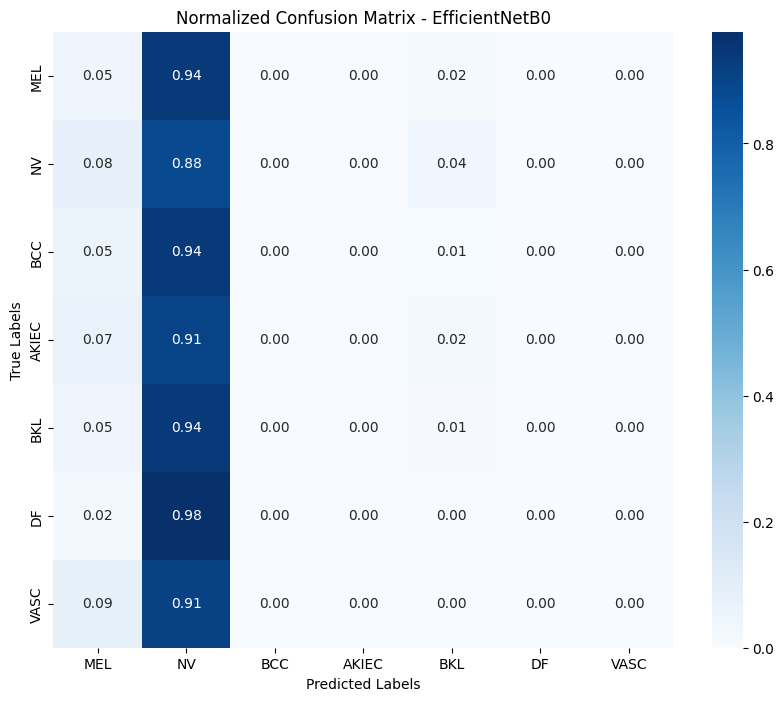

Evaluating VGG16...
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - accuracy: 0.7523 - loss: 0.1452
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

Classification Report for VGG16:

              precision    recall  f1-score   support

         MEL       0.54      0.31      0.39       171
          NV       0.78      0.96      0.86       909
         BCC       0.57      0.39      0.46        93
       AKIEC       0.56      0.35      0.43        43
         BKL       0.59      0.52      0.56       217
          DF       0.00      0.00      0.00        44
        VASC       0.89      0.49      0.63        35

    accuracy                           0.73      1512
   macro avg       0.56      0.43      0.48      1512
weighted avg       0.69      0.73      0.70      1512



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


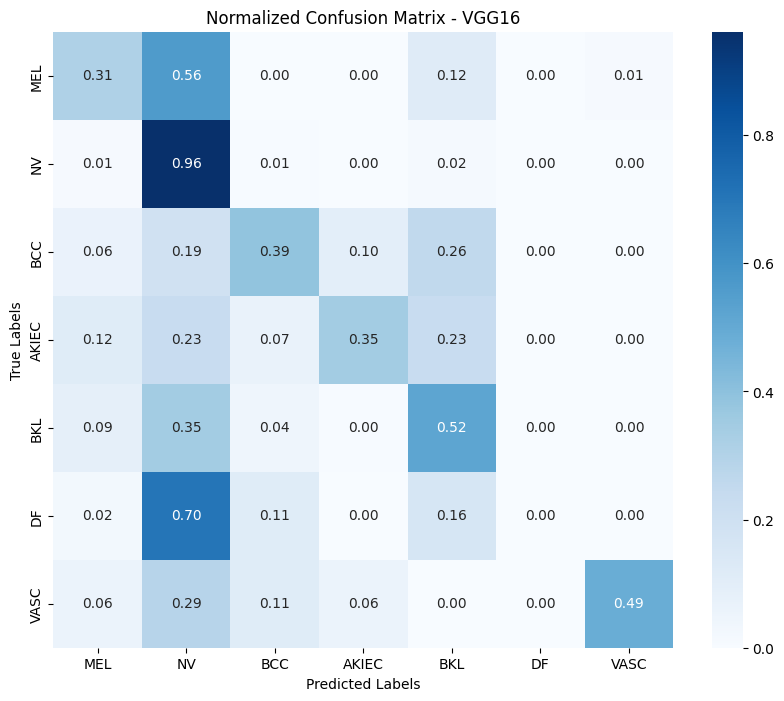

Evaluating InceptionV3...
48/48 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6529 - loss: 0.2968
48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step

Classification Report for InceptionV3:

              precision    recall  f1-score   support

         MEL       0.25      0.86      0.39       171
          NV       0.94      0.65      0.77       909
         BCC       0.69      0.40      0.50        93
       AKIEC       1.00      0.07      0.13        43
         BKL       0.58      0.47      0.52       217
          DF       0.86      0.14      0.24        44
        VASC       0.45      0.71      0.55        35

    accuracy                           0.61      1512
   macro avg       0.68      0.47      0.44      1512
weighted avg       0.78      0.61      0.64      1512



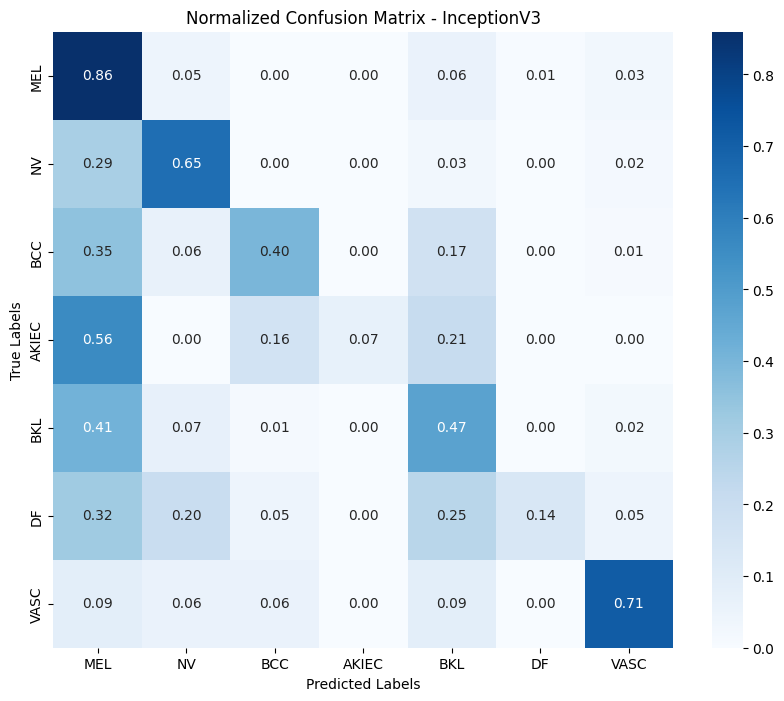

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Register the focal loss function
@tf.keras.utils.register_keras_serializable()
def focal_loss(gamma=2., alpha=.25):
    def focal_loss_fixed(y_true, y_pred):
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.convert_to_tensor(y_pred, tf.float32)
        alpha_t = y_true * alpha + (tf.ones_like(y_true) - y_true) * (1 - alpha)
        p_t = y_true * y_pred + (tf.ones_like(y_true) - y_true) * (tf.ones_like(y_true) - y_pred)
        fl = - alpha_t * tf.pow((tf.ones_like(y_true) - p_t), gamma) * tf.math.log(p_t)
        return tf.reduce_sum(fl, axis=-1)
    return focal_loss_fixed

# Function to load and evaluate models
def evaluate_model(model_path, test_data):
    # Load the model with custom_objects for the focal loss function
    try:
        model = tf.keras.models.load_model(model_path, custom_objects={'focal_loss_fixed': focal_loss()})
    except Exception as e:
        print(f"Error loading model {model_path}: {e}")
        return None, None, None, None

    # Evaluate the model on the test dataset
    test_loss, test_accuracy = model.evaluate(test_data, verbose=1)

    # Extract true labels and predicted labels
    y_true = np.concatenate([y for x, y in test_data], axis=0)
    y_pred = np.argmax(model.predict(test_data), axis=-1)
    y_true = np.argmax(y_true, axis=-1)

    return test_loss, test_accuracy, y_true, y_pred

# Function to plot normalized confusion matrix
def plot_normalized_confusion_matrix(y_true, y_pred, model_name, class_names):
    # Calculate the confusion matrix
    cm = confusion_matrix(y_true, y_pred, normalize='true')

    # Create a new figure
    plt.figure(figsize=(10, 8))

    # Plot the confusion matrix using seaborn heatmap
    sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

    # Add title and labels
    plt.title(f'Normalized Confusion Matrix - {model_name}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')

    # Show the plot
    plt.show()

# Define model paths (update with correct paths if needed)
model_paths = {
    'ResNet50': '/content/drive/MyDrive/New_Model_Checkpoints/resnet50_final.keras',
    'EfficientNetB0': '/content/drive/MyDrive/New_Model_Checkpoints/efficientnetb0_final.keras',
    'VGG16': '/content/drive/MyDrive/New_Model_Checkpoints/vgg16_final.keras',
    'InceptionV3': '/content/drive/MyDrive/New_Model_Checkpoints/inceptionv3_final.keras'
}

# Class names (modify according to your task)
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Collect results for each model
results = {}
for model_name, model_path in model_paths.items():
    print(f'Evaluating {model_name}...')
    test_loss, test_accuracy, y_true, y_pred = evaluate_model(model_path, test_data)

    if y_true is not None and y_pred is not None:
        results[model_name] = (y_true, y_pred)

        # Print classification report for each model
        print(f'\nClassification Report for {model_name}:\n')
        report = classification_report(y_true, y_pred, target_names=class_names)
        print(report)

        # Plot normalized confusion matrix for each model
        plot_normalized_confusion_matrix(y_true, y_pred, model_name, class_names)
    else:
        print(f"Skipping evaluation for {model_name} due to loading or data issues.")


Self Supervised learning

SIMCLR

In [ ]:
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'

# Load the CSV files
train_labels = pd.read_csv(train_csv_path)
val_labels = pd.read_csv(val_csv_path)
test_labels = pd.read_csv(test_csv_path)

# Preview the first few rows of each CSV
print("Training Data:")
print(train_labels.head())
print("\nValidation Data:")
print(val_labels.head())
print("\nTest Data:")
print(test_labels.head())

Training Data:
              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0024306.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0024307.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0024308.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
3  ISIC_0024309.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0024310.jpg  1.0  0.0  0.0    0.0  0.0  0.0   0.0

Validation Data:
              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0034321.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0034322.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0034323.jpg  0.0  0.0  1.0    0.0  0.0  0.0   0.0
3  ISIC_0034324.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
4  ISIC_0034325.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0

Test Data:
              image  MEL   NV  BCC  AKIEC  BKL   DF  VASC
0  ISIC_0034524.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
1  ISIC_0034525.jpg  0.0  1.0  0.0    0.0  0.0  0.0   0.0
2  ISIC_0034526.jpg  0.0  0.0  0.0    0.0  1.0  0.0   0.0
3  ISIC_0034527.jpg  0.0  1

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D
from sklearn.model_selection import train_test_split

# Define a projection head for SimCLR
def projection_head(x, output_dim=128):
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dense(output_dim)(x)  # Output dimension for contrastive learning (e.g., 128)
    return x

# Base model for feature extraction (ResNet50 here)
base_model_simclr = ResNet50(weights=None, include_top=False, input_shape=(224, 224, 3))

# Extract features and add projection head
x = GlobalAveragePooling2D()(base_model_simclr.output)
x = projection_head(x)
model_simclr = Model(inputs=base_model_simclr.input, outputs=x)


In [ ]:
# NT-Xent loss function
def nt_xent_loss(z_i, z_j, temperature=0.1):
    z_i = tf.math.l2_normalize(z_i, axis=1)
    z_j = tf.math.l2_normalize(z_j, axis=1)
    batch_size = tf.shape(z_i)[0]

    # Cosine similarity between all z_i and z_j pairs
    z = tf.concat([z_i, z_j], axis=0)
    similarities = tf.matmul(z, z, transpose_b=True) / temperature

    # Create the ground truth labels
    labels = tf.range(batch_size)
    labels = tf.concat([labels, labels], axis=0)

    # Compute loss (cross-entropy between softmax of similarities and labels)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, similarities, from_logits=True)
    return tf.reduce_mean(loss)

# Compile the model
model_simclr.compile(optimizer='adam')

In [ ]:
import tensorflow as tf
import numpy as np

# Updated data augmentation function
def data_augmentation(image):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.4)
    image = tf.image.random_contrast(image, lower=0.6, upper=1.4)
    image = tf.image.random_saturation(image, lower=0.6, upper=1.4)
    image = tf.image.random_hue(image, max_delta=0.2)
    image = tf.image.random_crop(image, size=[224, 224, 3])

    # Apply random rotation using tf.image.rot90
    # Randomly rotate the image by 0, 90, 180, or 270 degrees
    random_angle = np.random.choice([0, 1, 2, 3])
    image = tf.image.rot90(image, k=random_angle)

    image = tf.image.per_image_standardization(image)
    return image


In [ ]:
# Load image function
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image

# Parsing function to create two augmented views
def parse_function(image_file, label):
    image = load_image(image_file)
    image_aug1 = data_augmentation(image)
    image_aug2 = data_augmentation(image)
    return (image_aug1, image_aug2), label  # Return two augmented views

# Load and preprocess the dataset
def create_dataset(csv_path, image_dir):
    df = pd.read_csv(csv_path)
    image_files = [os.path.join(image_dir, fname) for fname in df['image']]
    labels = df.drop(columns=['image']).values

    dataset = tf.data.Dataset.from_tensor_slices((image_files, labels))
    dataset = dataset.map(parse_function, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(64).prefetch(tf.data.AUTOTUNE)
    return dataset

# Paths
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'

ssl_train_data = create_dataset(train_csv_path, train_image_dir)


In [ ]:
import tensorflow as tf
import numpy as np

# Set the number of epochs and steps per epoch
epochs = 50
steps_per_epoch = 157  # Adjust based on your dataset size and batch size

# Learning rate scheduler (Exponential Decay)
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

# Adam optimizer with learning rate scheduler
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)


# Enable mixed precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Custom training loop for SimCLR with a learning rate scheduler
for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    epoch_loss = 0  # Initialize loss for the epoch

    for step, ((view1, view2), _) in enumerate(ssl_train_data):
        if step >= steps_per_epoch:  # Stop after the expected number of steps
            break

        with tf.GradientTape() as tape:
            # Forward pass for two augmented views
            z_i = model_simclr(view1, training=True)
            z_j = model_simclr(view2, training=True)

            # Compute contrastive loss
            loss = nt_xent_loss(z_i, z_j)

        # Compute and apply gradients
        grads = tape.gradient(loss, model_simclr.trainable_weights)
        optimizer.apply_gradients(zip(grads, model_simclr.trainable_weights))

        epoch_loss += loss.numpy()

        if step % 10 == 0:  # Print every 10 steps for feedback
            print(f"Step {step}, Loss: {loss.numpy()}")

    # Calculate and print average loss for the epoch
    avg_epoch_loss = epoch_loss / steps_per_epoch
    print(f"Epoch {epoch + 1} completed with average loss: {avg_epoch_loss}")

# Save the trained model
model_simclr.save('simclr_model.keras')
print("Model saved as simclr_model.keras")


Epoch 1/50
Step 0, Loss: 4.463727951049805
Step 10, Loss: 3.2458598613739014
Step 20, Loss: 3.1055357456207275
Step 30, Loss: 2.910775661468506
Step 40, Loss: 3.2339301109313965
Step 50, Loss: 2.9511163234710693
Step 60, Loss: 2.8887624740600586
Step 70, Loss: 3.021998405456543
Step 80, Loss: 2.8494935035705566
Step 90, Loss: 2.9017748832702637
Step 100, Loss: 2.8446333408355713
Step 110, Loss: 2.8306796550750732
Step 120, Loss: 2.919976234436035
Step 130, Loss: 3.0046088695526123
Step 140, Loss: 3.103416919708252
Step 150, Loss: 2.8023335933685303
Epoch 1 completed with average loss: 2.9954140459655956
Epoch 2/50
Step 0, Loss: 3.1795806884765625
Step 10, Loss: 2.9148340225219727
Step 20, Loss: 2.716008424758911
Step 30, Loss: 2.903780460357666
Step 40, Loss: 2.702580451965332
Step 50, Loss: 2.4684293270111084
Step 60, Loss: 2.767258644104004
Step 70, Loss: 3.0480546951293945
Step 80, Loss: 2.824622631072998
Step 90, Loss: 2.6915206909179688
Step 100, Loss: 2.7916135787963867
Step 110,

In [ ]:
# Define the new directory path
new_directory = '/content/drive/MyDrive/SimCLR_Models/'

# Check if the directory exists, if not, create it
if not os.path.exists(new_directory):
    os.makedirs(new_directory)  # This will create the directory

# Define the full path for the saved model file
model_save_path = os.path.join(new_directory, 'simclr_model.keras')

# Save the model to the new directory
model_simclr.save(model_save_path)

print(f"Model saved to: {model_save_path}")

Model saved to: /content/drive/MyDrive/SimCLR_Models/simclr_model.keras


In [ ]:
import os

# Define the directory path where the model is saved
directory_path = '/content/drive/MyDrive/SimCLR_Models/'

# List all files in the specified directory
files = os.listdir(directory_path)

# Print the list of files
print(f"Files in {directory_path}:")
for file in files:
    print(file)


Files in /content/drive/MyDrive/SimCLR_Models/:
simclr_model.keras


Check how well the simcle has learned for 50 epochs


In [ ]:
import tensorflow as tf
import numpy as np

# 1. Load the saved SimCLR model
saved_model_path = 'simclr_model.keras'
model_simclr = tf.keras.models.load_model(saved_model_path)

# 2. Extract the base encoder (remove the projection head)
# The feature extractor ends at the global_average_pooling2d layer
feature_extractor = tf.keras.Model(
    inputs=model_simclr.input,
    outputs=model_simclr.get_layer("global_average_pooling2d").output
)

# 3. Define a function to extract features from the dataset
def extract_features(dataset, feature_extractor):
    features = []
    labels = []
    for (view1, view2), label in dataset:
        # Use the feature extractor model to get features
        feature = feature_extractor(view1)  # Extract features from view1
        features.append(feature.numpy())
        labels.append(label.numpy())
    return np.concatenate(features), np.concatenate(labels)

# 4. Extract features using the feature extractor
features_train, labels_train = extract_features(ssl_train_data, feature_extractor)

# Now `features_train` contains the extracted features, and `labels_train` contains the corresponding labels


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 438 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 0 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# Check the shape of labels_train
print("Shape of labels_train:", labels_train.shape)

# Flatten labels if necessary
# Uncomment this line only if your labels are one-hot encoded and need to be flattened
# labels_train = labels_train.argmax(axis=1)

# Train a logistic regression classifier on the extracted features
clf = LogisticRegression(max_iter=2000)
clf.fit(features_train, labels_train)

# Print training accuracy
train_preds = clf.predict(features_train)
print("Training Accuracy:", accuracy_score(labels_train, train_preds))
print(classification_report(labels_train, train_preds))


Shape of labels_train: (10015,)
Training Accuracy: 0.9369945082376435
              precision    recall  f1-score   support

           0       0.88      0.75      0.81      1113
           1       0.94      0.98      0.96      6705
           2       0.98      0.98      0.98       514
           3       0.98      0.98      0.98       327
           4       0.91      0.83      0.87      1099
           5       1.00      1.00      1.00       115
           6       1.00      0.97      0.99       142

    accuracy                           0.94     10015
   macro avg       0.96      0.93      0.94     10015
weighted avg       0.94      0.94      0.94     10015



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


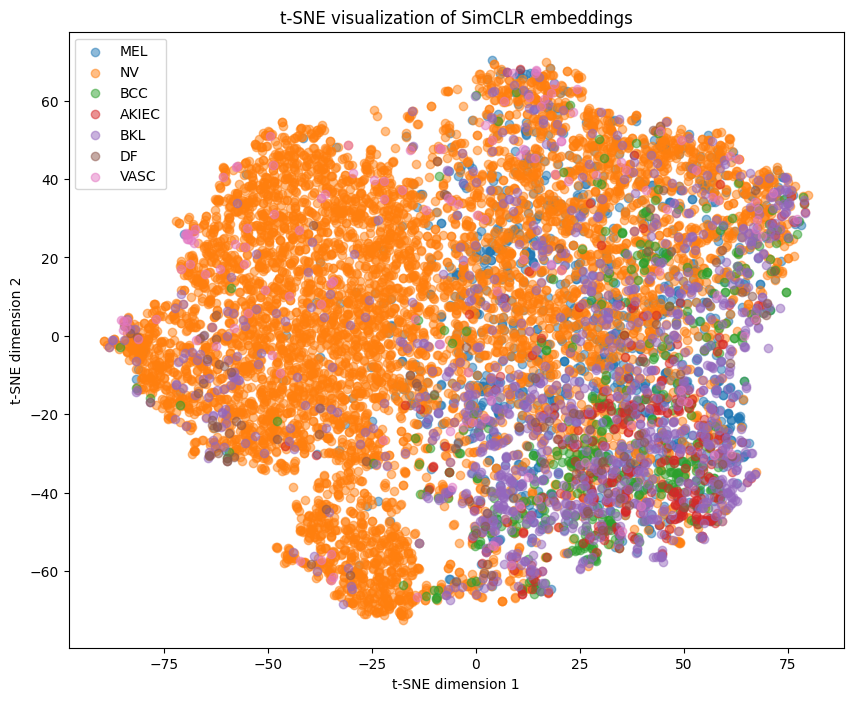

In [ ]:
# Using t-SNE for visualization
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features_train)

# Plotting the t-SNE representation
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(labels_train == i)
    plt.scatter(features_2d[indices, 0], features_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE visualization of SimCLR embeddings")
plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.show()


For 100 epochs

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D
from sklearn.model_selection import train_test_split

# Define a projection head for SimCLR
def projection_head(x, output_dim=128):
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dense(output_dim)(x)  # Output dimension for contrastive learning (e.g., 128)
    return x

# Base model for feature extraction (ResNet50 here)
base_model_simclr = ResNet50(weights=None, include_top=False, input_shape=(224, 224, 3))

# Extract features and add projection head
x = GlobalAveragePooling2D()(base_model_simclr.output)
x = projection_head(x)
model_simclr = Model(inputs=base_model_simclr.input, outputs=x)


In [ ]:
# NT-Xent loss function
def nt_xent_loss(z_i, z_j, temperature=0.1):
    z_i = tf.math.l2_normalize(z_i, axis=1)
    z_j = tf.math.l2_normalize(z_j, axis=1)
    batch_size = tf.shape(z_i)[0]

    # Cosine similarity between all z_i and z_j pairs
    z = tf.concat([z_i, z_j], axis=0)
    similarities = tf.matmul(z, z, transpose_b=True) / temperature

    # Create the ground truth labels
    labels = tf.range(batch_size)
    labels = tf.concat([labels, labels], axis=0)

    # Compute loss (cross-entropy between softmax of similarities and labels)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, similarities, from_logits=True)
    return tf.reduce_mean(loss)

# Compile the model
model_simclr.compile(optimizer='adam')

In [ ]:
import tensorflow as tf
import numpy as np

# Updated data augmentation function
def data_augmentation(image):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.4)
    image = tf.image.random_contrast(image, lower=0.6, upper=1.4)
    image = tf.image.random_saturation(image, lower=0.6, upper=1.4)
    image = tf.image.random_hue(image, max_delta=0.2)
    image = tf.image.random_crop(image, size=[224, 224, 3])

    # Apply random rotation using tf.image.rot90
    # Randomly rotate the image by 0, 90, 180, or 270 degrees
    random_angle = np.random.choice([0, 1, 2, 3])
    image = tf.image.rot90(image, k=random_angle)

    image = tf.image.per_image_standardization(image)
    return image


In [ ]:
# Load image function
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image

# Parsing function to create two augmented views
def parse_function(image_file, label):
    image = load_image(image_file)
    image_aug1 = data_augmentation(image)
    image_aug2 = data_augmentation(image)
    return (image_aug1, image_aug2), label  # Return two augmented views

# Load and preprocess the dataset
def create_dataset(csv_path, image_dir):
    df = pd.read_csv(csv_path)
    image_files = [os.path.join(image_dir, fname) for fname in df['image']]
    labels = df.drop(columns=['image']).values

    dataset = tf.data.Dataset.from_tensor_slices((image_files, labels))
    dataset = dataset.map(parse_function, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(64).prefetch(tf.data.AUTOTUNE)
    return dataset

# Paths
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'

ssl_train_data = create_dataset(train_csv_path, train_image_dir)


In [ ]:
import tensorflow as tf
import numpy as np

# Set the number of epochs and steps per epoch
epochs = 100
steps_per_epoch = 101  # Adjust based on your dataset size and batch size
validation_steps = 4

# Learning rate scheduler (Exponential Decay)
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

# Adam optimizer with learning rate scheduler
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)


# Enable mixed precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')


# Paths for the training and validation datasets
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
val_image_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'


# Create training and validation datasets
ssl_train_data = create_dataset(train_csv_path, train_image_dir)
ssl_val_data = create_dataset(val_csv_path, val_image_dir)

# Custom training loop for SimCLR with a learning rate scheduler
for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    epoch_loss = 0  # Initialize loss for the epoch

    for step, ((view1, view2), _) in enumerate(ssl_train_data):
        if step >= steps_per_epoch:  # Stop after the expected number of steps
            break

        with tf.GradientTape() as tape:
            # Forward pass for two augmented views
            z_i = model_simclr(view1, training=True)
            z_j = model_simclr(view2, training=True)

            # Compute contrastive loss
            loss = nt_xent_loss(z_i, z_j)

        # Compute and apply gradients
        grads = tape.gradient(loss, model_simclr.trainable_weights)
        optimizer.apply_gradients(zip(grads, model_simclr.trainable_weights))

        epoch_loss += loss.numpy()

        if step % 50 == 0:  # Print every 10 steps for feedback
            print(f"Step {step}, Loss: {loss.numpy()}")

    # Calculate and print average loss for the epoch
    avg_epoch_loss = epoch_loss / steps_per_epoch
    print(f"Epoch {epoch + 1} completed with average loss: {avg_epoch_loss}")

    # Validation step
    val_loss = 0
    for step, ((view1, view2), _) in enumerate(ssl_val_data):
        if step >= validation_steps:  # Limit the number of validation steps
            break

        # Forward pass for two augmented views
        z_i = model_simclr(view1, training=False)
        z_j = model_simclr(view2, training=False)

        # Compute contrastive loss
        loss = nt_xent_loss(z_i, z_j)
        val_loss += loss.numpy()

    avg_val_loss = val_loss / validation_steps
    print(f"Validation Loss after Epoch {epoch + 1}: {avg_val_loss}")

# Save the trained model
model_simclr.save('simclr_model100.keras')
print("Model saved as simclr_model100.keras")


Epoch 1/100
Step 0, Loss: 4.515625
Step 50, Loss: 2.904296875
Step 100, Loss: 2.888671875
Epoch 1 completed with average loss: 3.06041150990099
Validation Loss after Epoch 1: 3.70068359375
Epoch 2/100
Step 0, Loss: 2.732421875
Step 50, Loss: 2.595703125
Step 100, Loss: 2.673828125
Epoch 2 completed with average loss: 2.8294399752475248
Validation Loss after Epoch 2: 2.899169921875
Epoch 3/100
Step 0, Loss: 2.958984375
Step 50, Loss: 2.625
Step 100, Loss: 2.689453125
Epoch 3 completed with average loss: 2.774617110148515
Validation Loss after Epoch 3: 2.53515625
Epoch 4/100
Step 0, Loss: 2.79296875
Step 50, Loss: 2.55859375
Step 100, Loss: 2.591796875
Epoch 4 completed with average loss: 2.6895111386138613
Validation Loss after Epoch 4: 2.5263671875
Epoch 5/100
Step 0, Loss: 2.65234375
Step 50, Loss: 2.587890625
Step 100, Loss: 2.541015625
Epoch 5 completed with average loss: 2.6336246905940595
Validation Loss after Epoch 5: 2.2861328125
Epoch 6/100
Step 0, Loss: 2.44921875
Step 50, Los

In [ ]:
# new_directory = '/content/drive/MyDrive/SimCLR_Models/'

# # Check if the directory exists, if not, create it
# if not os.path.exists(new_directory):
#     os.makedirs(new_directory)  # This will create the directory

# # Define the full path for the saved model file
# model_save_path = os.path.join(new_directory, 'simclr_model100.keras')

# # Save the model to the new directory
# model_simclr.save(model_save_path)
# print(f"Model saved to: {model_save_path}")

# # List files in the directory to confirm save
# files = os.listdir(new_directory)
# print(f"Files in {new_directory}:")
# for file in files:
#     print(file)

NameError: name 'model_simclr' is not defined

In [ ]:
import os

# Define the directory path where the model is saved
directory_path = '/content/drive/MyDrive/SimCLR_Models/'

# List all files in the specified directory
files = os.listdir(directory_path)

# Print the list of files
print(f"Files in {directory_path}:")
for file in files:
    print(file)


Files in /content/drive/MyDrive/SimCLR_Models/:
simclr_model.keras
simclr_model100.keras


In [ ]:

# Load the saved SimCLR model for feature extraction
model_simclr = tf.keras.models.load_model(model_save_path)

# Verify layer names in the model for feature extraction
for layer in model_simclr.layers:
    print(layer.name)

NameError: name 'model_save_path' is not defined

In [ ]:
# Define the directory where the model is saved
directory_path = '/content/drive/MyDrive/SimCLR_Models/'

# Define the path of the saved model
saved_model_path = os.path.join(directory_path, 'simclr_model100.keras')

# Check if the file exists
if os.path.exists(saved_model_path):
    # Load the saved SimCLR model
    model_simclr = tf.keras.models.load_model(saved_model_path)
    print(f"Model loaded from: {saved_model_path}")
else:
    raise FileNotFoundError(f"Model file not found at {saved_model_path}")


Model loaded from: /content/drive/MyDrive/SimCLR_Models/simclr_model100.keras


In [ ]:
# import tensorflow as tf
# import numpy as np

# # Load the saved SimCLR model
# saved_model_path = 'simclr_model100.keras'
# model_simclr = tf.keras.models.load_model(saved_model_path)

# # Extract the base encoder (up to the 'global_average_pooling2d_1' layer)
# feature_extractor = tf.keras.Model(
#     inputs=model_simclr.input,
#     outputs=model_simclr.get_layer("global_average_pooling2d_1").output
# )

# # Function to extract features from the dataset
# def extract_features(dataset, feature_extractor):
#     features = []
#     labels = []
#     for (view1, view2), label in dataset:
#         # Use the feature extractor model to get features
#         feature = feature_extractor(view1)  # Extract features from view1
#         features.append(feature.numpy())
#         labels.append(label.numpy())
#     return np.concatenate(features), np.concatenate(labels)

# # Extract features using the feature extractor
# features_train, labels_train = extract_features(ssl_train_data, feature_extractor)

# # Now `features_train` contains the extracted features, and `labels_train` contains the corresponding labels
# print(f"Features shape: {features_train.shape}")
# print(f"Labels shape: {labels_train.shape}")


ValueError: File not found: filepath=simclr_model100.keras. Please ensure the file is an accessible `.keras` zip file.

In [ ]:
# Check the shape of labels_train
print("Shape of labels_train:", labels_train.shape)

# Convert one-hot encoded labels to a single-dimensional array of class labels
labels_train = labels_train.argmax(axis=1)
print("Converted shape of labels_train:", labels_train.shape)

# Train a logistic regression classifier on the extracted features
clf = LogisticRegression(max_iter=2000)
clf.fit(features_train, labels_train)

# Print training accuracy
train_preds = clf.predict(features_train)
print("Training Accuracy:", accuracy_score(labels_train, train_preds))
print(classification_report(labels_train, train_preds))


Shape of labels_train: (10015, 7)
Converted shape of labels_train: (10015,)
Training Accuracy: 0.9413879181228157
              precision    recall  f1-score   support

           0       0.88      0.77      0.82      1113
           1       0.95      0.98      0.96      6705
           2       0.98      0.99      0.99       514
           3       0.98      0.99      0.98       327
           4       0.89      0.83      0.86      1099
           5       1.00      1.00      1.00       115
           6       1.00      0.99      1.00       142

    accuracy                           0.94     10015
   macro avg       0.95      0.94      0.94     10015
weighted avg       0.94      0.94      0.94     10015



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


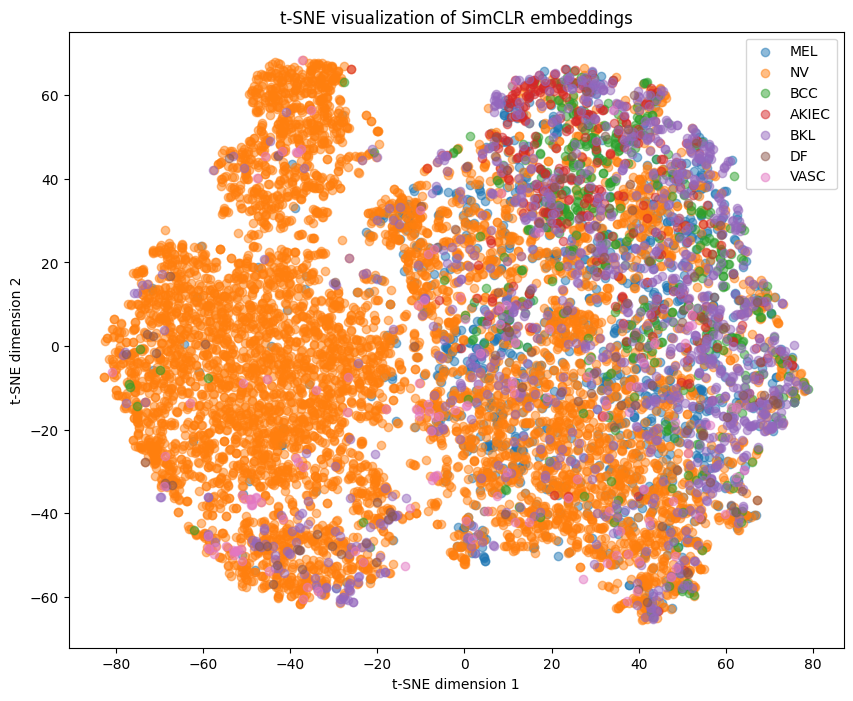

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Using t-SNE for visualization
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features_train)

# Plotting the t-SNE representation
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(labels_train == i)
    plt.scatter(features_2d[indices, 0], features_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE visualization of SimCLR embeddings")
plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.show()


In [ ]:
# import tensorflow as tf
# import numpy as np
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import classification_report, accuracy_score

# # Load the saved SimCLR model
# saved_model_path = 'simclr_model100.keras'
# model_simclr = tf.keras.models.load_model(saved_model_path)

# # Print all layer names to find the correct one for feature extraction
# for layer in model_simclr.layers:
#     print(layer.name)

# # Use the correct layer name for the feature extractor
# # Replace 'global_average_pooling2d_1' with the actual name you identified
# feature_extractor = tf.keras.Model(
#     inputs=model_simclr.input,
#     outputs=model_simclr.get_layer("global_average_pooling2d_1").output  # Replace with the correct layer name
# )

# # Define a function to extract features from the dataset
# def extract_features(dataset, feature_extractor):
#     features = []
#     labels = []
#     for (view1, view2), label in dataset:
#         feature = feature_extractor(view1)  # Extract features from view1
#         features.append(feature.numpy())
#         labels.append(label.numpy())
#     return np.concatenate(features), np.concatenate(labels)

# # Load and preprocess the test dataset
# test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
# test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'
# ssl_test_data = create_dataset(test_csv_path, test_image_dir)

# # Extract features using the feature extractor
# features_test, labels_test = extract_features(ssl_test_data, feature_extractor)

# # Convert one-hot encoded labels to a single-dimensional array of class labels
# labels_test = labels_test.argmax(axis=1)

# # Predict on the test features
# test_preds = clf.predict(features_test)

# # Calculate and print test accuracy
# test_accuracy = accuracy_score(labels_test, test_preds)
# print("Test Accuracy:", test_accuracy)

# # Print the classification report
# print(classification_report(labels_test, test_preds, target_names=['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']))


input_layer_1
conv1_pad
conv1_conv
conv1_bn
conv1_relu
pool1_pad
pool1_pool
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_0_bn
conv2_block1_3_bn
conv2_block1_add
conv2_block1_out
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_3_bn
conv2_block2_add
conv2_block2_out
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
conv2_block3_3_conv
conv2_block3_3_bn
conv2_block3_add
conv2_block3_out
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_0_bn
conv3_block1_3_bn
conv3_block1_add
conv3_block1_out
conv3_block2_1_conv
conv3_block2_1_bn
conv3_block2_1_relu
conv3_block2_2_conv
conv3_block2_2_bn


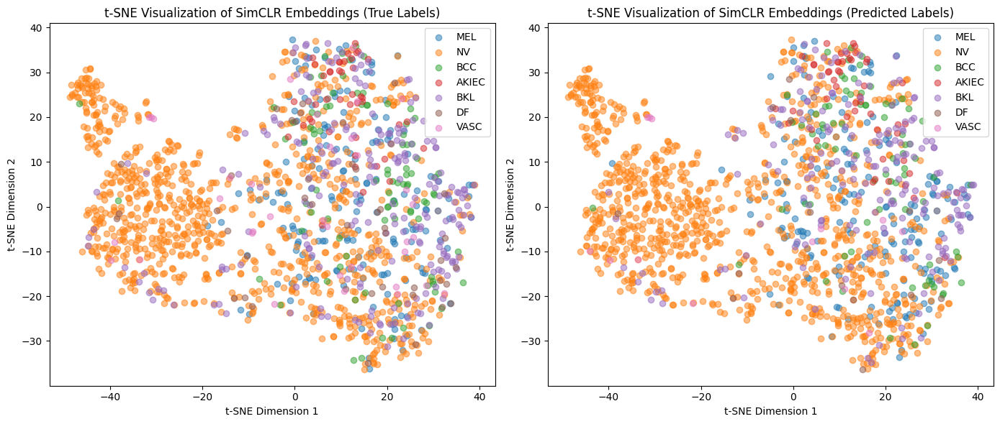

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

# 1. t-SNE Visualization of the True Labels
# Using t-SNE for visualization of true labels
tsne = TSNE(n_components=2, random_state=42)
features_test_2d = tsne.fit_transform(features_test)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(labels_test == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings (True Labels)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

# 2. t-SNE Visualization of the Predicted Labels
plt.subplot(1, 2, 2)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(test_preds == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings (Predicted Labels)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler

# Load the pre-trained SimCLR model
saved_model_path = '/content/drive/MyDrive/SimCLR_Models/simclr_model100.keras'
model_simclr = tf.keras.models.load_model(saved_model_path)

# Extract the base encoder (up to the 'global_average_pooling2d_1' layer)
feature_extractor = tf.keras.Model(
    inputs=model_simclr.input,
    outputs=model_simclr.get_layer("global_average_pooling2d_1").output
)

# Function to extract features from the dataset
def extract_features(dataset, feature_extractor):
    features = []
    labels = []
    for images, label in dataset:
        # Extract features from the images
        feature = feature_extractor(images)
        features.append(feature.numpy())
        labels.append(label.numpy())

    return np.concatenate(features), np.concatenate(labels)

# Extract features from training and test datasets
features_train, labels_train = extract_features(ssl_train_data, feature_extractor)
features_test, labels_test = extract_features(test_data, feature_extractor)

# Check shapes of features and labels
print(f"Training Features shape: {features_train.shape}")
print(f"Training Labels shape: {labels_train.shape}")
print(f"Test Features shape: {features_test.shape}")
print(f"Test Labels shape: {labels_test.shape}")

# Convert one-hot encoded labels to class indices
labels_train = labels_train.argmax(axis=1)
labels_test = labels_test.argmax(axis=1)

# Standardize the features for better performance
scaler = StandardScaler()
features_train = scaler.fit_transform(features_train)
features_test = scaler.transform(features_test)

# Train a logistic regression classifier on the extracted features
clf = LogisticRegression(max_iter=2000)
clf.fit(features_train, labels_train)

# Evaluate on training data
train_preds = clf.predict(features_train)
print("Training Accuracy:", accuracy_score(labels_train, train_preds))
print("Classification Report (Training Data):")
print(classification_report(labels_train, train_preds))

# Evaluate on test data (downstream task)
test_preds = clf.predict(features_test)
print("Test Accuracy:", accuracy_score(labels_test, test_preds))
print("Classification Report (Test Data):")
print(classification_report(labels_test, test_preds))


Training Features shape: (10015, 2048)
Training Labels shape: (10015, 7)
Test Features shape: (1512, 2048)
Test Labels shape: (1512, 7)
Training Accuracy: 0.9602596105841238
Classification Report (Training Data):
              precision    recall  f1-score   support

           0       0.94      0.85      0.89      1113
           1       0.96      0.99      0.97      6705
           2       0.99      0.99      0.99       514
           3       1.00      1.00      1.00       327
           4       0.95      0.87      0.91      1099
           5       1.00      1.00      1.00       115
           6       1.00      0.99      1.00       142

    accuracy                           0.96     10015
   macro avg       0.98      0.95      0.97     10015
weighted avg       0.96      0.96      0.96     10015

Test Accuracy: 0.6534391534391535
Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.35      0.39      0.37       171
           1

Visualizing t-SNE for Training Data...


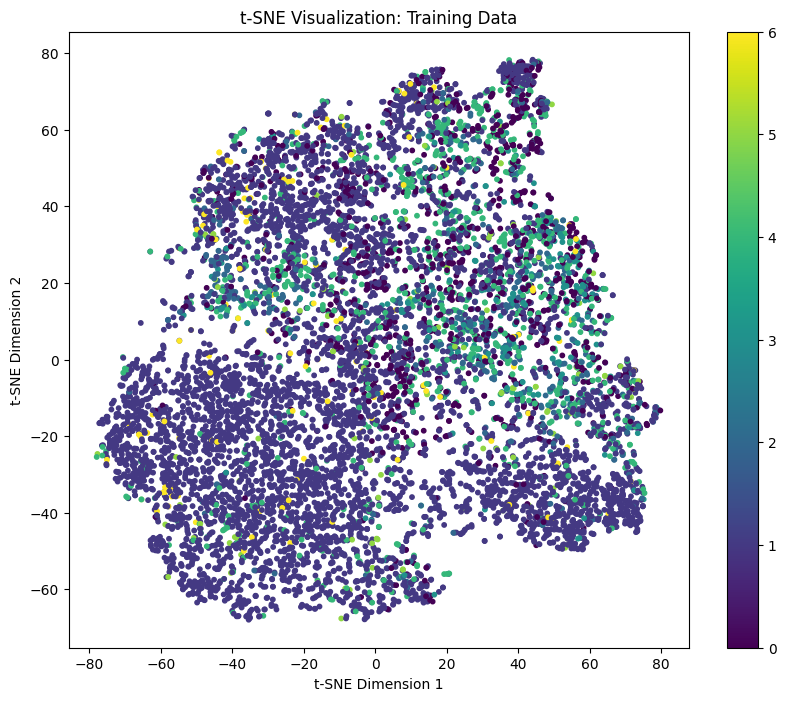

Visualizing t-SNE for Test Data...


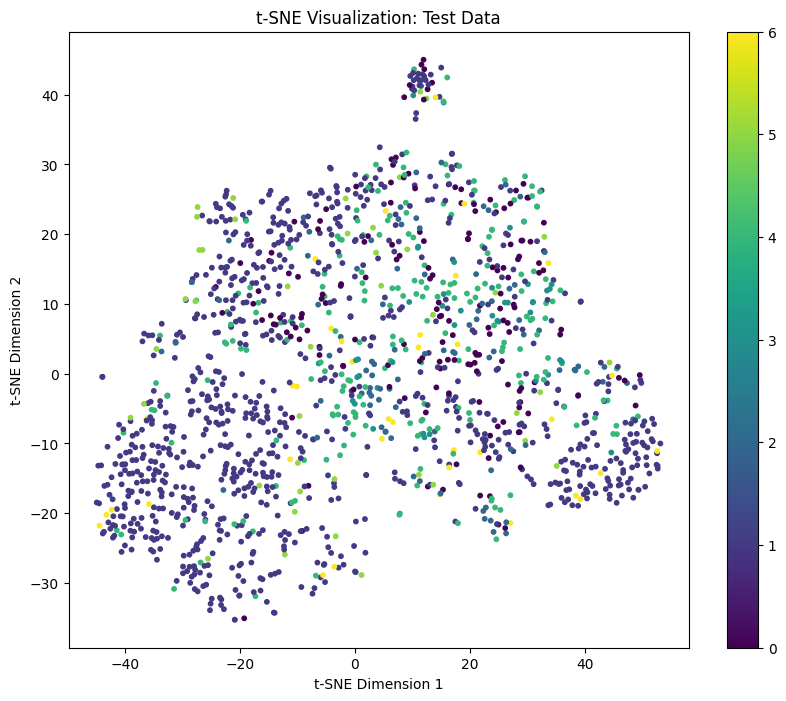

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Function to visualize features using t-SNE
def visualize_tsne(features, labels, title):
    # Initialize t-SNE with 2 components for 2D visualization
    tsne = TSNE(n_components=2, random_state=42)

    # Fit and transform the features
    tsne_results = tsne.fit_transform(features)

    # Plot the t-SNE results
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=labels, cmap='viridis', s=10)
    plt.colorbar(scatter)
    plt.title(f't-SNE Visualization: {title}')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.show()

# Visualize t-SNE for Training Data
print("Visualizing t-SNE for Training Data...")
visualize_tsne(features_train, labels_train, title="Training Data")

# Visualize t-SNE for Test Data
print("Visualizing t-SNE for Test Data...")
visualize_tsne(features_test, labels_test, title="Test Data")


Visualizing t-SNE for Training Data...


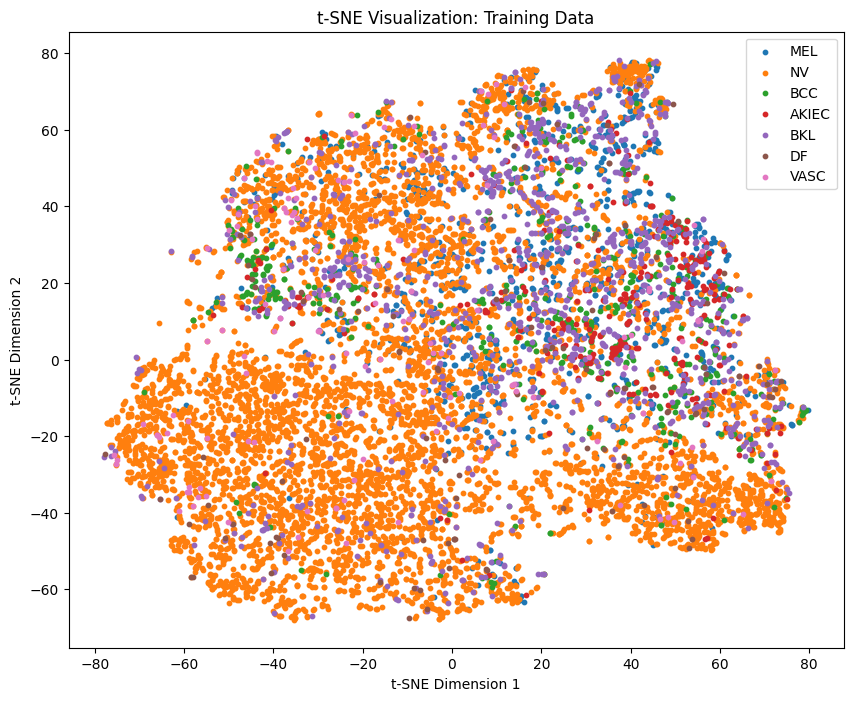

Visualizing t-SNE for Test Data...


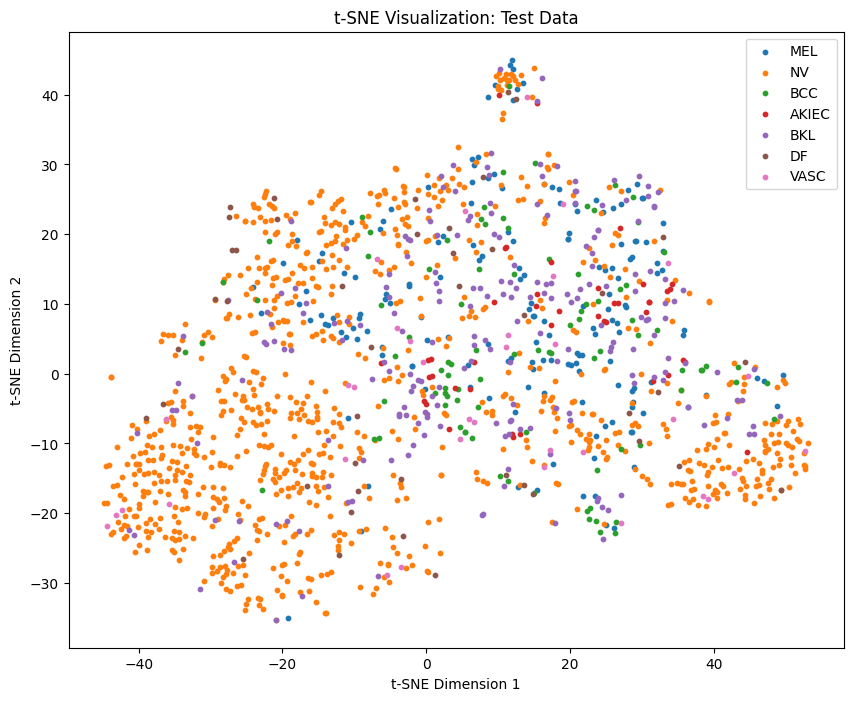

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

# Function to visualize features using t-SNE with different colors for each class
def visualize_tsne_colored(features, labels, class_names, title):
    # Initialize t-SNE with 2 components for 2D visualization
    tsne = TSNE(n_components=2, random_state=42)

    # Fit and transform the features
    tsne_results = tsne.fit_transform(features)

    # Create a scatter plot with different colors for each class
    plt.figure(figsize=(10, 8))

    # Get unique class labels
    unique_labels = np.unique(labels)

    # Plot each class with a different color
    for i, label in enumerate(unique_labels):
        # Select points that belong to the current class
        indices = np.where(labels == label)
        plt.scatter(tsne_results[indices, 0], tsne_results[indices, 1], label=class_names[label], s=10)

    plt.title(f't-SNE Visualization: {title}')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.legend(loc='best')
    plt.show()

# Class names (update with your actual class names)
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Visualize t-SNE for Training Data with colors for each class
print("Visualizing t-SNE for Training Data...")
visualize_tsne_colored(features_train, labels_train, class_names, title="Training Data")

# Visualize t-SNE for Test Data with colors for each class
print("Visualizing t-SNE for Test Data...")
visualize_tsne_colored(features_test, labels_test, class_names, title="Test Data")


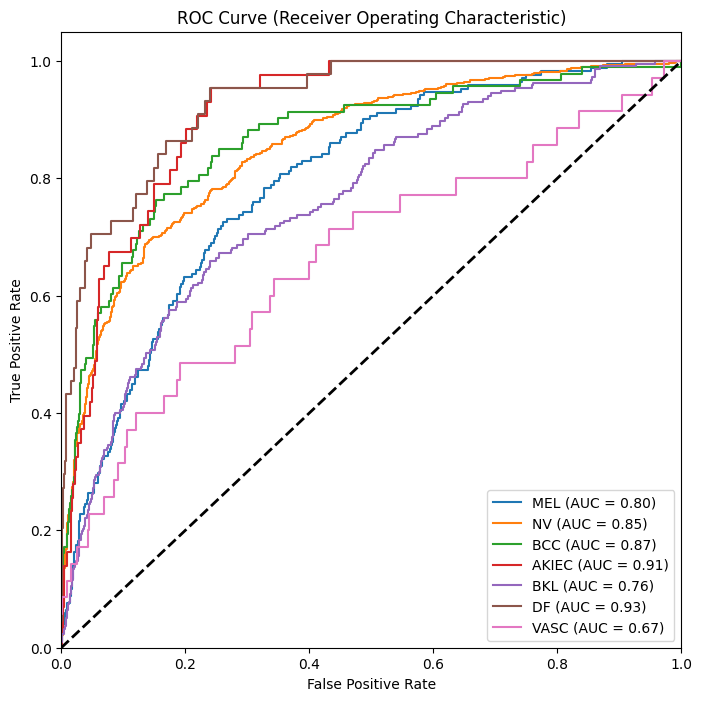

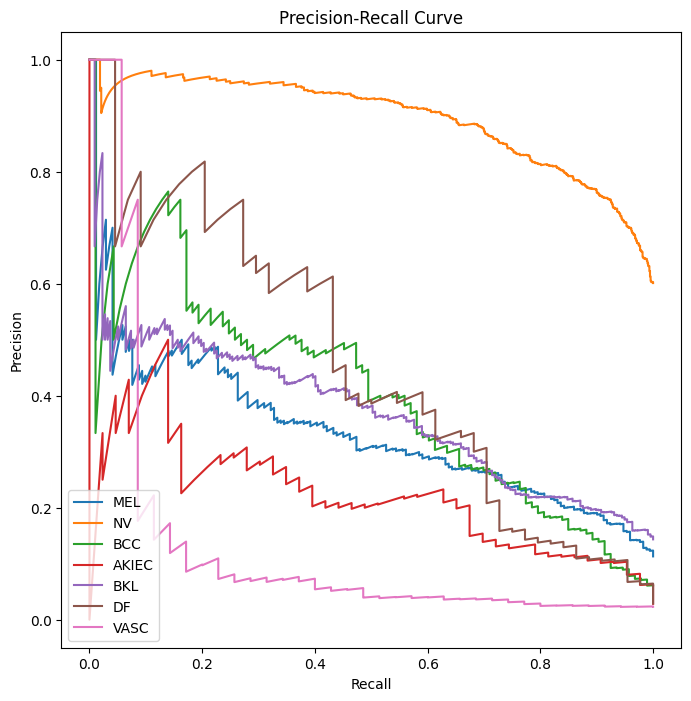

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve
import numpy as np

# Function to plot ROC curve for each class
def plot_roc_curve(y_true, y_score, class_names):
    plt.figure(figsize=(8, 8))

    # For each class, plot the ROC curve
    for i, class_name in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_name} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (Receiver Operating Characteristic)')
    plt.legend(loc='lower right')
    plt.show()

# Function to plot Precision-Recall curve for each class
def plot_precision_recall_curve(y_true, y_score, class_names):
    plt.figure(figsize=(8, 8))

    # For each class, plot the Precision-Recall curve
    for i, class_name in enumerate(class_names):
        precision, recall, _ = precision_recall_curve(y_true[:, i], y_score[:, i])
        plt.plot(recall, precision, label=f'{class_name}')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc='lower left')
    plt.show()

# Class names
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']

# Assume y_true is one-hot encoded and y_score contains predicted probabilities
# Convert y_true and y_pred to one-hot encoding if they are not already
# For binary classification for each class, one-hot encoding is required

# Convert labels to one-hot encoding
from sklearn.preprocessing import label_binarize
y_true_binary = label_binarize(labels_test, classes=np.arange(len(class_names)))

# Predicted probabilities should be obtained from your classifier for ROC and PR curves
# Assuming `clf.predict_proba()` is used for this purpose
y_score = clf.predict_proba(features_test)

# Plot ROC curve
plot_roc_curve(y_true_binary, y_score, class_names)

# Plot Precision-Recall curve
plot_precision_recall_curve(y_true_binary, y_score, class_names)


Fine tune on SIMCLR100 model using 10% of labells

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import shutil
import os

# Define paths
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
val_image_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# Define the directory to store the sampled data
sampled_data_dir = '/content/sampled_data/'
sampled_train_dir = os.path.join(sampled_data_dir, 'train')
sampled_val_dir = os.path.join(sampled_data_dir, 'val')
sampled_test_dir = os.path.join(sampled_data_dir, 'test')

# Create directories if they don't exist
for directory in [sampled_train_dir, sampled_val_dir, sampled_test_dir]:
    if not os.path.exists(directory):
        os.makedirs(directory)

# Function to sample data using stratified sampling
def sample_data(csv_path, image_dir, sample_size, output_dir, stratified=True):
    # Read the CSV
    df = pd.read_csv(csv_path)

    # Check class distribution
    class_counts = df.drop(columns=['image']).sum()
    print(f"Class distribution in {csv_path}:")
    print(class_counts)

    # Perform stratified or random sampling
    if stratified:
        # Check if stratified sampling is possible
        min_class_count = class_counts.min()
        if min_class_count < 2:
            print("Not enough samples for stratified sampling. Using random sampling instead.")
            stratified = False

    if stratified:
        # Stratified sampling
        sample_df, _ = train_test_split(df, train_size=sample_size, stratify=df.drop(columns=['image']).values, random_state=42)
    else:
        # Random sampling
        sample_df = df.sample(frac=sample_size, random_state=42)

    # Copy the sampled images to the output directory
    for index, row in sample_df.iterrows():
        image_path = os.path.join(image_dir, row['image'])
        dest_path = os.path.join(output_dir, row['image'])
        if os.path.exists(image_path):
            shutil.copy(image_path, dest_path)

    # Save the sampled CSV file
    sample_csv_path = os.path.join(output_dir, 'sampled_groundtruth.csv')
    sample_df.to_csv(sample_csv_path, index=False)
    print(f"Sampled data saved to {sample_csv_path}")

# Sample 10% of the data for fine-tuning (adjust the sample_size parameter as needed)
sample_size = 0.1

# Sample training data using stratified sampling
print("Sampling training data...")
sample_data(train_csv_path, train_image_dir, sample_size, sampled_train_dir, stratified=True)

# Sample validation and test data using random sampling if stratified is not possible
print("\nSampling validation data...")
sample_data(val_csv_path, val_image_dir, sample_size, sampled_val_dir, stratified=True)

print("\nSampling test data...")
sample_data(test_csv_path, test_image_dir, sample_size, sampled_test_dir, stratified=True)


Sampling training data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv:
MEL      1113.0
NV       6705.0
BCC       514.0
AKIEC     327.0
BKL      1099.0
DF        115.0
VASC      142.0
dtype: float64
Sampled data saved to /content/sampled_data/train/sampled_groundtruth.csv

Sampling validation data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv:
MEL       21.0
NV       123.0
BCC       15.0
AKIEC      8.0
BKL       22.0
DF         1.0
VASC       3.0
dtype: float64
Not enough samples for stratified sampling. Using random sampling instead.
Sampled data saved to /content/sampled_data/val/sampled_groundtruth.csv

Sampling test data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv:
MEL      171.0
NV       909.0
BCC       93.0
AKIEC     43.0
BKL      217.0
DF        44.0
VASC      35.0
dt

In [ ]:
import os

# Define the directory path where the model is saved
directory_path = '/content/drive/MyDrive/SimCLR_Models/'

# List all files in the specified directory
files = os.listdir(directory_path)

# Print the list of files
print(f"Files in {directory_path}:")
for file in files:
    print(file)


Files in /content/drive/MyDrive/SimCLR_Models/:
simclr_model.keras
simclr_model100.keras


In [ ]:
# Adjust the model path as needed
saved_model_path = '/content/drive/MyDrive/SimCLR_Models/simclr_model100.keras'
# Load the model
model = tf.keras.models.load_model(saved_model_path)

# Print all layer names
for i, layer in enumerate(model.layers):
    print(f"Layer {i}: {layer.name}")


Layer 0: input_layer_1
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import pandas as pd
import os
import numpy as np
import random

# Set random seeds for reproducibility
np.random.seed(50)
tf.random.set_seed(50)
random.seed(50)

# Adjust the model path as needed
saved_model_path = '/content/drive/MyDrive/SimCLR_Models/simclr_model100.keras'

# Load the base model and remove the projection head
base_model = tf.keras.models.load_model(saved_model_path)
base_model = tf.keras.Model(inputs=base_model.input, outputs=base_model.get_layer("global_average_pooling2d_1").output)

# Adding a new classification head
x = layers.Dense(256, activation='relu')(base_model.output)
x = layers.Dropout(0.5)(x)
output = layers.Dense(7, activation='softmax')(x)  # 7 classes for the skin cancer dataset

# Fine-tuning model
model_finetune = Model(inputs=base_model.input, outputs=output)

# Compile the model with a lower learning rate for fine-tuning
model_finetune.compile(optimizer=Adam(learning_rate=1e-5),
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

# Callbacks for saving the best model and reducing learning rate
callbacks = [
    ModelCheckpoint(filepath='finetuned_simclr_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

# Function to create a labeled dataset for fine-tuning
def create_labeled_dataset(csv_path, image_dir, batch_size=32):
    df = pd.read_csv(csv_path)
    image_paths = [os.path.join(image_dir, fname) for fname in df['image']]
    labels = df.drop(columns=['image']).values

    def parse_function(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        image = tf.image.per_image_standardization(image)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(df))  # Add shuffle for reproducibility
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Create labeled datasets for fine-tuning
sampled_train_dir = '/content/sampled_data/train'
sampled_val_dir = '/content/sampled_data/val'
sampled_test_dir = '/content/sampled_data/test'

train_dataset = create_labeled_dataset(os.path.join(sampled_train_dir, 'sampled_groundtruth.csv'), sampled_train_dir)
val_dataset = create_labeled_dataset(os.path.join(sampled_val_dir, 'sampled_groundtruth.csv'), sampled_val_dir)
test_dataset = create_labeled_dataset(os.path.join(sampled_test_dir, 'sampled_groundtruth.csv'), sampled_test_dir)

# Fine-tune the model
history = model_finetune.fit(train_dataset,
                             validation_data=val_dataset,
                             epochs=50,
                             callbacks=callbacks)

# Evaluate on the test dataset
test_loss, test_accuracy = model_finetune.evaluate(test_dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 68s 675ms/step - accuracy: 0.2668 - loss: 2.8001 - val_accuracy: 0.7895 - val_loss: 0.7010 - learning_rate: 1.0000e-05
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6141 - loss: 1.4564 - val_accuracy: 0.8421 - val_loss: 0.4953 - learning_rate: 1.0000e-05
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6435 - loss: 1.2502 - val_accuracy: 0.8421 - val_loss: 0.5598 - learning_rate: 1.0000e-05
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.6325 - loss: 1.1587 - val_accuracy: 0.8421 - val_loss: 0.5617 - learning_rate: 1.0000e-05
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6693 - loss: 1.0833 - val_accuracy: 0.8421 - val_loss: 0.5848 - learning_rate: 1.0000e-05
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.6858 - loss: 0.8986 - val_accuracy: 0.8947 - val_loss: 0.5454 - learning_rate: 1.0000e-05
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7055 - loss: 0

test for different seeds, which are proved to be less acurate

In [ ]:
# import tensorflow as tf
# from tensorflow.keras import layers, Model
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
# import pandas as pd
# import os
# import numpy as np
# import random
# import json

# # Set random seeds for reproducibility
# np.random.seed(60)
# tf.random.set_seed(60)
# random.seed(60)

# # Function to create a labeled dataset for fine-tuning
# def create_labeled_dataset(csv_path, image_dir, batch_size=32):
#     df = pd.read_csv(csv_path)
#     image_paths = [os.path.join(image_dir, fname) for fname in df['image']]
#     labels = df.drop(columns=['image']).values

#     def parse_function(image_path, label):
#         image = tf.io.read_file(image_path)
#         image = tf.image.decode_jpeg(image, channels=3)
#         image = tf.image.resize(image, [224, 224])
#         image = tf.image.per_image_standardization(image)
#         return image, label

#     dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
#     dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
#     dataset = dataset.shuffle(buffer_size=len(df))  # Add shuffle for reproducibility
#     dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
#     return dataset

# # Define the function for training and evaluation
# def train_and_evaluate(seed, num_epochs=10):
#     # Set random seeds for reproducibility
#     np.random.seed(seed)
#     tf.random.set_seed(seed)
#     random.seed(seed)

#     # Load the base model and remove the projection head
#     base_model = tf.keras.models.load_model(saved_model_path)
#     base_model = tf.keras.Model(inputs=base_model.input, outputs=base_model.get_layer("global_average_pooling2d_1").output)

#     # Adding a new classification head
#     x = layers.Dense(256, activation='relu')(base_model.output)
#     x = layers.Dropout(0.5)(x)
#     output = layers.Dense(7, activation='softmax')(x)  # 7 classes for the skin cancer dataset

#     # Fine-tuning model
#     model_finetune = Model(inputs=base_model.input, outputs=output)

#     # Compile the model with a lower learning rate for fine-tuning
#     model_finetune.compile(optimizer=Adam(learning_rate=1e-5),
#                            loss='categorical_crossentropy',
#                            metrics=['accuracy'])

#     # Callbacks for saving the best model and reducing learning rate
#     callbacks = [
#         ModelCheckpoint(filepath=f'finetuned_simclr_model_seed_{seed}.keras', save_best_only=True, monitor='val_loss', mode='min'),
#         ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7),
#         EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#     ]

#     # Create labeled datasets for fine-tuning
#     train_dataset = create_labeled_dataset(os.path.join(sampled_train_dir, 'sampled_groundtruth.csv'), sampled_train_dir)
#     val_dataset = create_labeled_dataset(os.path.join(sampled_val_dir, 'sampled_groundtruth.csv'), sampled_val_dir)
#     test_dataset = create_labeled_dataset(os.path.join(sampled_test_dir, 'sampled_groundtruth.csv'), sampled_test_dir)

#     # Fine-tune the model
#     history = model_finetune.fit(train_dataset,
#                                  validation_data=val_dataset,
#                                  epochs=num_epochs,  # Run for fewer epochs initially
#                                  callbacks=callbacks)

#     # Evaluate on the test dataset
#     test_loss, test_accuracy = model_finetune.evaluate(test_dataset)
#     print(f'Seed: {seed}, Test Accuracy: {test_accuracy:.4f}')
#     return test_accuracy

# # List of seeds to try (using fewer seeds initially for faster exploration)
# seed_list = [42, 65, 100, 123, 200, 300, 400, 500, 600, 700]

# # Dictionary to store the results
# seed_results = {}

# # Path to saved model
# saved_model_path = '/content/drive/MyDrive/SimCLR_Models/simclr_model100.keras'

# # Directories for sampled data
# sampled_train_dir = '/content/sampled_data/train'
# sampled_val_dir = '/content/sampled_data/val'
# sampled_test_dir = '/content/sampled_data/test'

# # Loop over each seed and evaluate
# for seed in seed_list:
#     test_accuracy = train_and_evaluate(seed, num_epochs=20)  # Adjust number of epochs here
#     seed_results[seed] = test_accuracy

#     # Save intermediate results to a JSON file
#     with open('seed_results.json', 'w') as f:
#         json.dump(seed_results, f)

# # Print all results
# print("Results for each seed:")
# for seed, accuracy in seed_results.items():
#     print(f"Seed: {seed}, Test Accuracy: {accuracy:.4f}")

# # Identify the best seed
# best_seed = max(seed_results, key=seed_results.get)
# print(f"Best Seed: {best_seed} with Test Accuracy: {seed_results[best_seed]:.4f}")


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 68s 673ms/step - accuracy: 0.2034 - loss: 2.8692 - val_accuracy: 0.8421 - val_loss: 0.5730 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.5982 - loss: 1.4121 - val_accuracy: 0.7895 - val_loss: 0.5235 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6490 - loss: 1.1463 - val_accuracy: 0.7895 - val_loss: 0.5192 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - accuracy: 0.6513 - loss: 1.0492 - val_accuracy: 0.8947 - val_loss: 0.4955 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - accuracy: 0.6734 - loss: 1.0233 - val_accuracy: 0.8947 - val_loss: 0.4884 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.6747 - loss: 0.9114 - val_accuracy: 0.8947 - val_loss: 0.5005 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.7

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 67s 674ms/step - accuracy: 0.2399 - loss: 2.9161 - val_accuracy: 0.7895 - val_loss: 0.7789 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.5897 - loss: 1.5288 - val_accuracy: 0.7895 - val_loss: 0.6600 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6392 - loss: 1.2926 - val_accuracy: 0.8421 - val_loss: 0.4446 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6622 - loss: 1.1033 - val_accuracy: 0.8421 - val_loss: 0.4121 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6903 - loss: 1.0260 - val_accuracy: 0.8947 - val_loss: 0.4118 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.7335 - loss: 0.8597 - val_accuracy: 0.9474 - val_loss: 0.3997 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6966 - loss

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 67s 674ms/step - accuracy: 0.1601 - loss: 3.2882 - val_accuracy: 0.7895 - val_loss: 0.7573 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.5871 - loss: 1.4905 - val_accuracy: 0.8421 - val_loss: 0.6741 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - accuracy: 0.6171 - loss: 1.1981 - val_accuracy: 0.8421 - val_loss: 0.5372 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.6659 - loss: 1.0375 - val_accuracy: 0.9474 - val_loss: 0.4864 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.6794 - loss: 1.0046 - val_accuracy: 0.8947 - val_loss: 0.4681 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7073 - loss: 0.9013 - val_accuracy: 0.8421 - val_loss: 0.5019 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7090 - los

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 74s 674ms/step - accuracy: 0.4008 - loss: 2.2289 - val_accuracy: 0.7895 - val_loss: 0.7303 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6394 - loss: 1.3034 - val_accuracy: 0.8421 - val_loss: 0.6559 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6176 - loss: 1.2246 - val_accuracy: 0.7895 - val_loss: 0.5450 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6926 - loss: 0.9249 - val_accuracy: 0.7895 - val_loss: 0.5139 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6812 - loss: 0.9522 - val_accuracy: 0.8421 - val_loss: 0.5050 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6950 - loss: 0.8532 - val_accuracy: 0.8421 - val_loss: 0.5067 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.7276 - loss:

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 67s 665ms/step - accuracy: 0.3083 - loss: 2.4469 - val_accuracy: 0.7368 - val_loss: 0.9287 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6289 - loss: 1.4014 - val_accuracy: 0.7895 - val_loss: 0.6853 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6418 - loss: 1.2595 - val_accuracy: 0.8947 - val_loss: 0.5799 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.6549 - loss: 1.1205 - val_accuracy: 0.8421 - val_loss: 0.5682 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6804 - loss: 0.9673 - val_accuracy: 0.8947 - val_loss: 0.5216 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6907 - loss: 0.8930 - val_accuracy: 0.8421 - val_loss: 0.5300 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - accuracy: 0.6924 - loss

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 68s 682ms/step - accuracy: 0.1879 - loss: 3.2079 - val_accuracy: 0.8421 - val_loss: 0.6399 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6118 - loss: 1.5053 - val_accuracy: 0.8421 - val_loss: 0.5127 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6335 - loss: 1.2719 - val_accuracy: 0.8421 - val_loss: 0.5051 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - accuracy: 0.6577 - loss: 1.1402 - val_accuracy: 0.8947 - val_loss: 0.4838 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6695 - loss: 0.9422 - val_accuracy: 0.8947 - val_loss: 0.4648 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7178 - loss: 0.9184 - val_accuracy: 0.8947 - val_loss: 0.4880 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7121 - loss:

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 67s 671ms/step - accuracy: 0.2362 - loss: 2.8143 - val_accuracy: 0.8421 - val_loss: 0.8618 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - accuracy: 0.5910 - loss: 1.5319 - val_accuracy: 0.7895 - val_loss: 0.6303 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.6336 - loss: 1.2022 - val_accuracy: 0.8421 - val_loss: 0.5497 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6633 - loss: 1.0559 - val_accuracy: 0.7895 - val_loss: 0.5301 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6827 - loss: 0.9537 - val_accuracy: 0.7895 - val_loss: 0.5423 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - accuracy: 0.6924 - loss: 0.9656 - val_accuracy: 0.8421 - val_loss: 0.4976 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7178 - loss:

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 76s 681ms/step - accuracy: 0.2064 - loss: 2.9485 - val_accuracy: 0.7895 - val_loss: 0.8318 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.5976 - loss: 1.5567 - val_accuracy: 0.7895 - val_loss: 0.6829 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - accuracy: 0.6399 - loss: 1.2385 - val_accuracy: 0.8421 - val_loss: 0.5422 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6640 - loss: 1.0348 - val_accuracy: 0.8421 - val_loss: 0.5583 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.6614 - loss: 1.0847 - val_accuracy: 0.8947 - val_loss: 0.4887 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - accuracy: 0.6846 - loss: 0.9168 - val_accuracy: 0.8947 - val_loss: 0.4647 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.7186 - lo

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 68s 682ms/step - accuracy: 0.1978 - loss: 3.1309 - val_accuracy: 0.7895 - val_loss: 0.9039 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.5908 - loss: 1.5096 - val_accuracy: 0.8421 - val_loss: 0.7653 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - accuracy: 0.6173 - loss: 1.3114 - val_accuracy: 0.8421 - val_loss: 0.5819 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6384 - loss: 1.1729 - val_accuracy: 0.8947 - val_loss: 0.5316 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.6873 - loss: 1.0158 - val_accuracy: 0.8947 - val_loss: 0.4961 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6960 - loss: 0.8605 - val_accuracy: 0.8947 - val_loss: 0.5119 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.6928 - loss

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


32/32 ━━━━━━━━━━━━━━━━━━━━ 68s 673ms/step - accuracy: 0.2992 - loss: 2.5140 - val_accuracy: 0.7895 - val_loss: 0.7777 - learning_rate: 1.0000e-05
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.6378 - loss: 1.3517 - val_accuracy: 0.7895 - val_loss: 0.5916 - learning_rate: 1.0000e-05
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - accuracy: 0.6422 - loss: 1.2329 - val_accuracy: 0.7895 - val_loss: 0.5115 - learning_rate: 1.0000e-05
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - accuracy: 0.6546 - loss: 1.0477 - val_accuracy: 0.7895 - val_loss: 0.5105 - learning_rate: 1.0000e-05
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - accuracy: 0.7001 - loss: 0.9050 - val_accuracy: 0.8421 - val_loss: 0.4748 - learning_rate: 1.0000e-05
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.6814 - loss: 0.9025 - val_accuracy: 0.8947 - val_loss: 0.4589 - learning_rate: 1.0000e-05
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7150 - loss

Downstream task for fine tuned model

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model

# Function to extract features using the fine-tuned model
def extract_features(dataset, model):
    features = []
    labels = []
    for images, label in dataset:
        feature = model.predict(images)  # Extract features using the model
        features.append(feature)
        labels.append(label)
    features = np.vstack(features)  # Stack all the features
    labels = np.vstack(labels)  # Stack all the labels
    return features, labels

# Use the correct layer name ('dense_56') for feature extraction
# This layer represents the dense layer before the final classification head
feature_extractor_model = Model(inputs=model_finetune.input, outputs=model_finetune.get_layer('dense_56').output)

# Extract features from training, validation, and test datasets
train_features, train_labels = extract_features(train_dataset, feature_extractor_model)
val_features, val_labels = extract_features(val_dataset, feature_extractor_model)
test_features, test_labels = extract_features(test_dataset, feature_extractor_model)

# Reshape labels to be one-dimensional
train_labels = np.argmax(train_labels, axis=1)
val_labels = np.argmax(val_labels, axis=1)
test_labels = np.argmax(test_labels, axis=1)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Standardize the features
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
val_features = scaler.transform(val_features)
test_features = scaler.transform(test_features)

# Initialize and train the logistic regression classifier with balanced class weights
clf = LogisticRegression(max_iter=5000, class_weight='balanced')
clf.fit(train_features, train_labels)

# Validate on the validation set
val_predictions = clf.predict(val_features)
val_accuracy = accuracy_score(val_labels, val_predictions)
print(f"Validation Accuracy: {val_accuracy:.4f}")

# Test on the test set
test_predictions = clf.predict(test_features)
test_accuracy = accuracy_score(test_labels, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Print classification report for test set
report = classification_report(test_labels, test_predictions, target_names=['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'])
print(report)



Validation Accuracy: 0.6316
Test Accuracy: 0.6026
              precision    recall  f1-score   support

         MEL       0.43      0.53      0.47        17
          NV       0.86      0.75      0.80        91
         BCC       0.29      0.44      0.35         9
       AKIEC       0.25      0.25      0.25         4
         BKL       0.35      0.41      0.38        22
          DF       0.00      0.00      0.00         4
        VASC       0.00      0.00      0.00         4

    accuracy                           0.60       151
   macro avg       0.31      0.34      0.32       151
weighted avg       0.64      0.60      0.62       151



In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Initialize and train the SVM classifier
svm_clf = SVC(class_weight='balanced')
svm_clf.fit(train_features, train_labels)
svm_test_accuracy = svm_clf.score(test_features, test_labels)
print(f"SVM Test Accuracy: {svm_test_accuracy:.4f}")

# Initialize and train the Random Forest classifier
rf_clf = RandomForestClassifier(class_weight='balanced')
rf_clf.fit(train_features, train_labels)
rf_test_accuracy = rf_clf.score(test_features, test_labels)
print(f"Random Forest Test Accuracy: {rf_test_accuracy:.4f}")


SVM Test Accuracy: 0.5364
Random Forest Test Accuracy: 0.6159


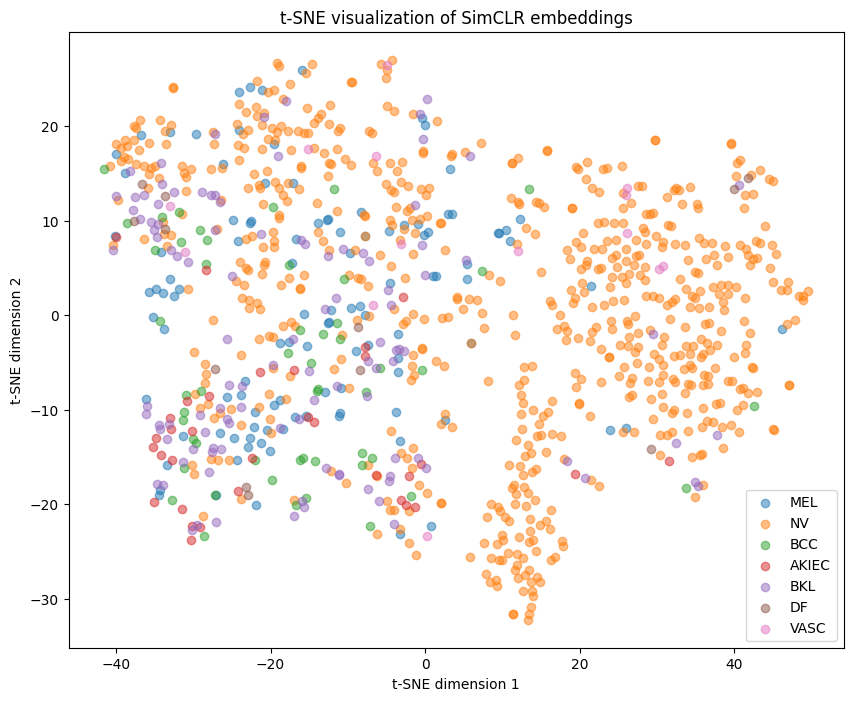

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Make sure the extracted features and labels are being used for t-SNE visualization
# Assume `train_features` and `train_labels` are extracted features and labels from the downstream task

# Using t-SNE for visualization on the extracted features
tsne = TSNE(n_components=2, random_state=42, perplexity=30)  # You can adjust perplexity if needed
features_2d = tsne.fit_transform(train_features)  # `train_features` from your downstream task

# Plotting the t-SNE representation
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(train_labels == i)  # Use `train_labels` from your downstream task
    plt.scatter(features_2d[indices, 0], features_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE visualization of SimCLR embeddings")
plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.show()


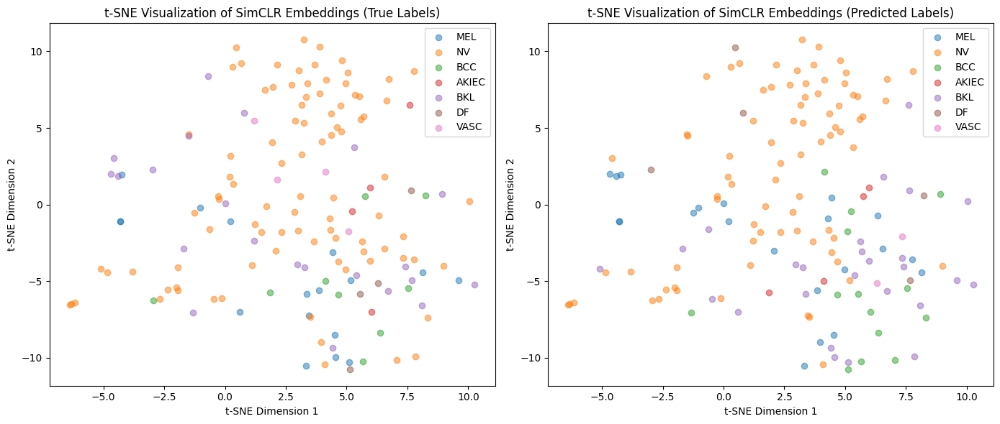

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

# Assuming test_features and test_labels are already defined

# Define test_preds using the classifier `clf` trained earlier
test_preds = clf.predict(test_features)  # Predict the labels using the trained classifier

# 1. t-SNE Visualization of the True Labels
# Using t-SNE for visualization of true labels
tsne = TSNE(n_components=2, random_state=42)
features_test_2d = tsne.fit_transform(test_features)

plt.figure(figsize=(14, 6))

# Visualization of True Labels
plt.subplot(1, 2, 1)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(test_labels == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings (True Labels)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

# 2. t-SNE Visualization of the Predicted Labels
plt.subplot(1, 2, 2)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(test_preds == i)  # Using test_preds to plot predicted labels
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings (Predicted Labels)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


cluster analysis with k-means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


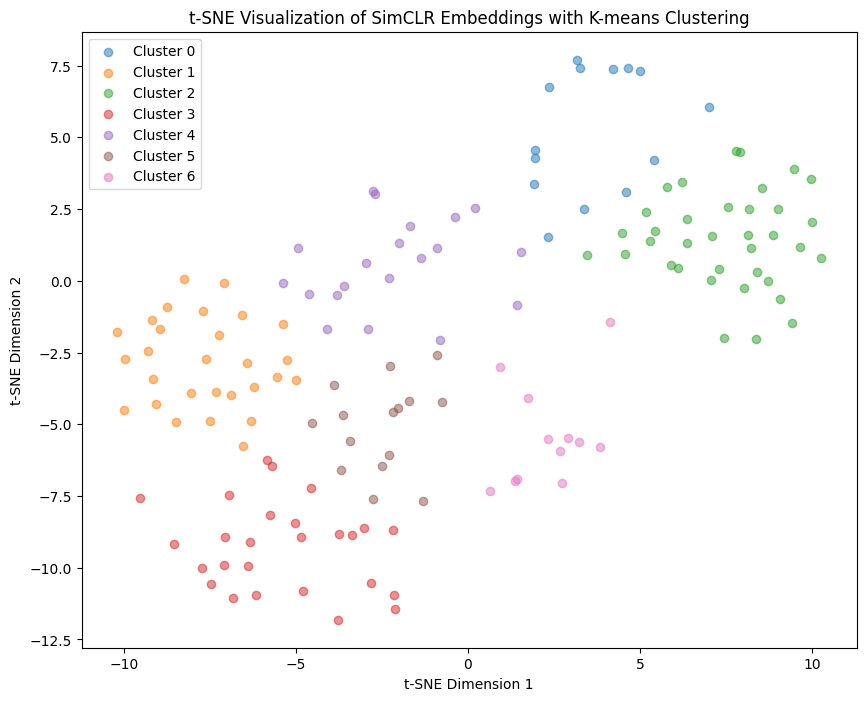

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Number of clusters is equal to the number of classes
num_clusters = 7

# Applying KMeans clustering to the t-SNE features
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(features_test_2d)

# Plotting the t-SNE representation with cluster labels
plt.figure(figsize=(10, 8))
for i in range(num_clusters):
    indices = np.where(clusters == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=f'Cluster {i}', alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings with K-means Clustering")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


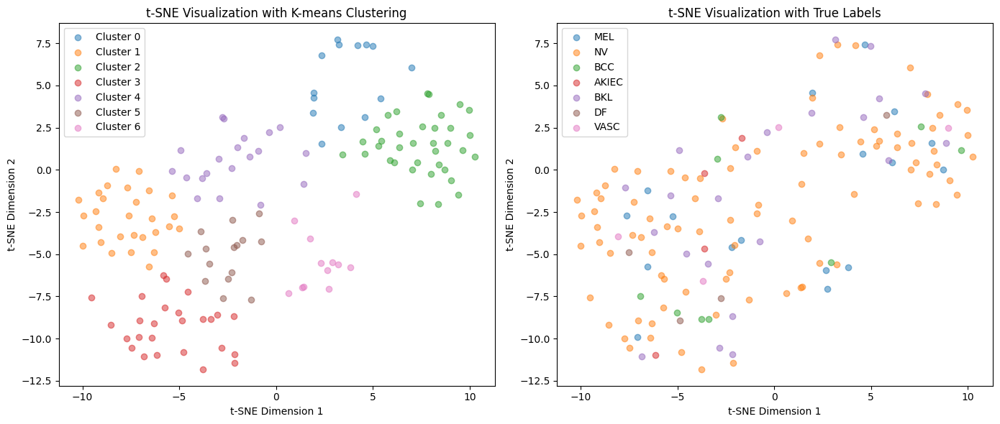

In [ ]:
# Plotting the t-SNE representation with true labels and cluster labels
plt.figure(figsize=(14, 6))

# Subplot for K-means clusters
plt.subplot(1, 2, 1)
for i in range(num_clusters):
    indices = np.where(clusters == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=f'Cluster {i}', alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization with K-means Clustering")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

# Subplot for true labels
plt.subplot(1, 2, 2)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(test_labels == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization with True Labels")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari_score = adjusted_rand_score(test_labels, clusters)
nmi_score = normalized_mutual_info_score(test_labels, clusters)

print(f"Adjusted Rand Index (ARI): {ari_score:.4f}")
print(f"Normalized Mutual Information (NMI): {nmi_score:.4f}")


Adjusted Rand Index (ARI): 0.0107
Normalized Mutual Information (NMI): 0.0909


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


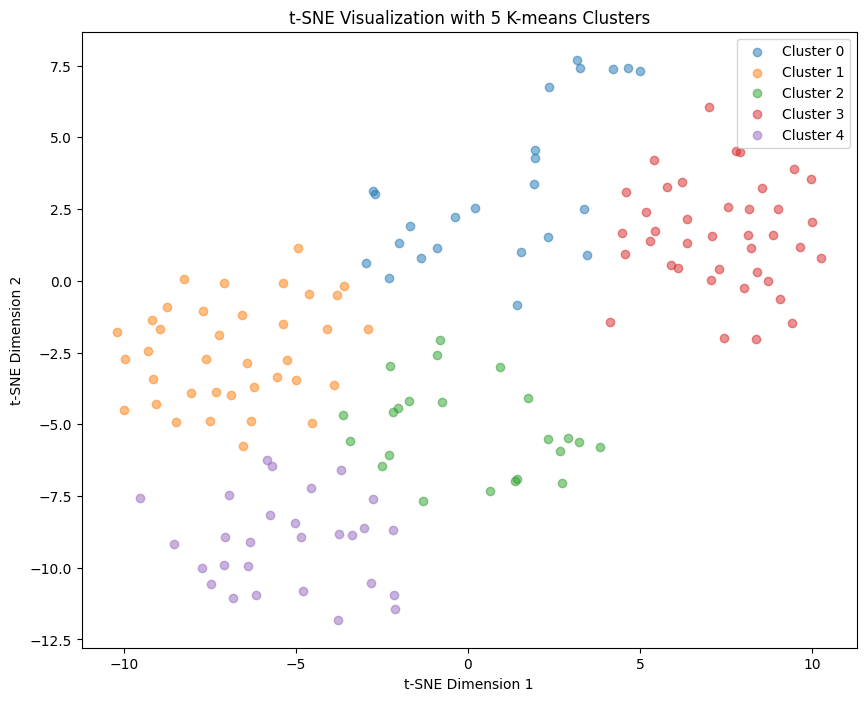

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


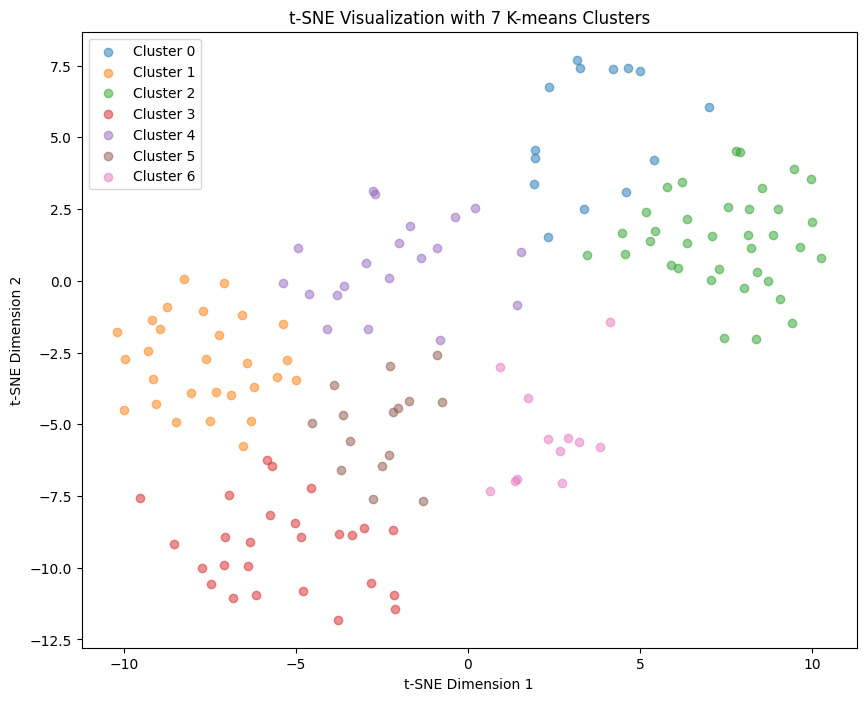

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


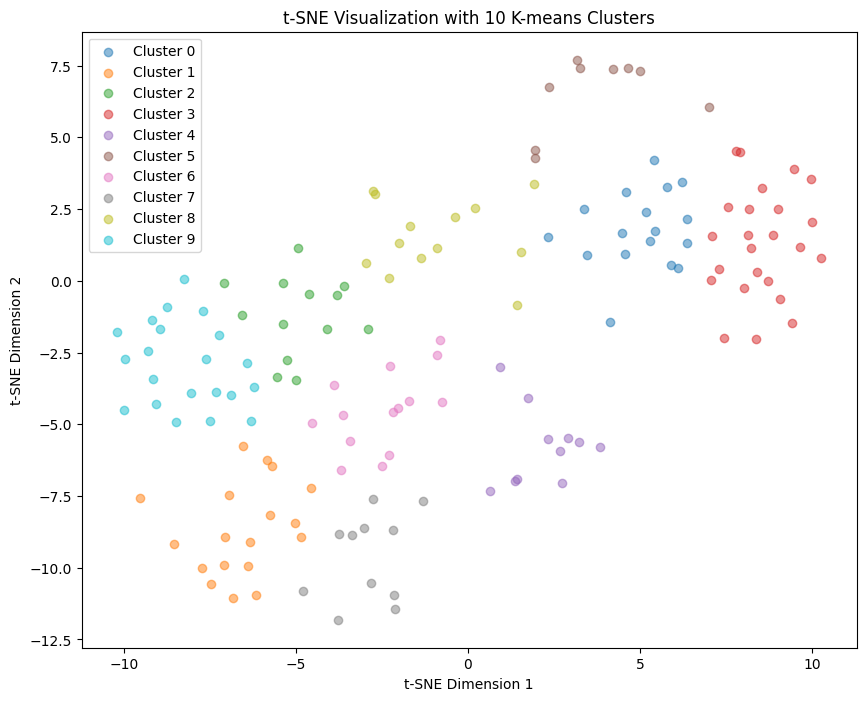

In [ ]:
# Try different cluster counts
for n_clusters in [5, 7, 10]:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(features_test_2d)

    plt.figure(figsize=(10, 8))
    for i in range(n_clusters):
        indices = np.where(clusters == i)
        plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=f'Cluster {i}', alpha=0.5)
    plt.legend()
    plt.title(f"t-SNE Visualization with {n_clusters} K-means Clusters")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.show()


In [ ]:
import plotly.express as px

# Creating an interactive plot using Plotly
df_tsne = pd.DataFrame(features_test_2d, columns=['t-SNE Dimension 1', 't-SNE Dimension 2'])
df_tsne['Cluster'] = clusters
df_tsne['True Label'] = test_labels

fig = px.scatter(df_tsne, x='t-SNE Dimension 1', y='t-SNE Dimension 2', color='Cluster',
                 hover_data=['True Label'], title="Interactive t-SNE Visualization with K-means Clustering")
fig.show()


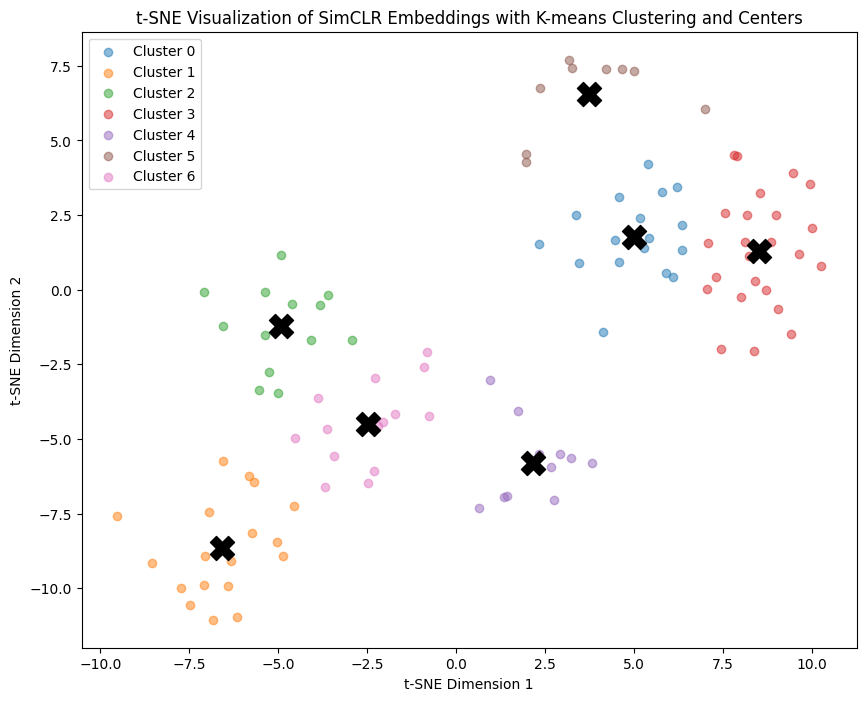

In [ ]:
# Plotting the t-SNE representation with cluster centers
plt.figure(figsize=(10, 8))
for i in range(num_clusters):
    indices = np.where(clusters == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=f'Cluster {i}', alpha=0.5)
    plt.scatter(kmeans.cluster_centers_[i, 0], kmeans.cluster_centers_[i, 1], s=300, c='black', marker='X')  # Cluster center

plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings with K-means Clustering and Centers")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


check for differnt sample data

check for 25% sampled label data

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import shutil
import os

# Define paths
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
val_image_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# Define the directory to store the sampled data
sampled_data_dir = '/content/sampled_data/'
sampled_train_dir = os.path.join(sampled_data_dir, 'train')
sampled_val_dir = os.path.join(sampled_data_dir, 'val')
sampled_test_dir = os.path.join(sampled_data_dir, 'test')

# Create directories if they don't exist
for directory in [sampled_train_dir, sampled_val_dir, sampled_test_dir]:
    if not os.path.exists(directory):
        os.makedirs(directory)

# Function to sample data using stratified sampling
def sample_data(csv_path, image_dir, sample_size, output_dir, stratified=True):
    # Read the CSV
    df = pd.read_csv(csv_path)

    # Check class distribution
    class_counts = df.drop(columns=['image']).sum()
    print(f"Class distribution in {csv_path}:")
    print(class_counts)

    # Perform stratified or random sampling
    if stratified:
        # Check if stratified sampling is possible
        min_class_count = class_counts.min()
        if min_class_count < 2:
            print("Not enough samples for stratified sampling. Using random sampling instead.")
            stratified = False

    if stratified:
        # Stratified sampling
        sample_df, _ = train_test_split(df, train_size=sample_size, stratify=df.drop(columns=['image']).values, random_state=42)
    else:
        # Random sampling
        sample_df = df.sample(frac=sample_size, random_state=42)

    # Copy the sampled images to the output directory
    for index, row in sample_df.iterrows():
        image_path = os.path.join(image_dir, row['image'])
        dest_path = os.path.join(output_dir, row['image'])
        if os.path.exists(image_path):
            shutil.copy(image_path, dest_path)

    # Save the sampled CSV file
    sample_csv_path = os.path.join(output_dir, 'sampled_groundtruth.csv')
    sample_df.to_csv(sample_csv_path, index=False)
    print(f"Sampled data saved to {sample_csv_path}")

# Sample 25% of the data for fine-tuning (adjust the sample_size parameter as needed)
sample_size = 0.25

# Sample training data using stratified sampling
print("Sampling training data...")
sample_data(train_csv_path, train_image_dir, sample_size, sampled_train_dir, stratified=True)

# Sample validation and test data using random sampling if stratified is not possible
print("\nSampling validation data...")
sample_data(val_csv_path, val_image_dir, sample_size, sampled_val_dir, stratified=True)

print("\nSampling test data...")
sample_data(test_csv_path, test_image_dir, sample_size, sampled_test_dir, stratified=True)


Sampling training data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv:
MEL      1113.0
NV       6705.0
BCC       514.0
AKIEC     327.0
BKL      1099.0
DF        115.0
VASC      142.0
dtype: float64
Sampled data saved to /content/sampled_data/train/sampled_groundtruth.csv

Sampling validation data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv:
MEL       21.0
NV       123.0
BCC       15.0
AKIEC      8.0
BKL       22.0
DF         1.0
VASC       3.0
dtype: float64
Not enough samples for stratified sampling. Using random sampling instead.
Sampled data saved to /content/sampled_data/val/sampled_groundtruth.csv

Sampling test data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv:
MEL      171.0
NV       909.0
BCC       93.0
AKIEC     43.0
BKL      217.0
DF        44.0
VASC      35.0
dt

In [ ]:
import os

# Define the directory path where the model is saved
directory_path = '/content/drive/MyDrive/SimCLR_Models/'

# List all files in the specified directory
files = os.listdir(directory_path)

# Print the list of files
print(f"Files in {directory_path}:")
for file in files:
    print(file)


Files in /content/drive/MyDrive/SimCLR_Models/:
simclr_model.keras
simclr_model100.keras


In [ ]:
# Adjust the model path as needed
saved_model_path = '/content/drive/MyDrive/SimCLR_Models/simclr_model100.keras'
# Load the model
model = tf.keras.models.load_model(saved_model_path)

# Print all layer names
for i, layer in enumerate(model.layers):
    print(f"Layer {i}: {layer.name}")


Layer 0: input_layer_1
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import pandas as pd
import os
import numpy as np
import random

# Set random seeds for reproducibility
np.random.seed(50)
tf.random.set_seed(50)
random.seed(50)

# Adjust the model path as needed
saved_model_path = '/content/drive/MyDrive/SimCLR_Models/simclr_model100.keras'

# Load the base model and remove the projection head
base_model = tf.keras.models.load_model(saved_model_path)
base_model = tf.keras.Model(inputs=base_model.input, outputs=base_model.get_layer("global_average_pooling2d_1").output)

# Adding a new classification head
x = layers.Dense(256, activation='relu')(base_model.output)
x = layers.Dropout(0.5)(x)
output = layers.Dense(7, activation='softmax')(x)  # 7 classes for the skin cancer dataset

# Fine-tuning model
model_finetune = Model(inputs=base_model.input, outputs=output)

# Compile the model with a lower learning rate for fine-tuning
model_finetune.compile(optimizer=Adam(learning_rate=1e-5),
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

# Callbacks for saving the best model and reducing learning rate
callbacks = [
    ModelCheckpoint(filepath='finetuned_simclr_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

# Function to create a labeled dataset for fine-tuning
def create_labeled_dataset(csv_path, image_dir, batch_size=32):
    df = pd.read_csv(csv_path)
    image_paths = [os.path.join(image_dir, fname) for fname in df['image']]
    labels = df.drop(columns=['image']).values

    def parse_function(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        image = tf.image.per_image_standardization(image)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(df))  # Add shuffle for reproducibility
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Create labeled datasets for fine-tuning
sampled_train_dir = '/content/sampled_data/train'
sampled_val_dir = '/content/sampled_data/val'
sampled_test_dir = '/content/sampled_data/test'

train_dataset = create_labeled_dataset(os.path.join(sampled_train_dir, 'sampled_groundtruth.csv'), sampled_train_dir)
val_dataset = create_labeled_dataset(os.path.join(sampled_val_dir, 'sampled_groundtruth.csv'), sampled_val_dir)
test_dataset = create_labeled_dataset(os.path.join(sampled_test_dir, 'sampled_groundtruth.csv'), sampled_test_dir)

# Fine-tune the model
history = model_finetune.fit(train_dataset,
                             validation_data=val_dataset,
                             epochs=50,
                             callbacks=callbacks)

# Evaluate on the test dataset
test_loss, test_accuracy = model_finetune.evaluate(test_dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')


Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 120s 575ms/step - accuracy: 0.3808 - loss: 2.3595 - val_accuracy: 0.7083 - val_loss: 1.0090 - learning_rate: 1.0000e-05
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 137ms/step - accuracy: 0.6386 - loss: 1.1687 - val_accuracy: 0.7292 - val_loss: 0.9096 - learning_rate: 1.0000e-05
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 137ms/step - accuracy: 0.6670 - loss: 0.9577 - val_accuracy: 0.7292 - val_loss: 0.8742 - learning_rate: 1.0000e-05
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - accuracy: 0.6923 - loss: 0.8964 - val_accuracy: 0.7500 - val_loss: 0.7702 - learning_rate: 1.0000e-05
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - accuracy: 0.7058 - loss: 0.8223 - val_accuracy: 0.7500 - val_loss: 0.7444 - learning_rate: 1.0000e-05
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - accuracy: 0.7228 - loss: 0.7632 - val_accuracy: 0.7917 - val_loss: 0.6691 - learning_rate: 1.0000e-05
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - ac

In [ ]:
# Print all layer names in the model to identify the correct one for feature extraction
for i, layer in enumerate(model_finetune.layers):
    print(f"Layer {i}: {layer.name}")


Layer 0: input_layer_1
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model

# Clear any previous session
tf.keras.backend.clear_session()

# Assuming model_finetune is your fine-tuned model

# Use the correct layer name ('dense') for feature extraction
feature_layer_name = 'dense'  # The dense layer before the final classification head

# Create a feature extraction model
feature_extractor_model = Model(inputs=model_finetune.input, outputs=model_finetune.get_layer(feature_layer_name).output)

# Function to extract features using the fine-tuned model
def extract_features(dataset, model):
    features = []
    labels = []
    for images, label in dataset:
        feature = model.predict(images)  # Extract features using the model
        features.append(feature)
        labels.append(label)
    features = np.vstack(features)  # Stack all the features
    labels = np.vstack(labels)  # Stack all the labels
    return features, labels

# Extract features from training, validation, and test datasets
train_features, train_labels = extract_features(train_dataset, feature_extractor_model)
val_features, val_labels = extract_features(val_dataset, feature_extractor_model)
test_features, test_labels = extract_features(test_dataset, feature_extractor_model)

# Reshape labels to be one-dimensional
train_labels = np.argmax(train_labels, axis=1)
val_labels = np.argmax(val_labels, axis=1)
test_labels = np.argmax(test_labels, axis=1)

print("Feature extraction completed.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Standardize the features
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
val_features = scaler.transform(val_features)
test_features = scaler.transform(test_features)

# Initialize and train the logistic regression classifier with balanced class weights
clf = LogisticRegression(max_iter=5000, class_weight='balanced')
clf.fit(train_features, train_labels)

# Validate on the validation set
val_predictions = clf.predict(val_features)
val_accuracy = accuracy_score(val_labels, val_predictions)
print(f"Validation Accuracy: {val_accuracy:.4f}")

# Test on the test set
test_predictions = clf.predict(test_features)
test_accuracy = accuracy_score(test_labels, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Print classification report for test set
report = classification_report(test_labels, test_predictions, target_names=['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'])
print(report)



Validation Accuracy: 0.7500
Test Accuracy: 0.6402
              precision    recall  f1-score   support

         MEL       0.41      0.40      0.40        43
          NV       0.82      0.82      0.82       227
         BCC       0.39      0.57      0.46        23
       AKIEC       0.18      0.18      0.18        11
         BKL       0.38      0.39      0.39        54
          DF       0.00      0.00      0.00        11
        VASC       0.50      0.22      0.31         9

    accuracy                           0.64       378
   macro avg       0.38      0.37      0.37       378
weighted avg       0.64      0.64      0.64       378



In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Initialize and train the SVM classifier
svm_clf = SVC(class_weight='balanced')
svm_clf.fit(train_features, train_labels)
svm_test_accuracy = svm_clf.score(test_features, test_labels)
print(f"SVM Test Accuracy: {svm_test_accuracy:.4f}")

# Initialize and train the Random Forest classifier
rf_clf = RandomForestClassifier(class_weight='balanced')
rf_clf.fit(train_features, train_labels)
rf_test_accuracy = rf_clf.score(test_features, test_labels)
print(f"Random Forest Test Accuracy: {rf_test_accuracy:.4f}")


SVM Test Accuracy: 0.6296
Random Forest Test Accuracy: 0.6640


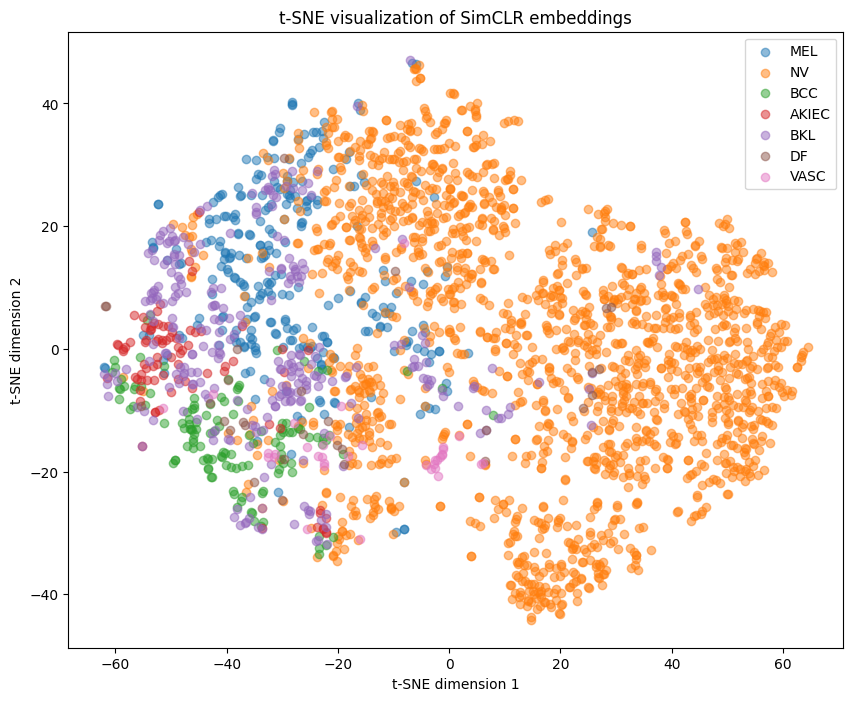

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Make sure the extracted features and labels are being used for t-SNE visualization
# Assume `train_features` and `train_labels` are extracted features and labels from the downstream task

# Using t-SNE for visualization on the extracted features
tsne = TSNE(n_components=2, random_state=42, perplexity=30)  # You can adjust perplexity if needed
features_2d = tsne.fit_transform(train_features)  # `train_features` from your downstream task

# Plotting the t-SNE representation
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(train_labels == i)  # Use `train_labels` from your downstream task
    plt.scatter(features_2d[indices, 0], features_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE visualization of SimCLR embeddings")
plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.show()


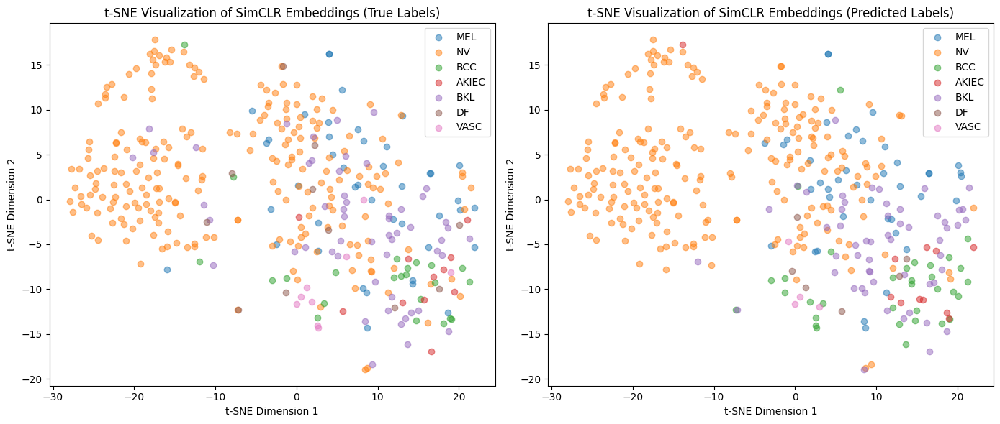

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

# Assuming test_features and test_labels are already defined

# Define test_preds using the classifier `clf` trained earlier
test_preds = clf.predict(test_features)  # Predict the labels using the trained classifier

# 1. t-SNE Visualization of the True Labels
# Using t-SNE for visualization of true labels
tsne = TSNE(n_components=2, random_state=42)
features_test_2d = tsne.fit_transform(test_features)

plt.figure(figsize=(14, 6))

# Visualization of True Labels
plt.subplot(1, 2, 1)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(test_labels == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings (True Labels)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

# 2. t-SNE Visualization of the Predicted Labels
plt.subplot(1, 2, 2)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(test_preds == i)  # Using test_preds to plot predicted labels
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings (Predicted Labels)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


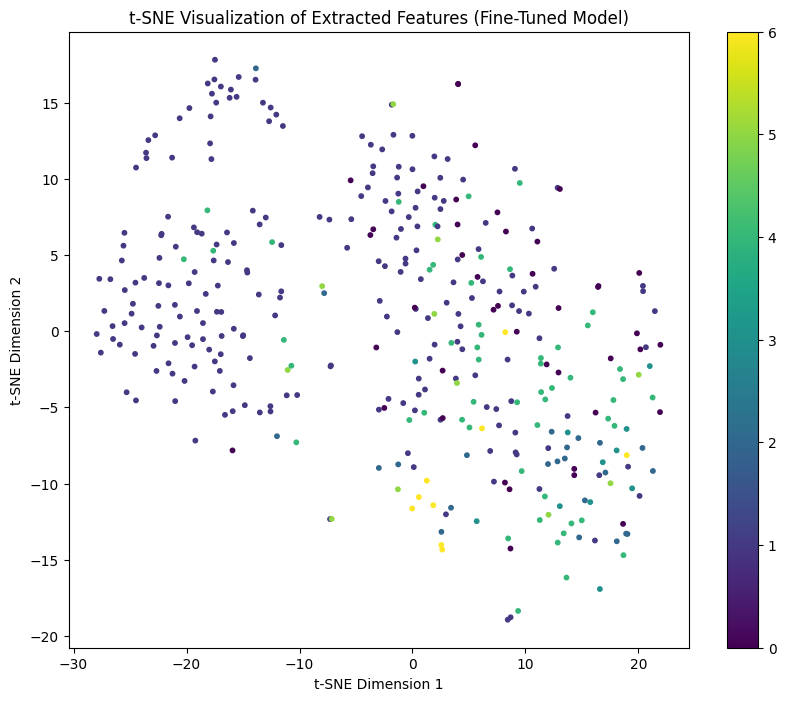

In [ ]:
# Visualize using t-SNE
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Extracted Features (Fine-Tuned Model)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()


In [ ]:
# Check the length of test_labels and predictions
print(f"Number of test labels: {len(test_labels)}")
print(f"Number of predictions: {len(predictions)}")


Number of test labels: 378
Number of predictions: 77


In [ ]:
# Extract features again if necessary, using the entire test set
test_features, test_labels = extract_features(test_dataset, feature_extractor_model)

# Ensure the shapes match
print(f"Number of test features: {len(test_features)}")
print(f"Number of test labels: {len(test_labels)}")

# Generate predictions using the same test features
predictions = classifier.predict(test_features)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Number of test features: 378
Number of test labels: 378


test_labels shape: (378,), example: [1 1 1 0 1]
predictions shape: (378,), example: [2 3 3 2 3]


<Figure size 1000x800 with 0 Axes>

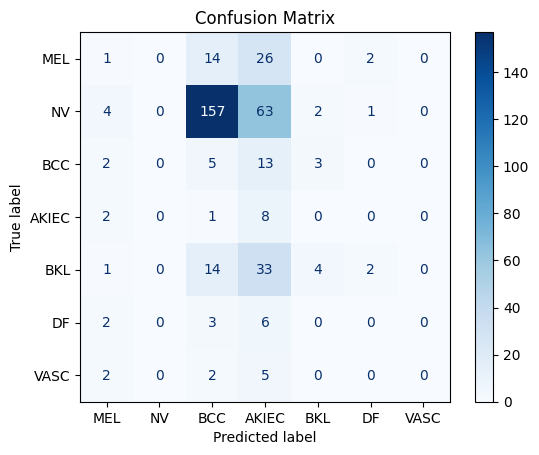

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Convert one-hot encoded test_labels to class indices if necessary
if len(test_labels.shape) > 1 and test_labels.shape[1] > 1:
    test_labels = np.argmax(test_labels, axis=1)

# If predictions are not class indices, convert them
if len(predictions.shape) > 1 and predictions.shape[1] > 1:
    predictions = np.argmax(predictions, axis=1)

# Verify the format of both arrays
print(f"test_labels shape: {test_labels.shape}, example: {test_labels[:5]}")
print(f"predictions shape: {predictions.shape}, example: {predictions[:5]}")

# Compute confusion matrix
conf_matrix = confusion_matrix(test_labels, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.show()


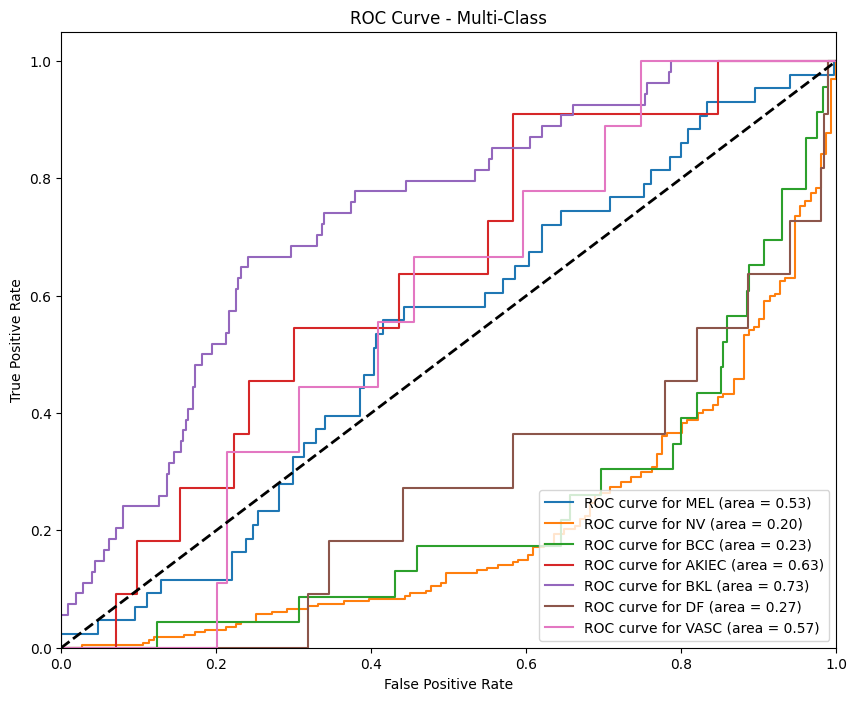

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay

# Binarize the labels for multi-class ROC
test_labels_bin = label_binarize(test_labels, classes=range(len(class_names)))
n_classes = test_labels_bin.shape[1]

# Predict probabilities for ROC calculation
y_score = classifier.predict_proba(test_features)

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(test_labels_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for {class_names[i]} (area = {roc_auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--', lw=2)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class')
plt.legend(loc='lower right')
plt.show()


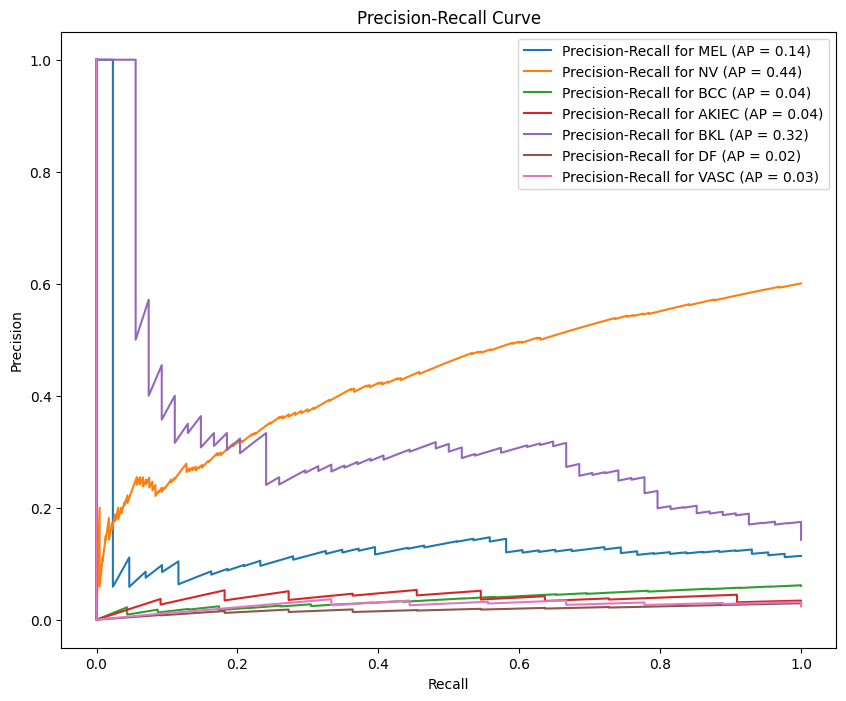

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate precision and recall for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(test_labels_bin[:, i], y_score[:, i])
    average_precision = average_precision_score(test_labels_bin[:, i], y_score[:, i])
    plt.plot(recall, precision, label=f'Precision-Recall for {class_names[i]} (AP = {average_precision:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


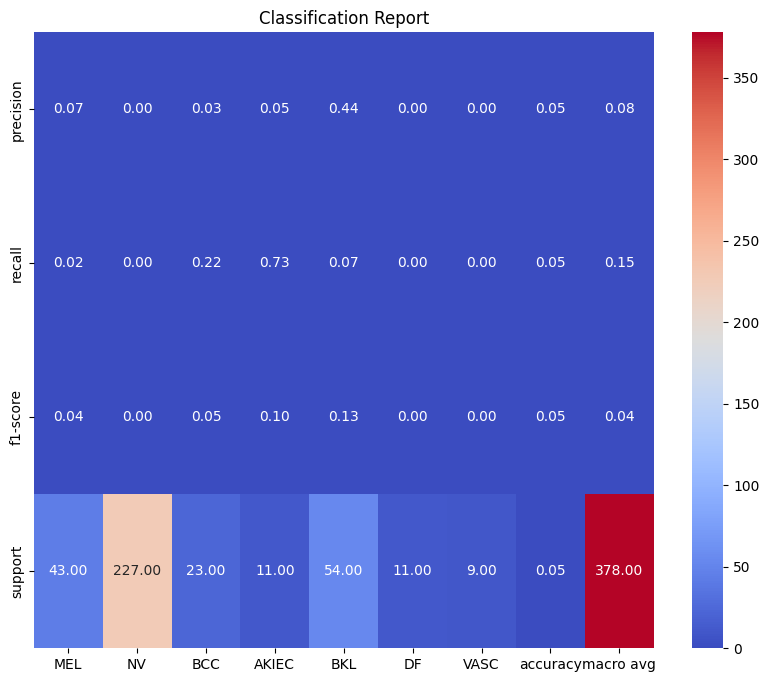

In [ ]:
import seaborn as sns
import pandas as pd

# Get classification report as a dictionary
report_dict = classification_report(test_labels, predictions, target_names=class_names, output_dict=True)

# Convert classification report to a DataFrame
report_df = pd.DataFrame(report_dict).transpose()

# Plot heatmap of the classification report
plt.figure(figsize=(10, 8))
sns.heatmap(report_df.iloc[:-1, :].T, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Classification Report')
plt.show()


<ipython-input-92-1908ddc8871a>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes


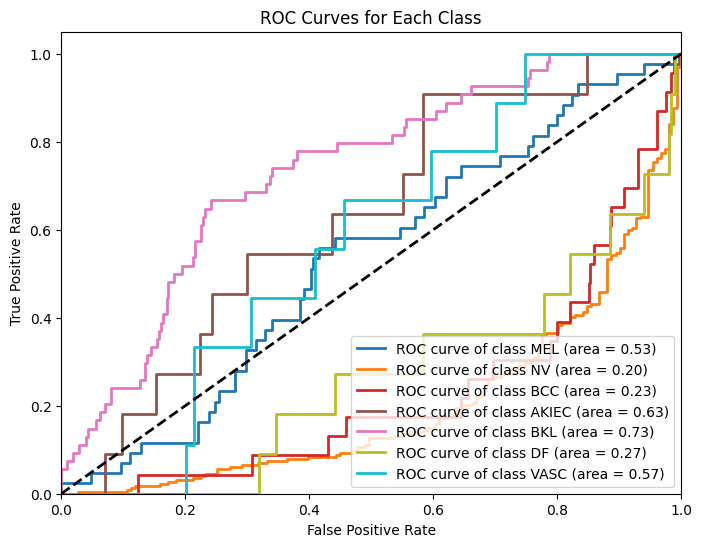

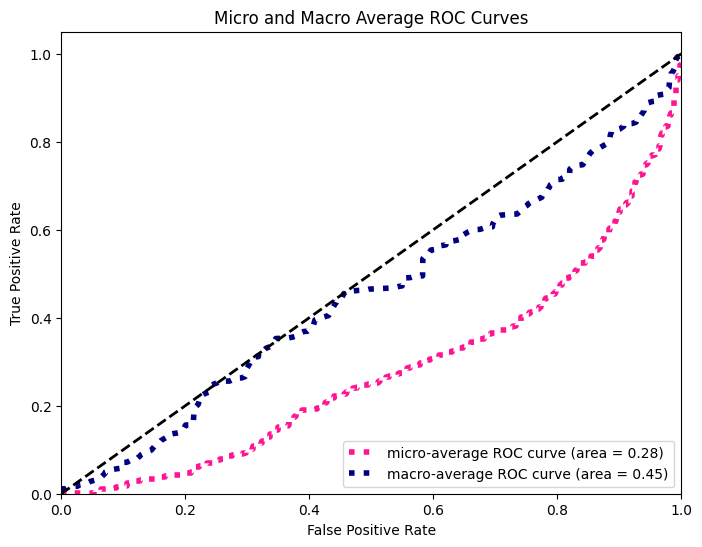

In [ ]:
# Binarize the labels for ROC and AUC computation
test_labels_bin = label_binarize(test_labels, classes=np.arange(7))  # 7 classes in total

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(7):
    fpr[i], tpr[i], _ = roc_curve(test_labels_bin[:, i], classifier.predict_proba(test_features)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes
for i in range(7):
    plt.plot(fpr[i], tpr[i], color=colors(i), lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels_bin.ravel(), classifier.predict_proba(test_features).ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(7)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(7):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= 7

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot micro and macro ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr["micro"], tpr["micro"], label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})', color='deeppink', linestyle=':', linewidth=4)
plt.plot(fpr["macro"], tpr["macro"], label=f'macro-average ROC curve (area = {roc_auc["macro"]:0.2f})', color='navy', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro and Macro Average ROC Curves')
plt.legend(loc="lower right")
plt.show()

50%

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import shutil
import os

# Define paths
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
val_image_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# Define the directory to store the sampled data
sampled_data_dir = '/content/sampled_data/'
sampled_train_dir = os.path.join(sampled_data_dir, 'train')
sampled_val_dir = os.path.join(sampled_data_dir, 'val')
sampled_test_dir = os.path.join(sampled_data_dir, 'test')

# Create directories if they don't exist
for directory in [sampled_train_dir, sampled_val_dir, sampled_test_dir]:
    if not os.path.exists(directory):
        os.makedirs(directory)

# Function to sample data using stratified sampling
def sample_data(csv_path, image_dir, sample_size, output_dir, stratified=True):
    # Read the CSV
    df = pd.read_csv(csv_path)

    # Check class distribution
    class_counts = df.drop(columns=['image']).sum()
    print(f"Class distribution in {csv_path}:")
    print(class_counts)

    # Perform stratified or random sampling
    if stratified:
        # Check if stratified sampling is possible
        min_class_count = class_counts.min()
        if min_class_count < 2:
            print("Not enough samples for stratified sampling. Using random sampling instead.")
            stratified = False

    if stratified:
        # Stratified sampling
        sample_df, _ = train_test_split(df, train_size=sample_size, stratify=df.drop(columns=['image']).values, random_state=42)
    else:
        # Random sampling
        sample_df = df.sample(frac=sample_size, random_state=42)

    # Copy the sampled images to the output directory
    for index, row in sample_df.iterrows():
        image_path = os.path.join(image_dir, row['image'])
        dest_path = os.path.join(output_dir, row['image'])
        if os.path.exists(image_path):
            shutil.copy(image_path, dest_path)

    # Save the sampled CSV file
    sample_csv_path = os.path.join(output_dir, 'sampled_groundtruth.csv')
    sample_df.to_csv(sample_csv_path, index=False)
    print(f"Sampled data saved to {sample_csv_path}")

# Sample 50% of the data for fine-tuning (adjust the sample_size parameter as needed)
sample_size = 0.50

# Sample training data using stratified sampling
print("Sampling training data...")
sample_data(train_csv_path, train_image_dir, sample_size, sampled_train_dir, stratified=True)

# Sample validation and test data using random sampling if stratified is not possible
print("\nSampling validation data...")
sample_data(val_csv_path, val_image_dir, sample_size, sampled_val_dir, stratified=True)

print("\nSampling test data...")
sample_data(test_csv_path, test_image_dir, sample_size, sampled_test_dir, stratified=True)


Sampling training data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv:
MEL      1113.0
NV       6705.0
BCC       514.0
AKIEC     327.0
BKL      1099.0
DF        115.0
VASC      142.0
dtype: float64
Sampled data saved to /content/sampled_data/train/sampled_groundtruth.csv

Sampling validation data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv:
MEL       21.0
NV       123.0
BCC       15.0
AKIEC      8.0
BKL       22.0
DF         1.0
VASC       3.0
dtype: float64
Not enough samples for stratified sampling. Using random sampling instead.
Sampled data saved to /content/sampled_data/val/sampled_groundtruth.csv

Sampling test data...
Class distribution in /content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv:
MEL      171.0
NV       909.0
BCC       93.0
AKIEC     43.0
BKL      217.0
DF        44.0
VASC      35.0
dt

In [ ]:
import os

# Define the directory path where the model is saved
directory_path = '/content/drive/MyDrive/SimCLR_Models/'

# List all files in the specified directory
files = os.listdir(directory_path)

# Print the list of files
print(f"Files in {directory_path}:")
for file in files:
    print(file)


Files in /content/drive/MyDrive/SimCLR_Models/:
simclr_model.keras
simclr_model100.keras


In [ ]:
# Adjust the model path as needed
saved_model_path = '/content/drive/MyDrive/SimCLR_Models/simclr_model100.keras'
# Load the model
model = tf.keras.models.load_model(saved_model_path)

# Print all layer names
for i, layer in enumerate(model.layers):
    print(f"Layer {i}: {layer.name}")


Layer 0: input_layer_1
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 434 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import pandas as pd
import os
import numpy as np
import random

# Set random seeds for reproducibility
np.random.seed(50)
tf.random.set_seed(50)
random.seed(50)

# Adjust the model path as needed
saved_model_path = '/content/drive/MyDrive/SimCLR_Models/simclr_model100.keras'

# Load the base model and remove the projection head
base_model = tf.keras.models.load_model(saved_model_path)
base_model = tf.keras.Model(inputs=base_model.input, outputs=base_model.get_layer("global_average_pooling2d_1").output)

# Adding a new classification head
x = layers.Dense(256, activation='relu')(base_model.output)
x = layers.Dropout(0.5)(x)
output = layers.Dense(7, activation='softmax')(x)  # 7 classes for the skin cancer dataset

# Fine-tuning model
model_finetune = Model(inputs=base_model.input, outputs=output)

# Compile the model with a lower learning rate for fine-tuning
model_finetune.compile(optimizer=Adam(learning_rate=1e-5),
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

# Callbacks for saving the best model and reducing learning rate
callbacks = [
    ModelCheckpoint(filepath='finetuned_simclr_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

# Function to create a labeled dataset for fine-tuning
def create_labeled_dataset(csv_path, image_dir, batch_size=32):
    df = pd.read_csv(csv_path)
    image_paths = [os.path.join(image_dir, fname) for fname in df['image']]
    labels = df.drop(columns=['image']).values

    def parse_function(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        image = tf.image.per_image_standardization(image)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(df))  # Add shuffle for reproducibility
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Create labeled datasets for fine-tuning
sampled_train_dir = '/content/sampled_data/train'
sampled_val_dir = '/content/sampled_data/val'
sampled_test_dir = '/content/sampled_data/test'

train_dataset = create_labeled_dataset(os.path.join(sampled_train_dir, 'sampled_groundtruth.csv'), sampled_train_dir)
val_dataset = create_labeled_dataset(os.path.join(sampled_val_dir, 'sampled_groundtruth.csv'), sampled_val_dir)
test_dataset = create_labeled_dataset(os.path.join(sampled_test_dir, 'sampled_groundtruth.csv'), sampled_test_dir)

# Fine-tune the model
history = model_finetune.fit(train_dataset,
                             validation_data=val_dataset,
                             epochs=50,
                             callbacks=callbacks)

# Evaluate on the test dataset
test_loss, test_accuracy = model_finetune.evaluate(test_dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')


Epoch 1/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 100s 235ms/step - accuracy: 0.4783 - loss: 1.9520 - val_accuracy: 0.7292 - val_loss: 0.8829 - learning_rate: 1.0000e-05
Epoch 2/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.6771 - loss: 0.9012 - val_accuracy: 0.7188 - val_loss: 0.7853 - learning_rate: 1.0000e-05
Epoch 3/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.7046 - loss: 0.8273 - val_accuracy: 0.7292 - val_loss: 0.7573 - learning_rate: 1.0000e-05
Epoch 4/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step - accuracy: 0.7376 - loss: 0.7539 - val_accuracy: 0.7292 - val_loss: 0.7378 - learning_rate: 1.0000e-05
Epoch 5/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.7479 - loss: 0.7047 - val_accuracy: 0.7604 - val_loss: 0.6994 - learning_rate: 1.0000e-05
Epoch 6/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.7628 - loss: 0.6641 - val_accuracy: 0.7500 - val_loss: 0.6909 - learning_rate: 1.0000e-05
Epoch 7/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/st

In [ ]:
# Print all layer names in the model to identify the correct one for feature extraction
for i, layer in enumerate(model_finetune.layers):
    print(f"Layer {i}: {layer.name}")


Layer 0: input_layer_1
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model

# Clear any previous session
tf.keras.backend.clear_session()

# Assuming model_finetune is your fine-tuned model

# Use the correct layer name ('dense') for feature extraction
feature_layer_name = 'dense'  # The dense layer before the final classification head

# Create a feature extraction model
feature_extractor_model = Model(inputs=model_finetune.input, outputs=model_finetune.get_layer(feature_layer_name).output)

# Function to extract features using the fine-tuned model
def extract_features(dataset, model):
    features = []
    labels = []
    for images, label in dataset:
        feature = model.predict(images)  # Extract features using the model
        features.append(feature)
        labels.append(label)
    features = np.vstack(features)  # Stack all the features
    labels = np.vstack(labels)  # Stack all the labels
    return features, labels

# Extract features from training, validation, and test datasets
train_features, train_labels = extract_features(train_dataset, feature_extractor_model)
val_features, val_labels = extract_features(val_dataset, feature_extractor_model)
test_features, test_labels = extract_features(test_dataset, feature_extractor_model)

# Reshape labels to be one-dimensional
train_labels = np.argmax(train_labels, axis=1)
val_labels = np.argmax(val_labels, axis=1)
test_labels = np.argmax(test_labels, axis=1)

print("Feature extraction completed.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Standardize the features
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
val_features = scaler.transform(val_features)
test_features = scaler.transform(test_features)

# Initialize and train the logistic regression classifier with balanced class weights
clf = LogisticRegression(max_iter=5000, class_weight='balanced')
clf.fit(train_features, train_labels)

# Validate on the validation set
val_predictions = clf.predict(val_features)
val_accuracy = accuracy_score(val_labels, val_predictions)
print(f"Validation Accuracy: {val_accuracy:.4f}")

# Test on the test set
test_predictions = clf.predict(test_features)
test_accuracy = accuracy_score(test_labels, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Print classification report for test set
report = classification_report(test_labels, test_predictions, target_names=['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'])
print(report)



Validation Accuracy: 0.7708
Test Accuracy: 0.6587
              precision    recall  f1-score   support

         MEL       0.34      0.47      0.39        86
          NV       0.85      0.81      0.83       454
         BCC       0.43      0.41      0.42        46
       AKIEC       0.30      0.43      0.35        21
         BKL       0.52      0.44      0.48       109
          DF       0.15      0.14      0.14        22
        VASC       0.50      0.50      0.50        18

    accuracy                           0.66       756
   macro avg       0.44      0.46      0.45       756
weighted avg       0.68      0.66      0.67       756



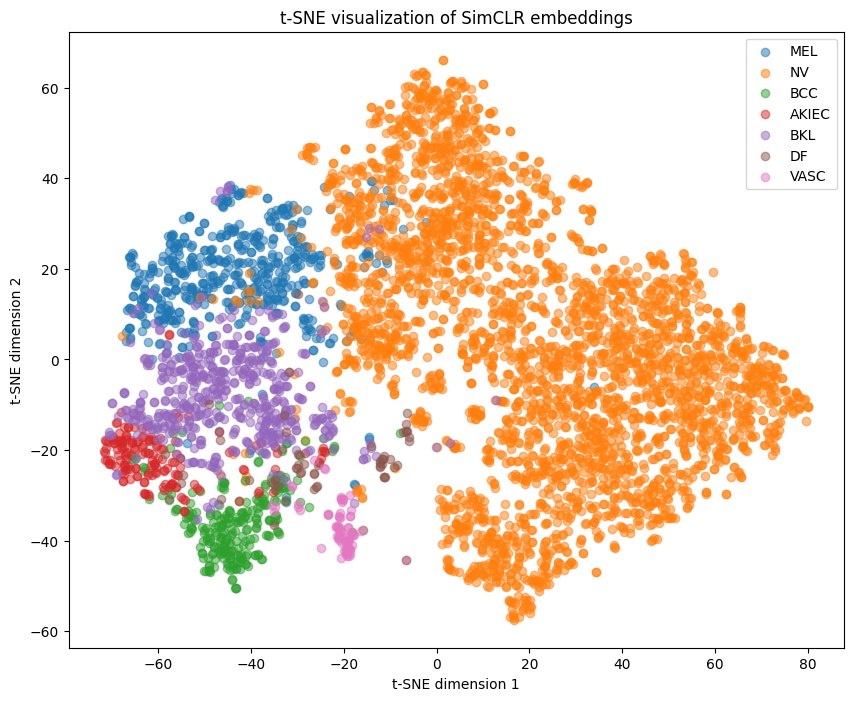

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Make sure the extracted features and labels are being used for t-SNE visualization
# Assume `train_features` and `train_labels` are extracted features and labels from the downstream task

# Using t-SNE for visualization on the extracted features
tsne = TSNE(n_components=2, random_state=42, perplexity=30)  # You can adjust perplexity if needed
features_2d = tsne.fit_transform(train_features)  # `train_features` from your downstream task

# Plotting the t-SNE representation
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(train_labels == i)  # Use `train_labels` from your downstream task
    plt.scatter(features_2d[indices, 0], features_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE visualization of SimCLR embeddings")
plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.show()


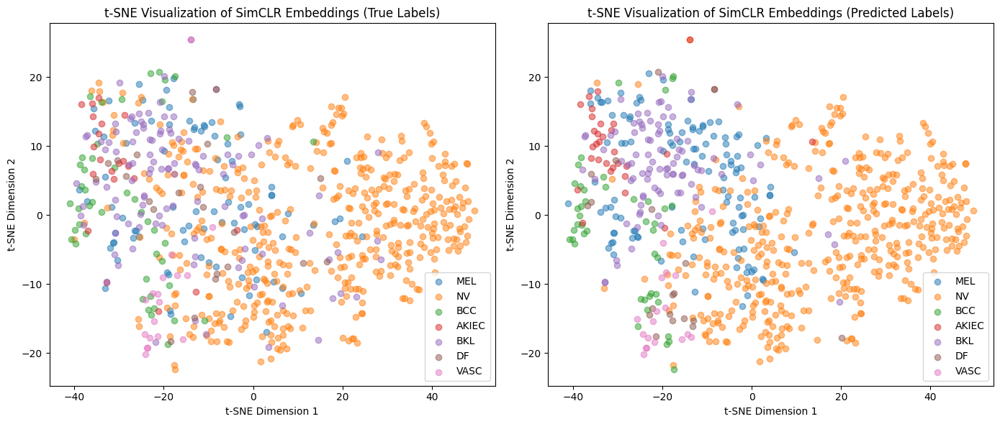

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

# Assuming test_features and test_labels are already defined

# Define test_preds using the classifier `clf` trained earlier
test_preds = clf.predict(test_features)  # Predict the labels using the trained classifier

# 1. t-SNE Visualization of the True Labels
# Using t-SNE for visualization of true labels
tsne = TSNE(n_components=2, random_state=42)
features_test_2d = tsne.fit_transform(test_features)

plt.figure(figsize=(14, 6))

# Visualization of True Labels
plt.subplot(1, 2, 1)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(test_labels == i)
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings (True Labels)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

# 2. t-SNE Visualization of the Predicted Labels
plt.subplot(1, 2, 2)
for i, class_name in enumerate(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']):
    indices = np.where(test_preds == i)  # Using test_preds to plot predicted labels
    plt.scatter(features_test_2d[indices, 0], features_test_2d[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title("t-SNE Visualization of SimCLR Embeddings (Predicted Labels)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


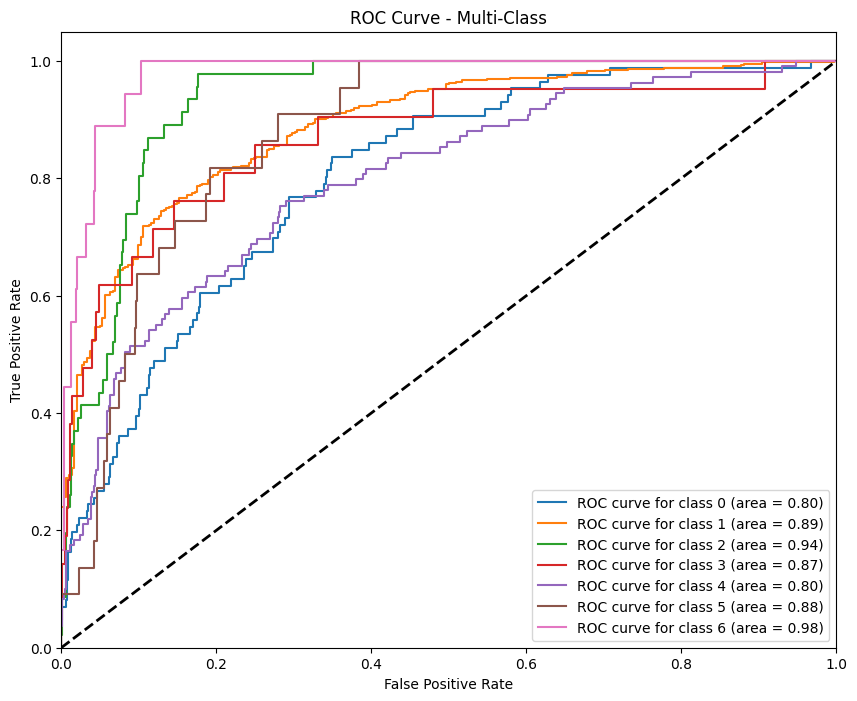

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Binarize the labels for multi-class ROC (One-vs-Rest approach)
test_labels_bin = label_binarize(test_labels, classes=range(len(['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'])))
n_classes = test_labels_bin.shape[1]

# Predict probabilities for ROC calculation (assuming clf is your trained classifier)
y_score = clf.predict_proba(test_features)

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(test_labels_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for class {i} (area = {roc_auc:.2f})')

# Plot the diagonal line for random guess
plt.plot([0, 1], [0, 1], 'k--', lw=2)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class')
plt.legend(loc='lower right')
plt.show()


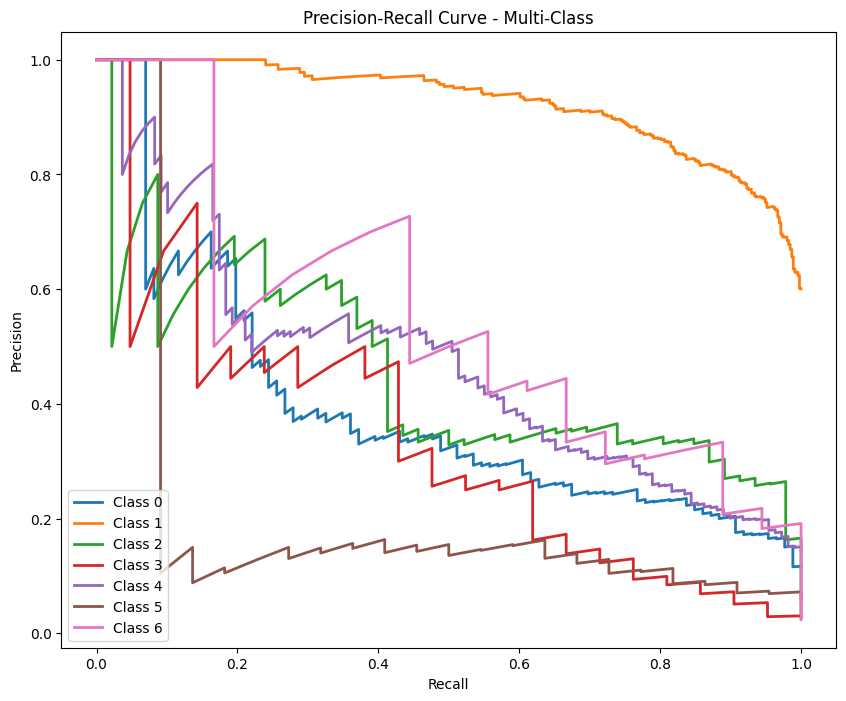

In [ ]:
from sklearn.metrics import precision_recall_curve

# Plot precision-recall curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(test_labels_bin[:, i], y_score[:, i])
    plt.plot(recall, precision, lw=2, label=f'Class {i}')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Multi-Class')
plt.legend(loc='lower left')
plt.show()


<Figure size 1000x800 with 0 Axes>

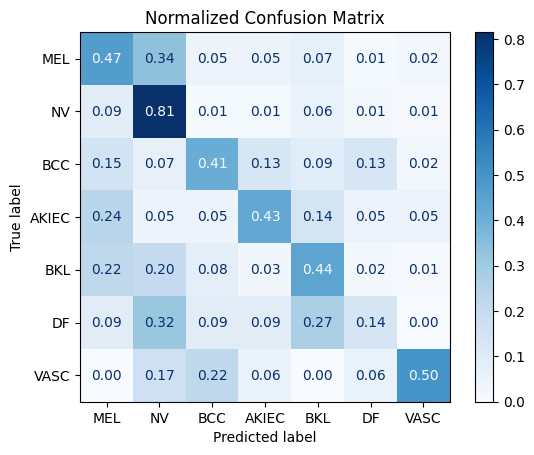

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Compute the confusion matrix
conf_matrix = confusion_matrix(test_labels, test_predictions, normalize='true')

# Display the confusion matrix with normalization
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'])

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
disp.plot(cmap='Blues', values_format='.2f')  # Normalize and use float formatting
plt.title('Normalized Confusion Matrix')
plt.show()


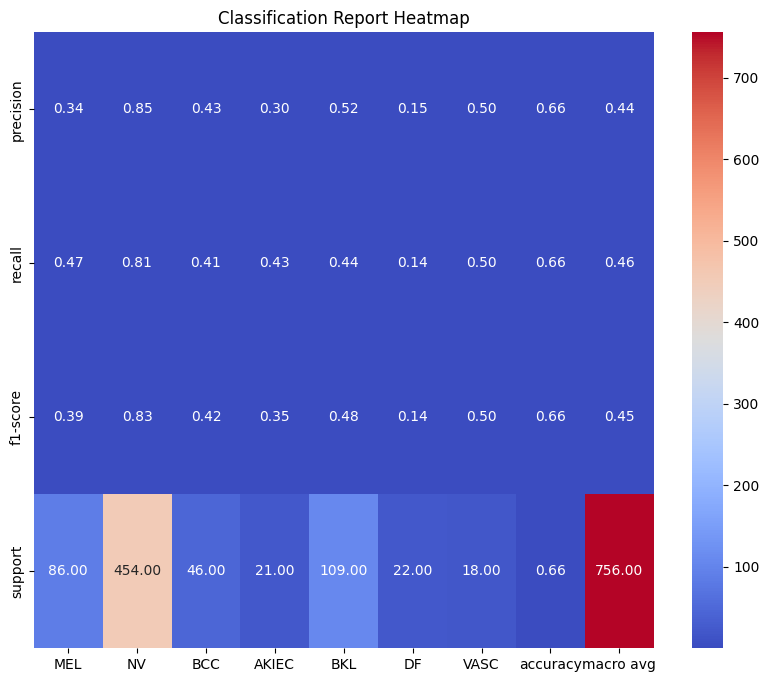

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Assuming you have the trained classifier and test features
# Make predictions using the test data
test_predictions = clf.predict(test_features)

# Get classification report as a dictionary
report_dict = classification_report(test_labels, test_predictions, target_names=class_names, output_dict=True)

# Convert classification report to a DataFrame
report_df = pd.DataFrame(report_dict).transpose()

# Plot heatmap of the classification report
plt.figure(figsize=(10, 8))
sns.heatmap(report_df.iloc[:-1, :].T, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Classification Report Heatmap')
plt.show()


this is over fitiing the mode, i believe icreasing the sample size will overfitt the model, but for backup make sure you give try for 35 and 50% of data

Actual training of BYOL

25/9

with more epochs and increased batch size

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D  # Importing GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, LearningRateScheduler
import pandas as pd
import numpy as np
import os
import gc

# Hyperparameters
BATCH_SIZE = 32  # Adjust based on memory availability
EPOCHS = 20
STEPS_PER_EPOCH = 313  # Adjust based on the size of your dataset
LEARNING_RATE = 1e-4
TAU = 0.99  # Exponential Moving Average weight for target network update

# Clear TensorFlow session and collect garbage to free memory
tf.keras.backend.clear_session()
gc.collect()

# Define data augmentation function
def augment_images(image):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.5)
    image = tf.image.random_contrast(image, lower=0.5, upper=1.5)
    image = tf.image.random_saturation(image, lower=0.5, upper=1.5)
    image = tf.image.random_hue(image, max_delta=0.2)
    image = tf.image.resize(image, [224, 224])  # ResNet50 default input size
    return image

# Load image and apply augmentations twice to generate two views
def parse_function(image_file, label):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)  # Normalize image [0, 1]
    view1 = augment_images(image)  # First augmented view
    view2 = augment_images(image)  # Second augmented view
    return (view1, view2), label

# Function to create a dataset from a sample dataframe and image directory
def create_dataset_from_sample(df_sample, image_dir, batch_size=BATCH_SIZE):
    image_files = [os.path.join(image_dir, fname) for fname in df_sample['image']]
    labels = df_sample.drop(columns=['image']).values
    labels = np.argmax(labels, axis=1)  # Convert one-hot encoded labels to class indices

    dataset = tf.data.Dataset.from_tensor_slices((image_files, labels))
    dataset = dataset.map(parse_function, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Helper function to create a projection head for BYOL
def projection_head(x, output_dim=128):
    x = Dense(256, activation='relu')(x)  # Smaller dense layer for projection head
    x = Dense(output_dim)(x)  # Output layer with the specified dimension
    return x

# Create the BYOL model using ResNet50 as the backbone
def create_byol_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)  # Global Average Pooling on the backbone output
    x = projection_head(x)  # Add projection head
    model = Model(inputs=base_model.input, outputs=x)
    return model

# Create the online and target model using ResNet50 as the backbone
backbone_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
online_model = create_byol_model(backbone_model)
target_model = tf.keras.models.clone_model(online_model)

# Update the target network (EMA - Exponential Moving Average)
def update_target_network(online_model, target_model, tau=TAU):
    for online_weights, target_weights in zip(online_model.trainable_variables, target_model.trainable_variables):
        target_weights.assign(tau * target_weights + (1 - tau) * online_weights)

# Define BYOL loss function
def byol_loss(view1, view2):
    view1 = tf.math.l2_normalize(view1, axis=1)  # Normalize embeddings
    view2 = tf.math.l2_normalize(view2, axis=1)
    similarity = tf.reduce_sum(tf.multiply(view1, view2), axis=1)  # Cosine similarity
    return -tf.reduce_mean(similarity)  # Negative cosine similarity

# Custom training loop for BYOL pretext training
optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)

# Paths to dataset CSV files and image directories
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'

# Read the CSV containing the training data
train_df = pd.read_csv(train_csv_path)

# Create the training dataset using the function defined above
ssl_train_data = create_dataset_from_sample(train_df, train_image_dir)

# Learning rate schedule function
def lr_schedule(epoch, lr):
    if epoch > 0 and epoch % 2 == 0:
        return lr * 0.5
    return lr

# Callbacks for training
log_dir = "logs/byol_pretrain"
callbacks = [
    TensorBoard(log_dir=log_dir, histogram_freq=1),
    LearningRateScheduler(lr_schedule, verbose=1),
    ModelCheckpoint(filepath='byol_best_model.keras', save_best_only=True, monitor='loss', mode='min', verbose=1)
]

# Training function with augmented views
def train_step(view1, view2):
    with tf.GradientTape() as tape:
        # Forward pass through online and target networks
        online_pred_view1 = online_model(view1, training=True)
        online_pred_view2 = online_model(view2, training=True)

        target_pred_view1 = target_model(view1, training=False)
        target_pred_view2 = target_model(view2, training=False)

        # Compute BYOL loss
        loss = byol_loss(online_pred_view1, target_pred_view2) + byol_loss(online_pred_view2, target_pred_view1)

    # Compute gradients and update online model weights
    grads = tape.gradient(loss, online_model.trainable_variables)
    optimizer.apply_gradients(zip(grads, online_model.trainable_variables))

    # Update target model weights
    update_target_network(online_model, target_model)
    return loss

# Training loop
for epoch in range(EPOCHS):
    print(f"Epoch {epoch + 1}/{EPOCHS}")
    for step, ((view1, view2), _) in enumerate(ssl_train_data):
        if step >= STEPS_PER_EPOCH:
            break

        # Pass to the train step function
        loss = train_step(view1, view2)

        if step % 50 == 0:  # Reduced step interval for feedback
            print(f"Step {step}, Loss: {loss.numpy()}")

    # Log the learning rate
    current_lr = optimizer.learning_rate.numpy()
    print(f"Epoch {epoch + 1} completed with loss: {loss.numpy()} and learning rate: {current_lr}")

# Save the trained BYOL model
online_model.save('byol_model.keras')
print("BYOL model saved as byol_model.keras")


Epoch 1/20
Step 0, Loss: -0.133403480052948
Step 50, Loss: -1.9430596828460693
Step 100, Loss: -1.9973890781402588
Step 150, Loss: -1.9993467330932617
Step 200, Loss: -1.8125312328338623
Step 250, Loss: -1.8504467010498047
Step 300, Loss: -1.9313331842422485
Epoch 1 completed with loss: -1.9204657077789307 and learning rate: 9.999999747378752e-05
Epoch 2/20
Step 0, Loss: -1.930119276046753
Step 50, Loss: -1.9351372718811035
Step 100, Loss: -1.9434934854507446
Step 150, Loss: -1.946362853050232
Step 200, Loss: -1.9300174713134766
Step 250, Loss: -1.9493681192398071
Step 300, Loss: -1.9504203796386719
Epoch 2 completed with loss: -1.9514520168304443 and learning rate: 9.999999747378752e-05
Epoch 3/20
Step 0, Loss: -1.9454877376556396
Step 50, Loss: -1.9519798755645752
Step 100, Loss: -1.9529967308044434
Step 150, Loss: -1.9415173530578613
Step 200, Loss: -1.953782558441162
Step 250, Loss: -1.9599473476409912
Step 300, Loss: -1.9580689668655396
Epoch 3 completed with loss: -1.969974994659

Evaluating pre-trained byol

In [ ]:
import tensorflow as tf
from tensorflow.keras import Model
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

# Step 1: Load the pre-trained BYOL model
byol_model_path = 'byol_model.keras'  # Update with your model path if needed
byol_model = tf.keras.models.load_model(byol_model_path)

# Step 2: Feature Extraction Model
# Extract features from the layer before the classification head
feature_extractor_model = Model(inputs=byol_model.input, outputs=byol_model.get_layer(index=-2).output)

# Function to create a dataset for feature extraction
def create_labeled_dataset(csv_path, image_dir, batch_size=32):
    df = pd.read_csv(csv_path)
    image_paths = [os.path.join(image_dir, fname) for fname in df['image']]
    labels = df.drop(columns=['image']).values

    def parse_function(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        image = tf.image.per_image_standardization(image)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Define paths for the test dataset
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# Step 3: Create the test dataset
test_dataset = create_labeled_dataset(test_csv_path, test_image_dir)


Extracttion and downstream task for un-tunned  model

In [ ]:
# Step 4: Extract features from the test dataset
def extract_features(dataset, model):
    features = []
    labels = []
    for images, label in dataset:
        feature = model.predict(images)  # Extract features using the model
        features.append(feature)
        labels.append(label)
    features = np.vstack(features)  # Stack all the features
    labels = np.vstack(labels)  # Stack all the labels
    return features, labels

test_features, test_labels = extract_features(test_dataset, feature_extractor_model)

# Step 5: Standardize the extracted features
scaler = StandardScaler()
test_features = scaler.fit_transform(test_features)

# Step 6: Train and evaluate using a Logistic Regression classifier
test_labels = np.argmax(test_labels, axis=1)  # Convert one-hot to single class labels
clf = LogisticRegression(max_iter=5000, class_weight='balanced')
clf.fit(test_features, test_labels)

# Evaluate the classifier on the test set
test_predictions = clf.predict(test_features)
test_accuracy = accuracy_score(test_labels, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")
print("Classification Report:\n", classification_report(test_labels, test_predictions, target_names=['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']))


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━

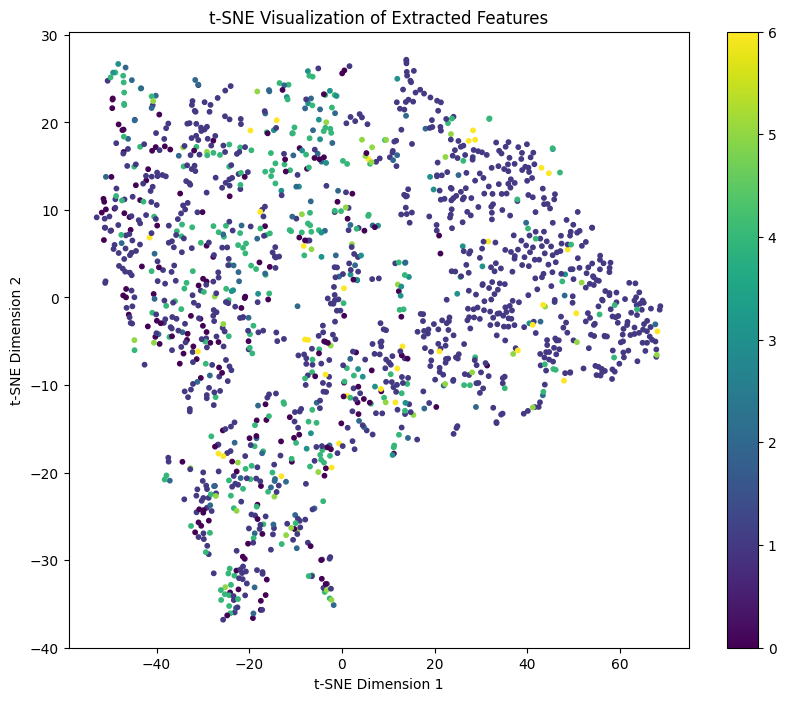

In [ ]:
# Step 7: Visualize the extracted features using t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

# Create a scatter plot of the t-SNE results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Extracted Features')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [ ]:
!pip install umap-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.6 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


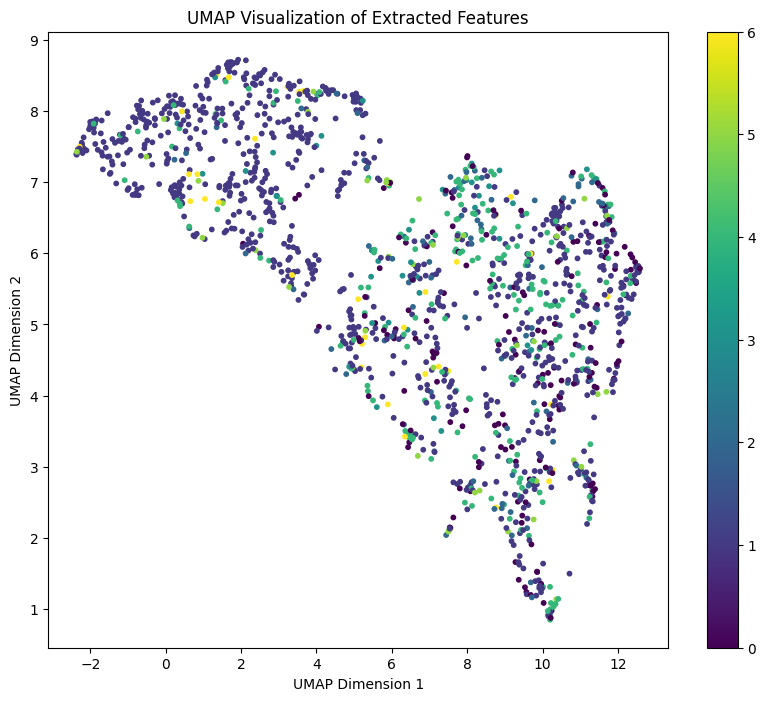

In [ ]:
import umap
import matplotlib.pyplot as plt

# Step 1: Initialize UMAP
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)

# Step 2: Fit and transform the extracted features
umap_results = umap_model.fit_transform(test_features)

# Step 3: Create a scatter plot of the UMAP results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_results[:, 0], umap_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('UMAP Visualization of Extracted Features')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()


In [ ]:
import os

# Define the path to the new directory on Google Drive
drive_directory = '/content/drive/MyDrive/BYOL_Models25/'

# Create the directory if it doesn't exist
if not os.path.exists(drive_directory):
    os.makedirs(drive_directory)
    print(f"Directory '{drive_directory}' created.")
else:
    print(f"Directory '{drive_directory}' already exists.")


Directory '/content/drive/MyDrive/BYOL_Models25/' created.


In [ ]:
import os
import tensorflow as tf

# Define the directory path on Google Drive
drive_directory = '/content/drive/MyDrive/BYOL_Models25/'

# Ensure the directory exists, if not, create it
if not os.path.exists(drive_directory):
    os.makedirs(drive_directory)
    print(f"Directory '{drive_directory}' created.")
else:
    print(f"Directory '{drive_directory}' already exists.")

# Define the full path to save the model
model_save_path = os.path.join(drive_directory, 'byol_model.keras')

# Save the BYOL model to the specified directory on Google Drive
online_model.save(model_save_path)
print(f"BYOL model saved to: {model_save_path}")


Directory '/content/drive/MyDrive/BYOL_Models25/' already exists.
BYOL model saved to: /content/drive/MyDrive/BYOL_Models25/byol_model.keras


load the Byol pre-trainned  model

In [ ]:
import tensorflow as tf

# Define the path to the saved model on Google Drive
model_save_path = '/content/drive/MyDrive/BYOL_Models25/byol_model.keras'

# Load the model using TensorFlow's Keras API
loaded_model = tf.keras.models.load_model(model_save_path)

# Print model summary to verify it is loaded correctly
loaded_model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 24,145,152 (92.11 MB)

 Trainable params: 24,092,032 (91.90 MB)

 Non-trainable params: 53,120 (207.50 KB)

Fine-tuning the byol model

25% sample data

In [ ]:
import pandas as pd
import os
import shutil

# Define paths for the original datasets
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
val_image_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# Define paths for sampled data directories
sampled_data_dir = '/content/sampled_data/'
sampled_train_dir = os.path.join(sampled_data_dir, 'train')
sampled_val_dir = os.path.join(sampled_data_dir, 'val')
sampled_test_dir = os.path.join(sampled_data_dir, 'test')

# Create directories if they don't exist
os.makedirs(sampled_train_dir, exist_ok=True)
os.makedirs(sampled_val_dir, exist_ok=True)
os.makedirs(sampled_test_dir, exist_ok=True)

# Class distribution for stratified sampling (use same as your main dataset)
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}

# Map class names to indices
class_map = {
    'MEL': 0,
    'NV': 1,
    'BCC': 2,
    'AKIEC': 3,
    'BKL': 4,
    'DF': 5,
    'VASC': 6
}

# Function to sample data using stratified sampling
def sample_data(csv_path, image_dir, sample_size, output_dir):
    df = pd.read_csv(csv_path)

    # Adding a 'class_index' column based on the one-hot encoded class columns
    # First, get the class name with the maximum value and then map to class index
    df['class_index'] = df.iloc[:, 1:].idxmax(axis=1).map(class_map)

    min_class_count = min(class_distribution.values())
    sample_per_class = int(sample_size * min_class_count)  # Calculate sample per class
    sample_df = pd.DataFrame()

    # Stratified sampling for each class
    for class_idx in class_distribution:
        # Find rows belonging to the current class index using the newly created 'class_index' column
        class_df = df[df['class_index'] == class_idx]

        # If no samples are available for the class, skip it
        if len(class_df) == 0:
            print(f"Skipping class {class_idx} due to no available samples.")
            continue

        # Perform sampling only if there are enough samples
        if len(class_df) > sample_per_class:
            class_sample_df = class_df.sample(sample_per_class, random_state=42)
        else:
            class_sample_df = class_df

        sample_df = pd.concat([sample_df, class_sample_df])

    # Copy the sampled images to the output directory
    for index, row in sample_df.iterrows():
        image_path = os.path.join(image_dir, row['image'])
        dest_path = os.path.join(output_dir, row['image'])
        if os.path.exists(image_path):
            shutil.copy(image_path, dest_path)

    # Save the sampled CSV file
    sample_csv_path = os.path.join(output_dir, 'sampled_groundtruth.csv')
    sample_df.to_csv(sample_csv_path, index=False)
    print(f"Sampled data saved to {sample_csv_path}")
    return sample_csv_path

# Sampling data (change the sample_size as required)
sample_size = 0.25

# Sample training, validation, and test datasets
print("Sampling training data...")
sampled_train_csv = sample_data(train_csv_path, train_image_dir, sample_size, sampled_train_dir)

print("Sampling validation data...")
sampled_val_csv = sample_data(val_csv_path, val_image_dir, sample_size, sampled_val_dir)

print("Sampling test data...")
sampled_test_csv = sample_data(test_csv_path, test_image_dir, sample_size, sampled_test_dir)


Sampling training data...
Sampled data saved to /content/sampled_data/train/sampled_groundtruth.csv
Sampling validation data...
Sampled data saved to /content/sampled_data/val/sampled_groundtruth.csv
Sampling test data...
Sampled data saved to /content/sampled_data/test/sampled_groundtruth.csv


Defining Focal loss and class distribution

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import pandas as pd
import os

# Clear TensorFlow session
tf.keras.backend.clear_session()

# Define focal loss function
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_sum(loss, axis=1)
    return focal_loss_fixed

# Define your class weights based on class imbalance
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}
total_samples = sum(class_distribution.values())
class_weights = {class_id: total_samples / (len(class_distribution) * count) for class_id, count in class_distribution.items()}

# Load the pre-trained BYOL model
byol_model_path = 'byol_model.keras'  # Ensure this path is correct
byol_model = tf.keras.models.load_model(byol_model_path)

# Check and extract output tensor from the BYOL model
byol_output = byol_model.output if isinstance(byol_model.output, tf.Tensor) else byol_model.output[0]


In [ ]:
# Add a classification head to the BYOL model with unique names
x = layers.Dense(256, activation='relu', name='dense_finetune_1')(byol_output)
x = layers.Dropout(0.5, name='dropout_finetune_1')(x)
output = layers.Dense(7, activation='softmax', name='dense_finetune_output')(x)  # 7 classes for skin cancer dataset

# Create the fine-tuning model
model_finetune = Model(inputs=byol_model.input, outputs=output)

# Explicitly build the model with the input shape before training
model_finetune.build((None, 224, 224, 3))  # Adjust the input shape as necessary

# Compile the fine-tuning model
model_finetune.compile(optimizer=Adam(learning_rate=1e-4),
                       loss=focal_loss(gamma=2., alpha=0.25),
                       metrics=['accuracy'])

# Define callbacks
callbacks = [
    ModelCheckpoint(filepath='finetuned_byol_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

In [ ]:
# Function to create a labeled dataset for fine-tuning
def create_labeled_dataset(csv_path, image_dir, batch_size=32):
    df = pd.read_csv(csv_path)

    # Drop any extra columns except the 'image' column and the 7 class columns
    expected_columns = ['image', 'MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']
    df = df[expected_columns]

    # Ensure that the labels are properly one-hot encoded
    labels = df.drop(columns=['image']).values
    image_paths = [os.path.join(image_dir, fname) for fname in df['image']]

    def parse_function(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        image = tf.image.per_image_standardization(image)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(df))  # Add shuffle for reproducibility
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Define paths for sampled data
sampled_train_csv = '/content/sampled_data/train/sampled_groundtruth.csv'
sampled_train_dir = '/content/sampled_data/train'
sampled_val_csv = '/content/sampled_data/val/sampled_groundtruth.csv'
sampled_val_dir = '/content/sampled_data/val'

# Create labeled datasets for fine-tuning
train_dataset = create_labeled_dataset(sampled_train_csv, sampled_train_dir)
val_dataset = create_labeled_dataset(sampled_val_csv, sampled_val_dir)

# Fine-tune the model using the class weights
history = model_finetune.fit(train_dataset,
                             validation_data=val_dataset,
                             epochs=20,
                             class_weight=class_weights,
                             callbacks=callbacks)

# Save the fine-tuned model
model_finetune.save('finetuned_byol_with_regularization.keras')
print("Fine-tuned BYOL model with regularization saved.")

Epoch 1/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 104s 7s/step - accuracy: 0.1647 - loss: 9.2104 - val_accuracy: 0.2245 - val_loss: 0.8376 - learning_rate: 1.0000e-04
Epoch 2/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.1425 - loss: 4.2090 - val_accuracy: 0.2041 - val_loss: 1.4045 - learning_rate: 1.0000e-04
Epoch 3/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1415 - loss: 2.8636 - val_accuracy: 0.1939 - val_loss: 1.9919 - learning_rate: 1.0000e-04
Epoch 4/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.2140 - loss: 2.2951 - val_accuracy: 0.0306 - val_loss: 3.0526 - learning_rate: 1.0000e-04
Epoch 5/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.2263 - loss: 1.7016 - val_accuracy: 0.0306 - val_loss: 3.2829 - learning_rate: 1.0000e-04
Epoch 6/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.3079 - loss: 1.6477 - val_accuracy: 0.0306 - val_loss: 3.0898 - learning_rate: 1.0000e-04
Epoch 7/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.2786 - loss: 1.3143

In [ ]:
# Assuming `model_finetune` is the fine-tuned BYOL model

# Save the fine-tuned BYOL model to the directory
finetuned_byol_model_path = os.path.join(drive_directory, 'finetuned_byol_model.keras')
model_finetune.save(finetuned_byol_model_path)
print(f"Fine-tuned BYOL model saved to: {finetuned_byol_model_path}")


Fine-tuned BYOL model saved to: /content/drive/MyDrive/BYOL_Models25/finetuned_byol_model.keras


Evaluate the fine-tuned model

In [ ]:
# Define paths for test data
test_csv_path = '/content/sampled_data/test/sampled_groundtruth.csv'  # Update with the correct path if needed
test_image_dir = '/content/sampled_data/test'

# Create the test dataset
test_dataset = create_labeled_dataset(test_csv_path, test_image_dir)

# Evaluate the fine-tuned model on the test dataset
test_loss, test_accuracy = model_finetune.evaluate(test_dataset)
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 428ms/step - accuracy: 0.1382 - loss: 1.3890
Test Loss: 1.3648
Test Accuracy: 0.1429


Analyze

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Predict labels for test data
test_predictions = model_finetune.predict(test_dataset)
test_predictions = np.argmax(test_predictions, axis=1)  # Convert probabilities to class labels

# Get true labels from the test dataset
test_labels = np.concatenate([y.numpy() for _, y in test_dataset])
test_labels = np.argmax(test_labels, axis=1)  # Convert one-hot encoded labels to class labels

# Print classification report
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']
print(classification_report(test_labels, test_predictions, target_names=class_names))

# Print confusion matrix
cm = confusion_matrix(test_labels, test_predictions)
print("Confusion Matrix:\n", cm)


7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 611ms/step
              precision    recall  f1-score   support

         MEL       0.00      0.00      0.00        28
          NV       0.00      0.00      0.00        28
         BCC       0.00      0.00      0.00        28
       AKIEC       0.00      0.00      0.00        28
         BKL       0.14      1.00      0.25        28
          DF       0.00      0.00      0.00        28
        VASC       0.00      0.00      0.00        28

    accuracy                           0.14       196
   macro avg       0.02      0.14      0.04       196
weighted avg       0.02      0.14      0.04       196

Confusion Matrix:
 [[ 0  0  0  0 28  0  0]
 [ 0  0  0  0 28  0  0]
 [ 0  0  0  0 28  0  0]
 [ 0  0  0  0 28  0  0]
 [ 0  0  0  0 28  0  0]
 [ 0  0  0  0 28  0  0]
 [ 0  0  0  0 28  0  0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


visualize

7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 581ms/step


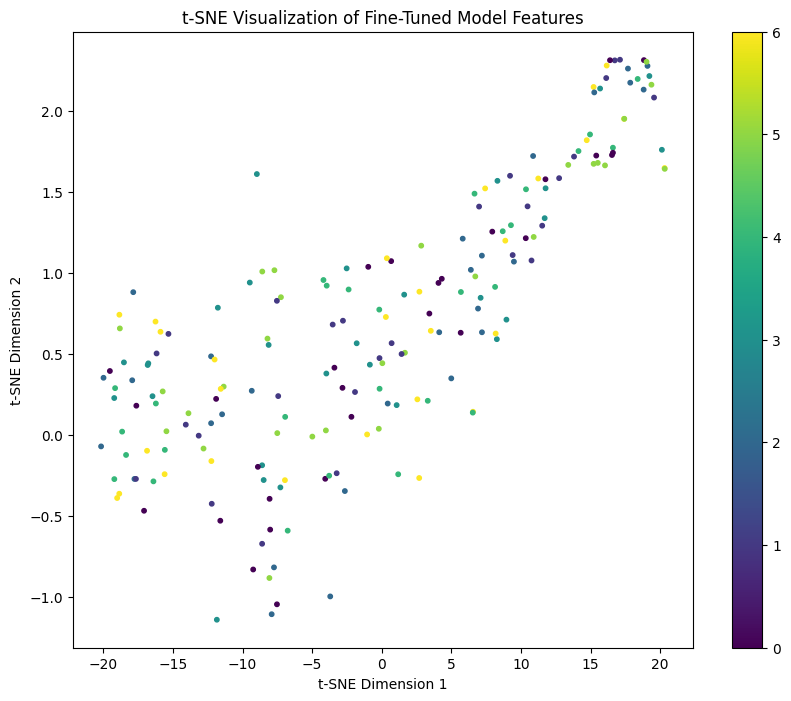

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Extract features from the fine-tuned model's feature extractor
feature_extractor = Model(inputs=model_finetune.input, outputs=model_finetune.layers[-3].output)  # Adjust layer index if needed
test_features = feature_extractor.predict(test_dataset)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

# Visualize with t-SNE
plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Fine-Tuned Model Features')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


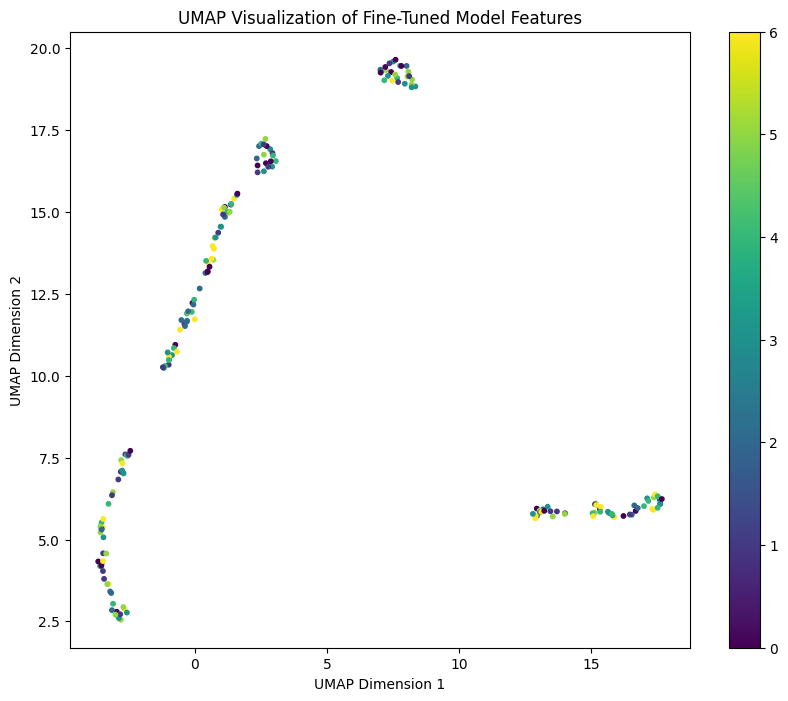

In [ ]:
import umap

# Apply UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_results = reducer.fit_transform(test_features)

# Visualize with UMAP
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_results[:, 0], umap_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('UMAP Visualization of Fine-Tuned Model Features')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()


Extract features for downstream task

In [ ]:
import tensorflow as tf

# Load the fine-tuned BYOL model
fine_tuned_model_path = 'finetuned_byol_with_regularization.keras'
fine_tuned_model = tf.keras.models.load_model(fine_tuned_model_path, custom_objects={'focal_loss_fixed': focal_loss(gamma=2., alpha=0.25)})

# Remove the classification head to use it as a feature extractor
feature_extractor = tf.keras.Model(inputs=fine_tuned_model.input, outputs=fine_tuned_model.layers[-3].output)


In [ ]:
def extract_features(dataset, model):
    features = []
    labels = []
    for images, lbls in dataset:
        feats = model.predict(images)  # Extract features using the feature extractor model
        features.append(feats)
        labels.append(lbls)

    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0)
    return features, labels

# Create test dataset
test_dataset = create_labeled_dataset(sampled_test_csv, sampled_test_dir, batch_size=32)

# Extract features and labels from the test dataset
test_features, test_labels = extract_features(test_dataset, feature_extractor)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Flatten labels if one-hot encoded
test_labels = np.argmax(test_labels, axis=1)

# Initialize and train a classifier (Logistic Regression or SVM)
classifier = LogisticRegression(max_iter=5000, class_weight='balanced')
#classifier = SVC(class_weight='balanced', probability=True)

# Train the classifier
classifier.fit(test_features, test_labels)

# Evaluate on the test set
predictions = classifier.predict(test_features)
accuracy = accuracy_score(test_labels, predictions)
print(f'Test Accuracy of the downstream classifier: {accuracy:.4f}')
print('Classification Report:')
print(classification_report(test_labels, predictions))


Test Accuracy of the downstream classifier: 0.6071
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.71      0.71        28
           1       0.53      0.61      0.57        28
           2       0.54      0.54      0.54        28
           3       0.60      0.75      0.67        28
           4       0.55      0.61      0.58        28
           5       0.62      0.29      0.39        28
           6       0.72      0.75      0.74        28

    accuracy                           0.61       196
   macro avg       0.61      0.61      0.60       196
weighted avg       0.61      0.61      0.60       196



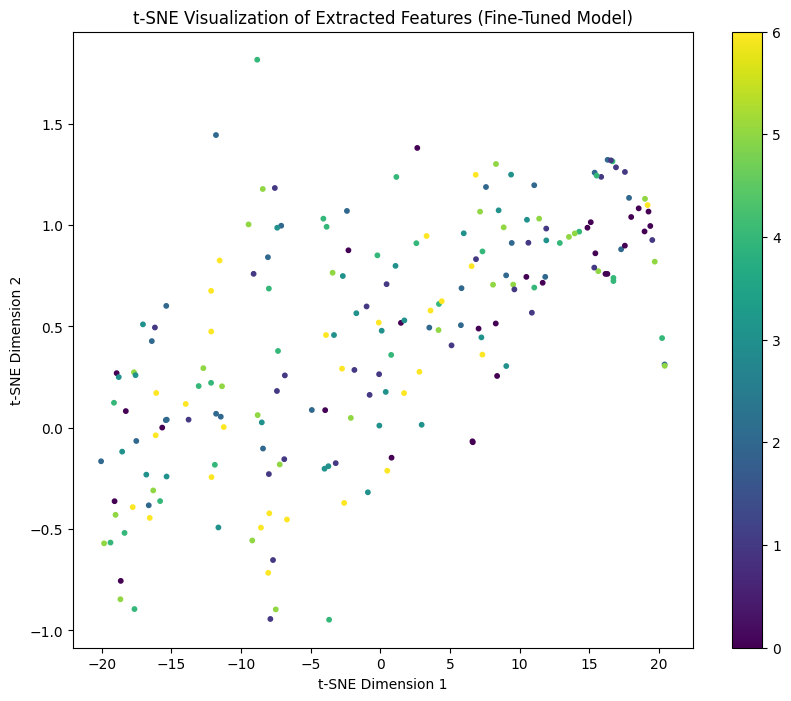

In [ ]:
# Visualize using t-SNE
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Extracted Features (Fine-Tuned Model)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()


In [ ]:
# scaling will reduce the accuracy

visualization

Confusion Matrix

<Figure size 1000x800 with 0 Axes>

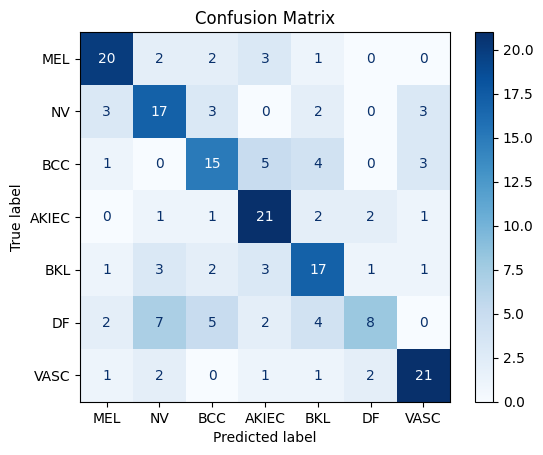

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute confusion matrix
conf_matrix = confusion_matrix(test_labels, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.show()


ROC Curve and AUC

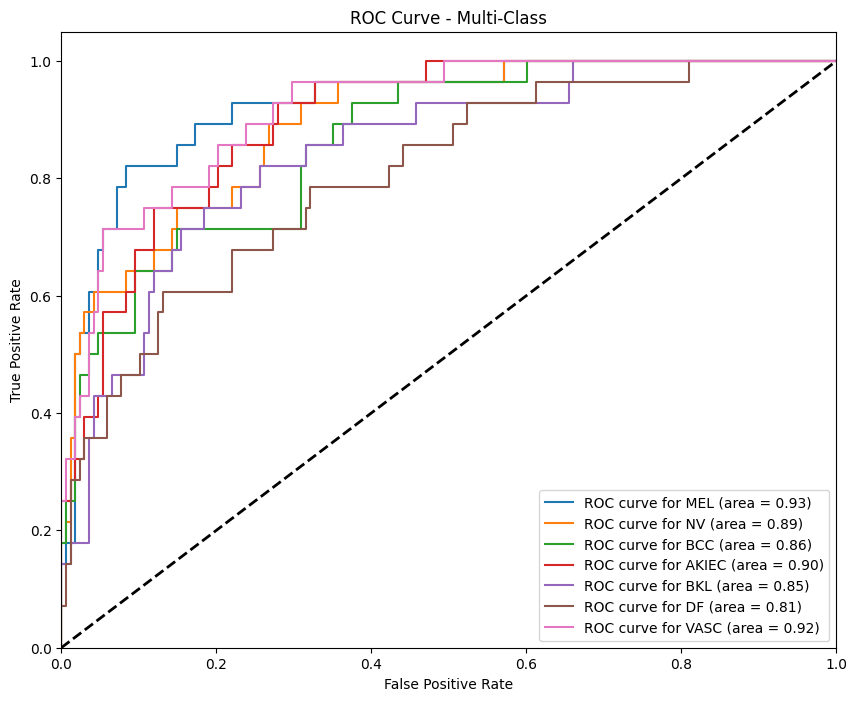

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay

# Binarize the labels for multi-class ROC
test_labels_bin = label_binarize(test_labels, classes=range(len(class_names)))
n_classes = test_labels_bin.shape[1]

# Predict probabilities for ROC calculation
y_score = classifier.predict_proba(test_features)

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(test_labels_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for {class_names[i]} (area = {roc_auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--', lw=2)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class')
plt.legend(loc='lower right')
plt.show()


 Precision-Recall Curve

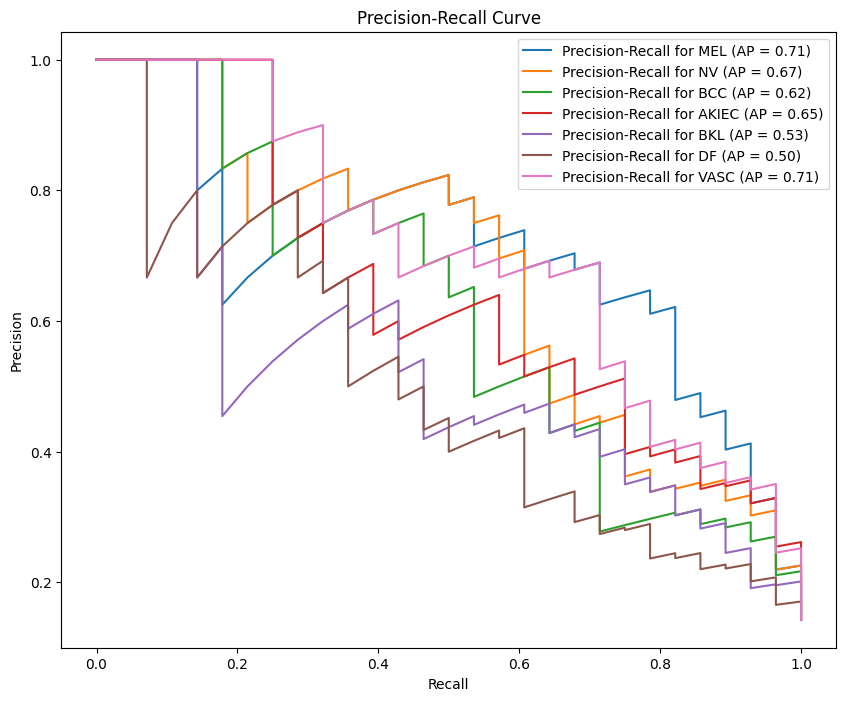

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate precision and recall for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(test_labels_bin[:, i], y_score[:, i])
    average_precision = average_precision_score(test_labels_bin[:, i], y_score[:, i])
    plt.plot(recall, precision, label=f'Precision-Recall for {class_names[i]} (AP = {average_precision:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()


Classification Report Visualization

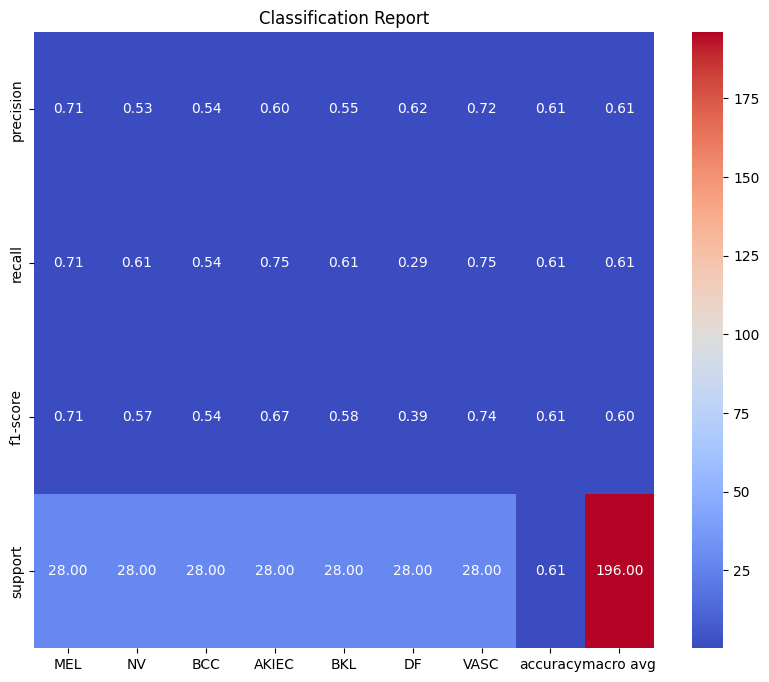

In [ ]:
import seaborn as sns
import pandas as pd

# Get classification report as a dictionary
report_dict = classification_report(test_labels, predictions, target_names=class_names, output_dict=True)

# Convert classification report to a DataFrame
report_df = pd.DataFrame(report_dict).transpose()

# Plot heatmap of the classification report
plt.figure(figsize=(10, 8))
sns.heatmap(report_df.iloc[:-1, :].T, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Classification Report')
plt.show()


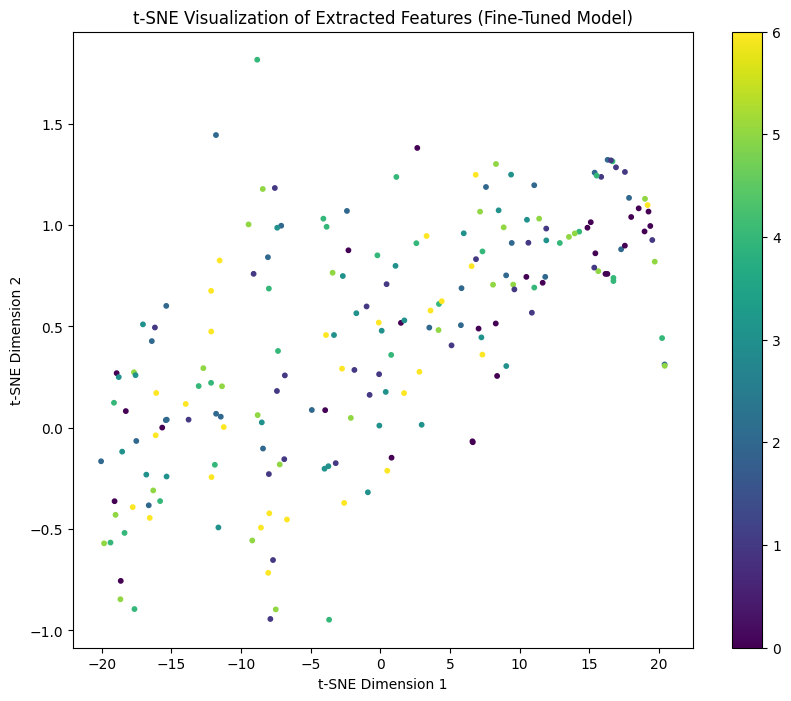

In [ ]:
# Visualize using t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Extracted Features (Fine-Tuned Model)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

<ipython-input-84-1908ddc8871a>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes


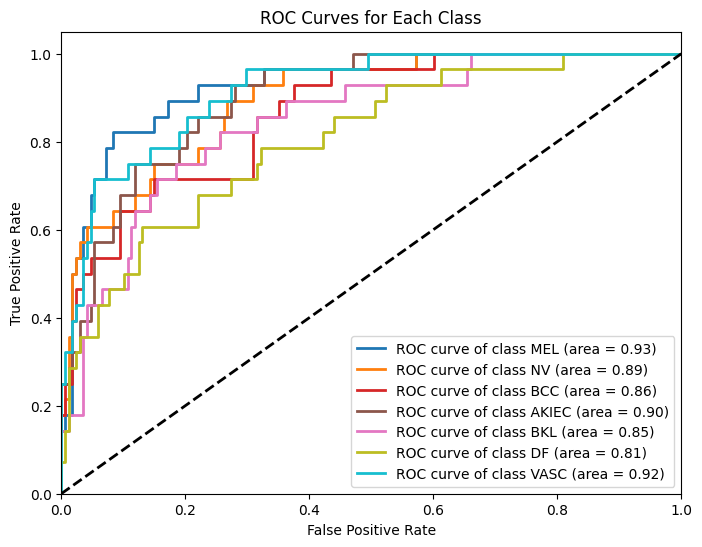

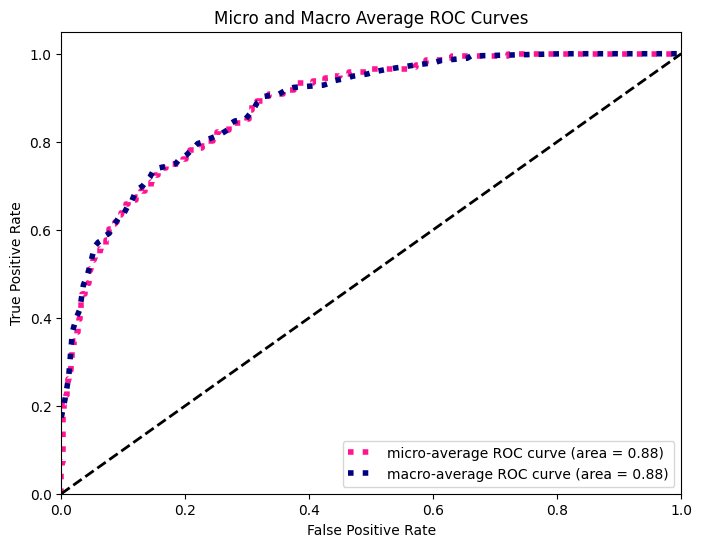

In [ ]:
# Binarize the labels for ROC and AUC computation
test_labels_bin = label_binarize(test_labels, classes=np.arange(7))  # 7 classes in total

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(7):
    fpr[i], tpr[i], _ = roc_curve(test_labels_bin[:, i], classifier.predict_proba(test_features)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes
for i in range(7):
    plt.plot(fpr[i], tpr[i], color=colors(i), lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels_bin.ravel(), classifier.predict_proba(test_features).ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(7)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(7):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= 7

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot micro and macro ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr["micro"], tpr["micro"], label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})', color='deeppink', linestyle=':', linewidth=4)
plt.plot(fpr["macro"], tpr["macro"], label=f'macro-average ROC curve (area = {roc_auc["macro"]:0.2f})', color='navy', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro and Macro Average ROC Curves')
plt.legend(loc="lower right")
plt.show()

check for 50% sample data

In [ ]:
import pandas as pd
import os
import shutil

# Define paths for the original datasets
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
val_image_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# Define paths for sampled data directories
sampled_data_dir = '/content/sampled_data/'
sampled_train_dir = os.path.join(sampled_data_dir, 'train')
sampled_val_dir = os.path.join(sampled_data_dir, 'val')
sampled_test_dir = os.path.join(sampled_data_dir, 'test')

# Create directories if they don't exist
os.makedirs(sampled_train_dir, exist_ok=True)
os.makedirs(sampled_val_dir, exist_ok=True)
os.makedirs(sampled_test_dir, exist_ok=True)

# Class distribution for stratified sampling (use same as your main dataset)
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}

# Map class names to indices
class_map = {
    'MEL': 0,
    'NV': 1,
    'BCC': 2,
    'AKIEC': 3,
    'BKL': 4,
    'DF': 5,
    'VASC': 6
}

# Function to sample data using stratified sampling
def sample_data(csv_path, image_dir, sample_size, output_dir):
    df = pd.read_csv(csv_path)

    # Adding a 'class_index' column based on the one-hot encoded class columns
    # First, get the class name with the maximum value and then map to class index
    df['class_index'] = df.iloc[:, 1:].idxmax(axis=1).map(class_map)

    min_class_count = min(class_distribution.values())
    sample_per_class = int(sample_size * min_class_count)  # Calculate sample per class
    sample_df = pd.DataFrame()

    # Stratified sampling for each class
    for class_idx in class_distribution:
        # Find rows belonging to the current class index using the newly created 'class_index' column
        class_df = df[df['class_index'] == class_idx]

        # If no samples are available for the class, skip it
        if len(class_df) == 0:
            print(f"Skipping class {class_idx} due to no available samples.")
            continue

        # Perform sampling only if there are enough samples
        if len(class_df) > sample_per_class:
            class_sample_df = class_df.sample(sample_per_class, random_state=42)
        else:
            class_sample_df = class_df

        sample_df = pd.concat([sample_df, class_sample_df])

    # Copy the sampled images to the output directory
    for index, row in sample_df.iterrows():
        image_path = os.path.join(image_dir, row['image'])
        dest_path = os.path.join(output_dir, row['image'])
        if os.path.exists(image_path):
            shutil.copy(image_path, dest_path)

    # Save the sampled CSV file
    sample_csv_path = os.path.join(output_dir, 'sampled_groundtruth.csv')
    sample_df.to_csv(sample_csv_path, index=False)
    print(f"Sampled data saved to {sample_csv_path}")
    return sample_csv_path

# Sampling data (change the sample_size as required)
sample_size = 0.50

# Sample training, validation, and test datasets
print("Sampling training data...")
sampled_train_csv = sample_data(train_csv_path, train_image_dir, sample_size, sampled_train_dir)

print("Sampling validation data...")
sampled_val_csv = sample_data(val_csv_path, val_image_dir, sample_size, sampled_val_dir)

print("Sampling test data...")
sampled_test_csv = sample_data(test_csv_path, test_image_dir, sample_size, sampled_test_dir)


Sampling training data...
Sampled data saved to /content/sampled_data/train/sampled_groundtruth.csv
Sampling validation data...
Sampled data saved to /content/sampled_data/val/sampled_groundtruth.csv
Sampling test data...
Sampled data saved to /content/sampled_data/test/sampled_groundtruth.csv


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import pandas as pd
import os

# Clear TensorFlow session
tf.keras.backend.clear_session()

# Define focal loss function
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_sum(loss, axis=1)
    return focal_loss_fixed

# Define your class weights based on class imbalance
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}
total_samples = sum(class_distribution.values())
class_weights = {class_id: total_samples / (len(class_distribution) * count) for class_id, count in class_distribution.items()}

# Load the pre-trained BYOL model
byol_model_path = 'byol_model.keras'  # Ensure this path is correct
byol_model = tf.keras.models.load_model(byol_model_path)

# Check and extract output tensor from the BYOL model
byol_output = byol_model.output if isinstance(byol_model.output, tf.Tensor) else byol_model.output[0]


In [ ]:
# Add a classification head to the BYOL model with unique names
x = layers.Dense(256, activation='relu', name='dense_finetune_1')(byol_output)
x = layers.Dropout(0.5, name='dropout_finetune_1')(x)
output = layers.Dense(7, activation='softmax', name='dense_finetune_output')(x)  # 7 classes for skin cancer dataset

# Create the fine-tuning model
model_finetune = Model(inputs=byol_model.input, outputs=output)

# Explicitly build the model with the input shape before training
model_finetune.build((None, 224, 224, 3))  # Adjust the input shape as necessary

# Compile the fine-tuning model
model_finetune.compile(optimizer=Adam(learning_rate=1e-4),
                       loss=focal_loss(gamma=2., alpha=0.25),
                       metrics=['accuracy'])

# Define callbacks
callbacks = [
    ModelCheckpoint(filepath='finetuned_byol_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

In [ ]:
# Function to create a labeled dataset for fine-tuning
def create_labeled_dataset(csv_path, image_dir, batch_size=32):
    df = pd.read_csv(csv_path)

    # Drop any extra columns except the 'image' column and the 7 class columns
    expected_columns = ['image', 'MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']
    df = df[expected_columns]

    # Ensure that the labels are properly one-hot encoded
    labels = df.drop(columns=['image']).values
    image_paths = [os.path.join(image_dir, fname) for fname in df['image']]

    def parse_function(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        image = tf.image.per_image_standardization(image)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(df))  # Add shuffle for reproducibility
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Define paths for sampled data
sampled_train_csv = '/content/sampled_data/train/sampled_groundtruth.csv'
sampled_train_dir = '/content/sampled_data/train'
sampled_val_csv = '/content/sampled_data/val/sampled_groundtruth.csv'
sampled_val_dir = '/content/sampled_data/val'

# Create labeled datasets for fine-tuning
train_dataset = create_labeled_dataset(sampled_train_csv, sampled_train_dir)
val_dataset = create_labeled_dataset(sampled_val_csv, sampled_val_dir)

# Fine-tune the model using the class weights
history = model_finetune.fit(train_dataset,
                             validation_data=val_dataset,
                             epochs=30,
                             class_weight=class_weights,
                             callbacks=callbacks)

# Save the fine-tuned model
model_finetune.save('finetuned_byol_with_regularization50.keras')
print("Fine-tuned BYOL model with regularization saved.")

Epoch 1/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 97s 4s/step - accuracy: 0.1620 - loss: 3.4036 - val_accuracy: 0.0157 - val_loss: 2.9774 - learning_rate: 1.0000e-04
Epoch 2/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.1345 - loss: 2.6796 - val_accuracy: 0.0315 - val_loss: 3.0064 - learning_rate: 1.0000e-04
Epoch 3/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 232ms/step - accuracy: 0.2469 - loss: 1.2924 - val_accuracy: 0.0315 - val_loss: 2.3336 - learning_rate: 1.0000e-04
Epoch 4/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - accuracy: 0.2820 - loss: 0.9487 - val_accuracy: 0.0315 - val_loss: 1.1750 - learning_rate: 1.0000e-04
Epoch 5/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 237ms/step - accuracy: 0.2963 - loss: 0.7020 - val_accuracy: 0.0315 - val_loss: 0.7589 - learning_rate: 1.0000e-04
Epoch 6/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.3334 - loss: 0.6554 - val_accuracy: 0.0315 - val_loss: 0.7795 - learning_rate: 1.0000e-04
Epoch 7/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - accuracy: 0.44

Extraction for 50%

In [ ]:
import tensorflow as tf

# Load the fine-tuned BYOL model
fine_tuned_model_path = 'finetuned_byol_with_regularization50.keras'
fine_tuned_model = tf.keras.models.load_model(fine_tuned_model_path, custom_objects={'focal_loss_fixed': focal_loss(gamma=2., alpha=0.25)})

# Remove the classification head to use it as a feature extractor
feature_extractor = tf.keras.Model(inputs=fine_tuned_model.input, outputs=fine_tuned_model.layers[-3].output)


In [ ]:
def extract_features(dataset, model):
    features = []
    labels = []
    for images, lbls in dataset:
        feats = model.predict(images)  # Extract features using the feature extractor model
        features.append(feats)
        labels.append(lbls)

    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0)
    return features, labels

# Create test dataset
test_dataset = create_labeled_dataset(sampled_test_csv, sampled_test_dir, batch_size=32)

# Extract features and labels from the test dataset
test_features, test_labels = extract_features(test_dataset, feature_extractor)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


Downstream tsk for 50% data

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Flatten labels if one-hot encoded
test_labels = np.argmax(test_labels, axis=1)

# Initialize and train a classifier (Logistic Regression or SVM)
classifier = LogisticRegression(max_iter=5000, class_weight='balanced')
#classifier = SVC(class_weight='balanced', probability=True)

# Train the classifier
classifier.fit(test_features, test_labels)

# Evaluate on the test set
predictions = classifier.predict(test_features)
accuracy = accuracy_score(test_labels, predictions)
print(f'Test Accuracy of the downstream classifier: {accuracy:.4f}')
print('Classification Report:')
print(classification_report(test_labels, predictions))


Test Accuracy of the downstream classifier: 0.8229
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.70      0.76        57
           1       0.90      0.82      0.86        57
           2       0.79      0.81      0.80        57
           3       0.75      0.95      0.84        43
           4       0.85      0.72      0.78        57
           5       0.76      0.89      0.82        44
           6       0.89      0.97      0.93        35

    accuracy                           0.82       350
   macro avg       0.83      0.84      0.83       350
weighted avg       0.83      0.82      0.82       350



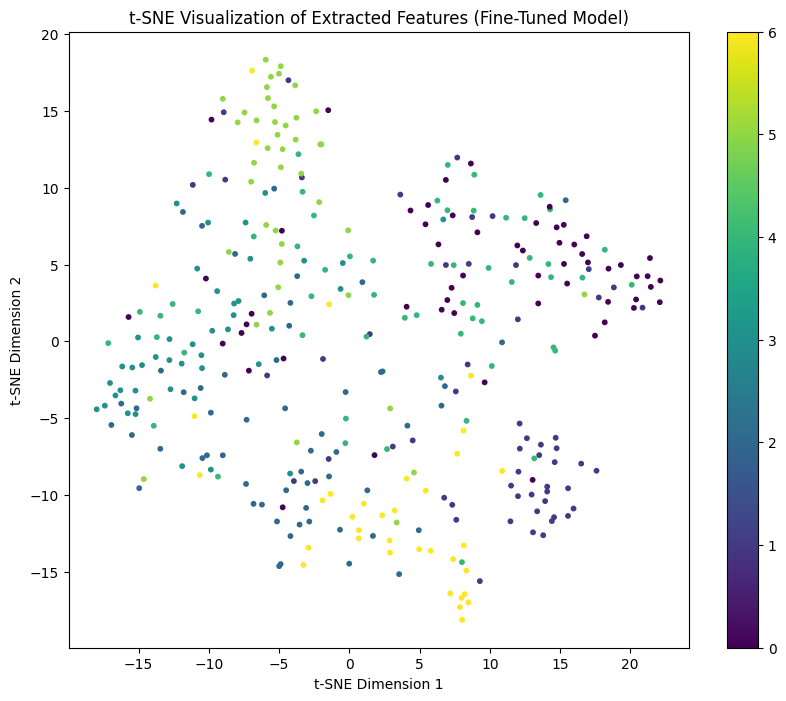

In [ ]:
# Visualize using t-SNE
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Extracted Features (Fine-Tuned Model)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()


In [ ]:
# Assuming `model_finetune` is the fine-tuned BYOL model

# Save the fine-tuned BYOL model to the directory
finetuned_byol_model_path = os.path.join(drive_directory, 'finetuned_byol_model50.keras')
model_finetune.save(finetuned_byol_model_path)
print(f"Fine-tuned BYOL model saved to: {finetuned_byol_model_path}")


Fine-tuned BYOL model saved to: /content/drive/MyDrive/BYOL_Models25/finetuned_byol_model50.keras


<Figure size 1000x800 with 0 Axes>

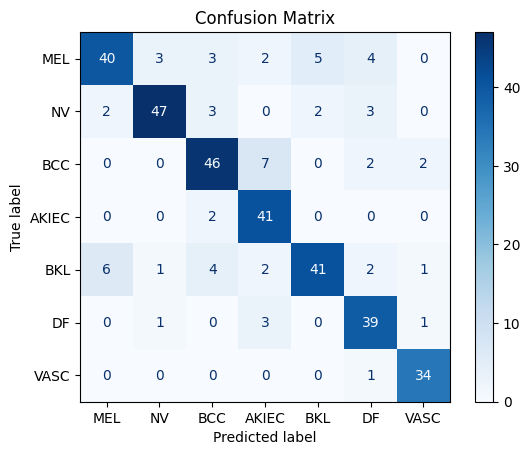

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute confusion matrix
conf_matrix = confusion_matrix(test_labels, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.show()


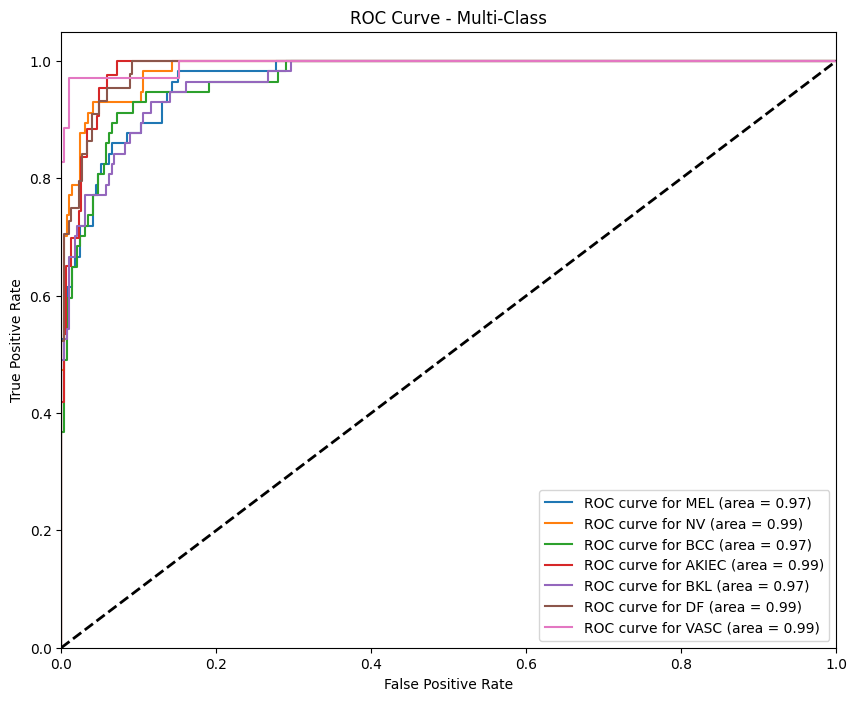

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay

# Binarize the labels for multi-class ROC
test_labels_bin = label_binarize(test_labels, classes=range(len(class_names)))
n_classes = test_labels_bin.shape[1]

# Predict probabilities for ROC calculation
y_score = classifier.predict_proba(test_features)

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(test_labels_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for {class_names[i]} (area = {roc_auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--', lw=2)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class')
plt.legend(loc='lower right')
plt.show()


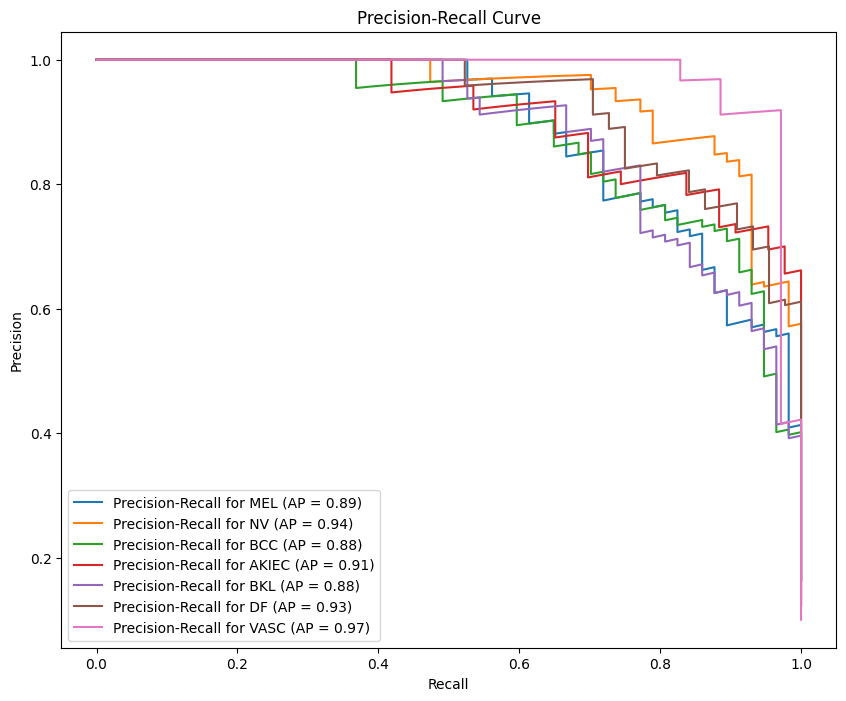

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate precision and recall for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(test_labels_bin[:, i], y_score[:, i])
    average_precision = average_precision_score(test_labels_bin[:, i], y_score[:, i])
    plt.plot(recall, precision, label=f'Precision-Recall for {class_names[i]} (AP = {average_precision:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()


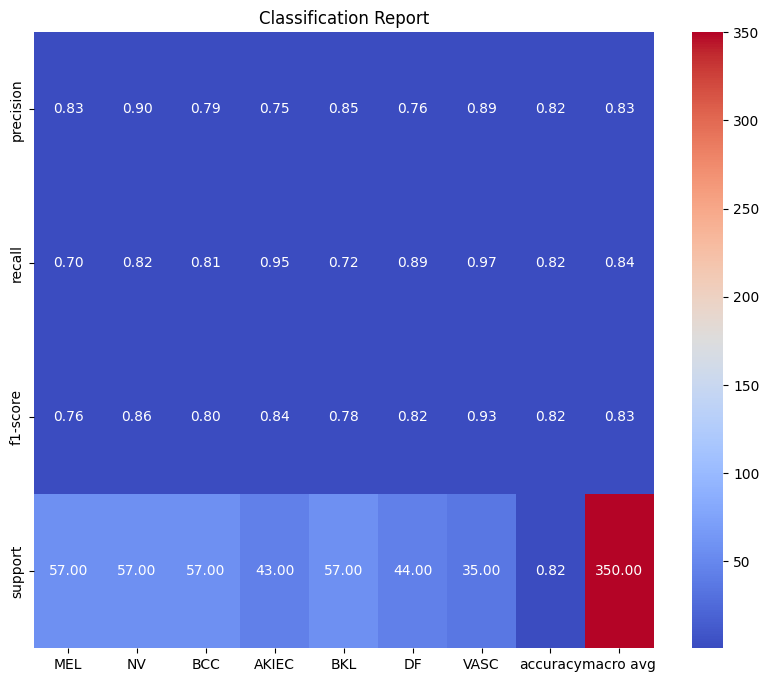

In [ ]:
import seaborn as sns
import pandas as pd

# Get classification report as a dictionary
report_dict = classification_report(test_labels, predictions, target_names=class_names, output_dict=True)

# Convert classification report to a DataFrame
report_df = pd.DataFrame(report_dict).transpose()

# Plot heatmap of the classification report
plt.figure(figsize=(10, 8))
sns.heatmap(report_df.iloc[:-1, :].T, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Classification Report')
plt.show()


<ipython-input-99-1908ddc8871a>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes


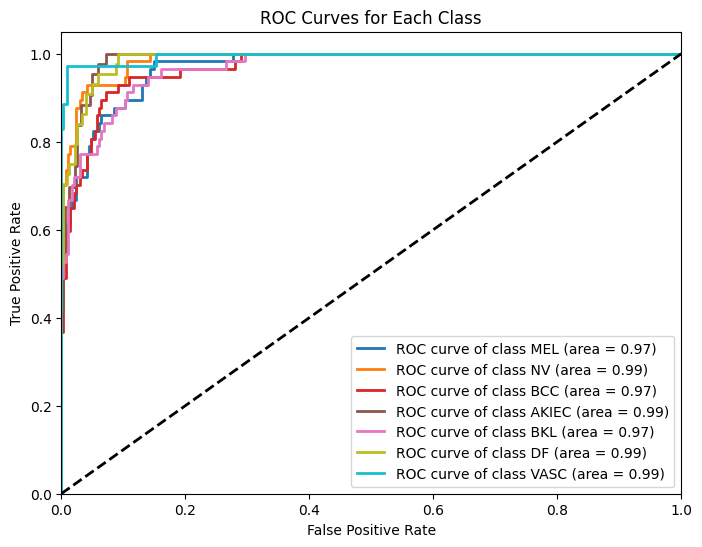

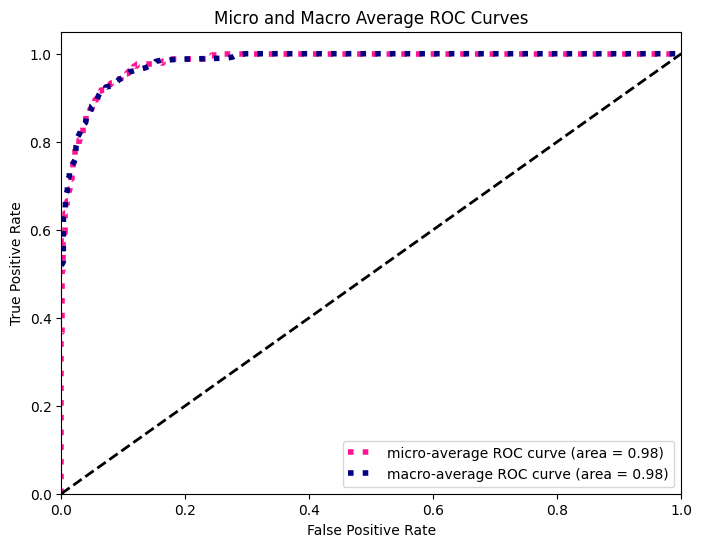

In [ ]:
# Binarize the labels for ROC and AUC computation
test_labels_bin = label_binarize(test_labels, classes=np.arange(7))  # 7 classes in total

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(7):
    fpr[i], tpr[i], _ = roc_curve(test_labels_bin[:, i], classifier.predict_proba(test_features)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes
for i in range(7):
    plt.plot(fpr[i], tpr[i], color=colors(i), lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels_bin.ravel(), classifier.predict_proba(test_features).ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(7)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(7):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= 7

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot micro and macro ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr["micro"], tpr["micro"], label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})', color='deeppink', linestyle=':', linewidth=4)
plt.plot(fpr["macro"], tpr["macro"], label=f'macro-average ROC curve (area = {roc_auc["macro"]:0.2f})', color='navy', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro and Macro Average ROC Curves')
plt.legend(loc="lower right")
plt.show()

last check for 35% sample data

Data sampling for 35%

In [ ]:
import pandas as pd
import os
import shutil

# Define paths for the original datasets
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
val_image_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# Define paths for sampled data directories
sampled_data_dir = '/content/sampled_data/'
sampled_train_dir = os.path.join(sampled_data_dir, 'train')
sampled_val_dir = os.path.join(sampled_data_dir, 'val')
sampled_test_dir = os.path.join(sampled_data_dir, 'test')

# Create directories if they don't exist
os.makedirs(sampled_train_dir, exist_ok=True)
os.makedirs(sampled_val_dir, exist_ok=True)
os.makedirs(sampled_test_dir, exist_ok=True)

# Class distribution for stratified sampling (use same as your main dataset)
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}

# Map class names to indices
class_map = {
    'MEL': 0,
    'NV': 1,
    'BCC': 2,
    'AKIEC': 3,
    'BKL': 4,
    'DF': 5,
    'VASC': 6
}

# Function to sample data using stratified sampling
def sample_data(csv_path, image_dir, sample_size, output_dir):
    df = pd.read_csv(csv_path)

    # Adding a 'class_index' column based on the one-hot encoded class columns
    # First, get the class name with the maximum value and then map to class index
    df['class_index'] = df.iloc[:, 1:].idxmax(axis=1).map(class_map)

    min_class_count = min(class_distribution.values())
    sample_per_class = int(sample_size * min_class_count)  # Calculate sample per class
    sample_df = pd.DataFrame()

    # Stratified sampling for each class
    for class_idx in class_distribution:
        # Find rows belonging to the current class index using the newly created 'class_index' column
        class_df = df[df['class_index'] == class_idx]

        # If no samples are available for the class, skip it
        if len(class_df) == 0:
            print(f"Skipping class {class_idx} due to no available samples.")
            continue

        # Perform sampling only if there are enough samples
        if len(class_df) > sample_per_class:
            class_sample_df = class_df.sample(sample_per_class, random_state=42)
        else:
            class_sample_df = class_df

        sample_df = pd.concat([sample_df, class_sample_df])

    # Copy the sampled images to the output directory
    for index, row in sample_df.iterrows():
        image_path = os.path.join(image_dir, row['image'])
        dest_path = os.path.join(output_dir, row['image'])
        if os.path.exists(image_path):
            shutil.copy(image_path, dest_path)

    # Save the sampled CSV file
    sample_csv_path = os.path.join(output_dir, 'sampled_groundtruth.csv')
    sample_df.to_csv(sample_csv_path, index=False)
    print(f"Sampled data saved to {sample_csv_path}")
    return sample_csv_path

# Sampling data (change the sample_size as required)
sample_size = 0.35

# Sample training, validation, and test datasets
print("Sampling training data...")
sampled_train_csv = sample_data(train_csv_path, train_image_dir, sample_size, sampled_train_dir)

print("Sampling validation data...")
sampled_val_csv = sample_data(val_csv_path, val_image_dir, sample_size, sampled_val_dir)

print("Sampling test data...")
sampled_test_csv = sample_data(test_csv_path, test_image_dir, sample_size, sampled_test_dir)


Sampling training data...
Sampled data saved to /content/sampled_data/train/sampled_groundtruth.csv
Sampling validation data...
Sampled data saved to /content/sampled_data/val/sampled_groundtruth.csv
Sampling test data...
Sampled data saved to /content/sampled_data/test/sampled_groundtruth.csv


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import pandas as pd
import os

# Clear TensorFlow session
tf.keras.backend.clear_session()

# Define focal loss function
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_sum(loss, axis=1)
    return focal_loss_fixed

# Define your class weights based on class imbalance
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}
total_samples = sum(class_distribution.values())
class_weights = {class_id: total_samples / (len(class_distribution) * count) for class_id, count in class_distribution.items()}

# Load the pre-trained BYOL model
byol_model_path = 'byol_model.keras'  # Ensure this path is correct
byol_model = tf.keras.models.load_model(byol_model_path)

# Check and extract output tensor from the BYOL model
byol_output = byol_model.output if isinstance(byol_model.output, tf.Tensor) else byol_model.output[0]


In [ ]:
# Add a classification head to the BYOL model with unique names
x = layers.Dense(256, activation='relu', name='dense_finetune_1')(byol_output)
x = layers.Dropout(0.5, name='dropout_finetune_1')(x)
output = layers.Dense(7, activation='softmax', name='dense_finetune_output')(x)  # 7 classes for skin cancer dataset

# Create the fine-tuning model
model_finetune = Model(inputs=byol_model.input, outputs=output)

# Explicitly build the model with the input shape before training
model_finetune.build((None, 224, 224, 3))  # Adjust the input shape as necessary

# Compile the fine-tuning model
model_finetune.compile(optimizer=Adam(learning_rate=1e-4),
                       loss=focal_loss(gamma=2., alpha=0.25),
                       metrics=['accuracy'])

# Define callbacks
callbacks = [
    ModelCheckpoint(filepath='finetuned_byol_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

In [ ]:
# Function to create a labeled dataset for fine-tuning
def create_labeled_dataset(csv_path, image_dir, batch_size=32):
    df = pd.read_csv(csv_path)

    # Drop any extra columns except the 'image' column and the 7 class columns
    expected_columns = ['image', 'MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']
    df = df[expected_columns]

    # Ensure that the labels are properly one-hot encoded
    labels = df.drop(columns=['image']).values
    image_paths = [os.path.join(image_dir, fname) for fname in df['image']]

    def parse_function(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        image = tf.image.per_image_standardization(image)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(df))  # Add shuffle for reproducibility
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Define paths for sampled data
sampled_train_csv = '/content/sampled_data/train/sampled_groundtruth.csv'
sampled_train_dir = '/content/sampled_data/train'
sampled_val_csv = '/content/sampled_data/val/sampled_groundtruth.csv'
sampled_val_dir = '/content/sampled_data/val'

# Create labeled datasets for fine-tuning
train_dataset = create_labeled_dataset(sampled_train_csv, sampled_train_dir)
val_dataset = create_labeled_dataset(sampled_val_csv, sampled_val_dir)

# Fine-tune the model using the class weights
history = model_finetune.fit(train_dataset,
                             validation_data=val_dataset,
                             epochs=30,
                             class_weight=class_weights,
                             callbacks=callbacks)

# Save the fine-tuned model
model_finetune.save('finetuned_byol_with_regularization35.keras')
print("Fine-tuned BYOL model with regularization saved.")

Epoch 1/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 97s 6s/step - accuracy: 0.1816 - loss: 5.1071 - val_accuracy: 0.0091 - val_loss: 1.5076 - learning_rate: 1.0000e-04
Epoch 2/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.1585 - loss: 3.0286 - val_accuracy: 0.0182 - val_loss: 2.0234 - learning_rate: 1.0000e-04
Epoch 3/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.1824 - loss: 2.1430 - val_accuracy: 0.0364 - val_loss: 1.6443 - learning_rate: 1.0000e-04
Epoch 4/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 329ms/step - accuracy: 0.1627 - loss: 1.4062 - val_accuracy: 0.0364 - val_loss: 1.4779 - learning_rate: 1.0000e-04
Epoch 5/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 304ms/step - accuracy: 0.2332 - loss: 1.1660 - val_accuracy: 0.0364 - val_loss: 1.1439 - learning_rate: 1.0000e-04
Epoch 6/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 518ms/step - accuracy: 0.2831 - loss: 1.0805 - val_accuracy: 0.0364 - val_loss: 0.8926 - learning_rate: 1.0000e-04
Epoch 7/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 326ms/step - accuracy: 0.2999 - loss: 0.7

In [ ]:
# Assuming `model_finetune` is the fine-tuned BYOL model

# Save the fine-tuned BYOL model to the directory
finetuned_byol_model_path = os.path.join(drive_directory, 'finetuned_byol_model35.keras')
model_finetune.save(finetuned_byol_model_path)
print(f"Fine-tuned BYOL model saved to: {finetuned_byol_model_path}")


Fine-tuned BYOL model saved to: /content/drive/MyDrive/BYOL_Models25/finetuned_byol_model35.keras


Extraction for 35%

In [ ]:
import tensorflow as tf

# Load the fine-tuned BYOL model
fine_tuned_model_path = 'finetuned_byol_with_regularization35.keras'
fine_tuned_model = tf.keras.models.load_model(fine_tuned_model_path, custom_objects={'focal_loss_fixed': focal_loss(gamma=2., alpha=0.25)})

# Remove the classification head to use it as a feature extractor
feature_extractor = tf.keras.Model(inputs=fine_tuned_model.input, outputs=fine_tuned_model.layers[-3].output)


In [ ]:
def extract_features(dataset, model):
    features = []
    labels = []
    for images, lbls in dataset:
        feats = model.predict(images)  # Extract features using the feature extractor model
        features.append(feats)
        labels.append(lbls)

    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0)
    return features, labels

# Create test dataset
test_dataset = create_labeled_dataset(sampled_test_csv, sampled_test_dir, batch_size=32)

# Extract features and labels from the test dataset
test_features, test_labels = extract_features(test_dataset, feature_extractor)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


Downstream task for 35%

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Flatten labels if one-hot encoded
test_labels = np.argmax(test_labels, axis=1)

# Initialize and train a classifier (Logistic Regression or SVM)
classifier = LogisticRegression(max_iter=5000, class_weight='balanced')
#classifier = SVC(class_weight='balanced', probability=True)

# Train the classifier
classifier.fit(test_features, test_labels)

# Evaluate on the test set
predictions = classifier.predict(test_features)
accuracy = accuracy_score(test_labels, predictions)
print(f'Test Accuracy of the downstream classifier: {accuracy:.4f}')
print('Classification Report:')
print(classification_report(test_labels, predictions))


Test Accuracy of the downstream classifier: 0.7782
Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.85      0.80        40
           1       0.81      0.75      0.78        40
           2       0.82      0.70      0.76        40
           3       0.79      0.85      0.82        40
           4       0.73      0.68      0.70        40
           5       0.71      0.80      0.75        40
           6       0.85      0.83      0.84        35

    accuracy                           0.78       275
   macro avg       0.78      0.78      0.78       275
weighted avg       0.78      0.78      0.78       275



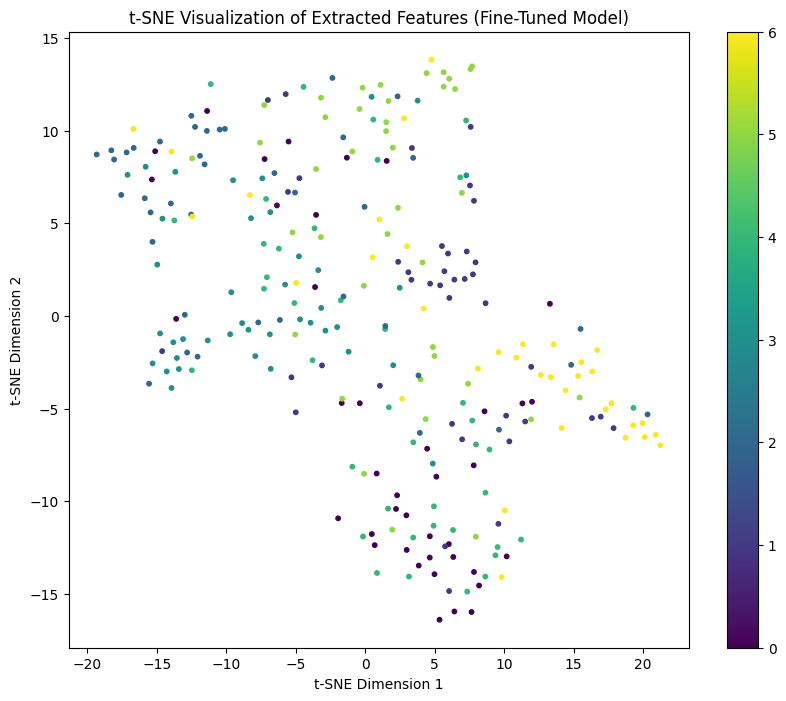

In [ ]:
# Visualize using t-SNE
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Extracted Features (Fine-Tuned Model)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()


<Figure size 1000x800 with 0 Axes>

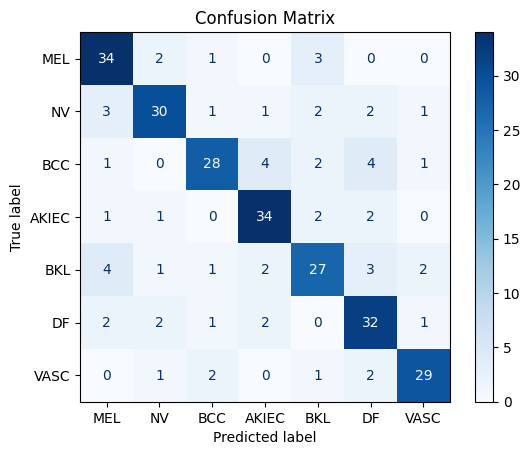

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute confusion matrix
conf_matrix = confusion_matrix(test_labels, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.show()


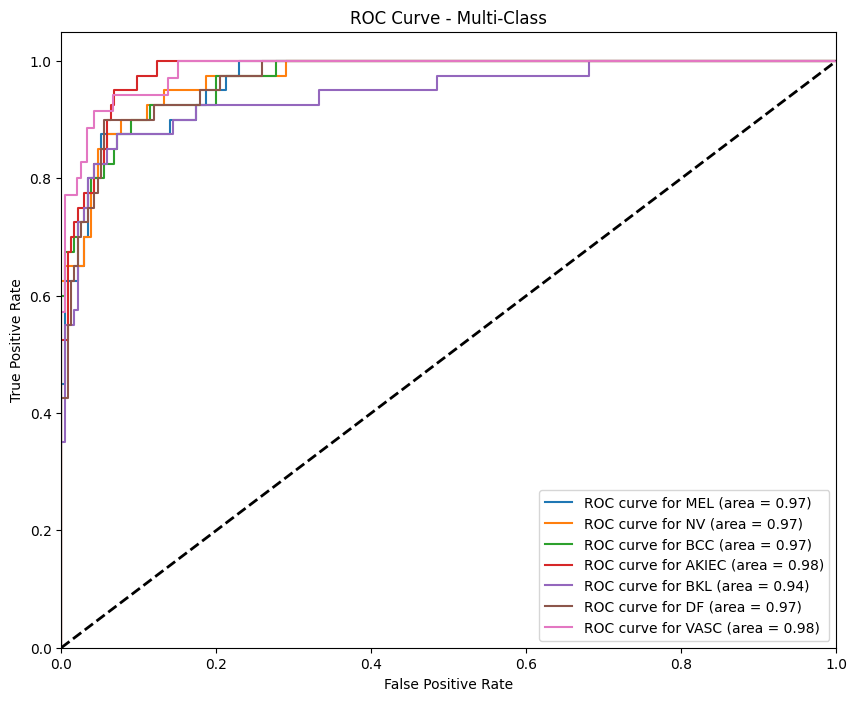

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay

# Binarize the labels for multi-class ROC
test_labels_bin = label_binarize(test_labels, classes=range(len(class_names)))
n_classes = test_labels_bin.shape[1]

# Predict probabilities for ROC calculation
y_score = classifier.predict_proba(test_features)

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(test_labels_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for {class_names[i]} (area = {roc_auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--', lw=2)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class')
plt.legend(loc='lower right')
plt.show()


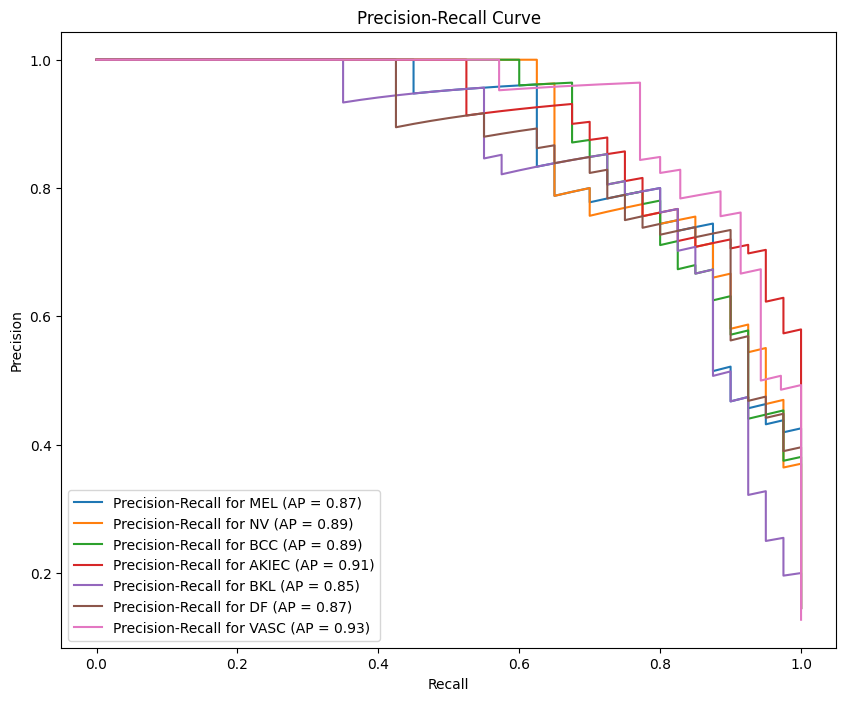

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate precision and recall for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(test_labels_bin[:, i], y_score[:, i])
    average_precision = average_precision_score(test_labels_bin[:, i], y_score[:, i])
    plt.plot(recall, precision, label=f'Precision-Recall for {class_names[i]} (AP = {average_precision:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()


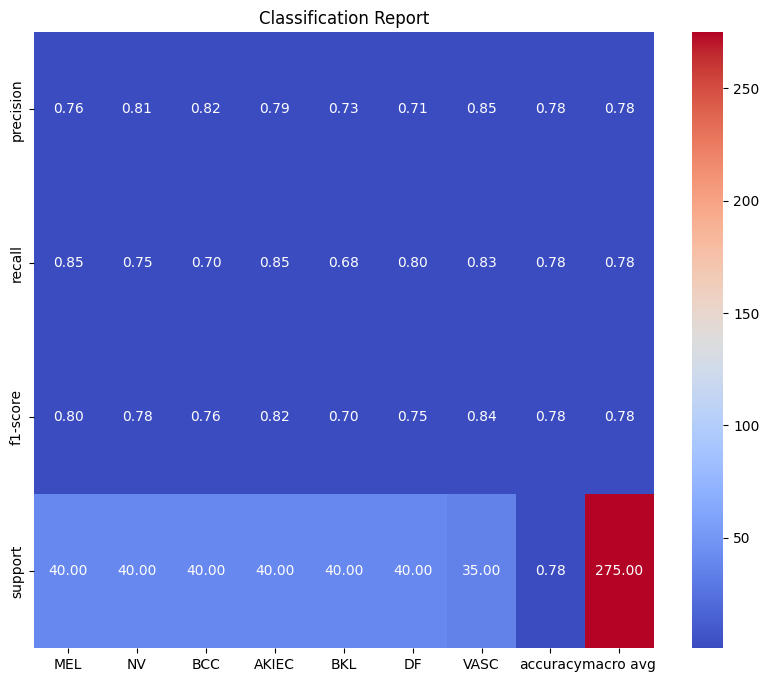

In [ ]:
import seaborn as sns
import pandas as pd

# Get classification report as a dictionary
report_dict = classification_report(test_labels, predictions, target_names=class_names, output_dict=True)

# Convert classification report to a DataFrame
report_df = pd.DataFrame(report_dict).transpose()

# Plot heatmap of the classification report
plt.figure(figsize=(10, 8))
sns.heatmap(report_df.iloc[:-1, :].T, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Classification Report')
plt.show()


<ipython-input-113-1908ddc8871a>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes


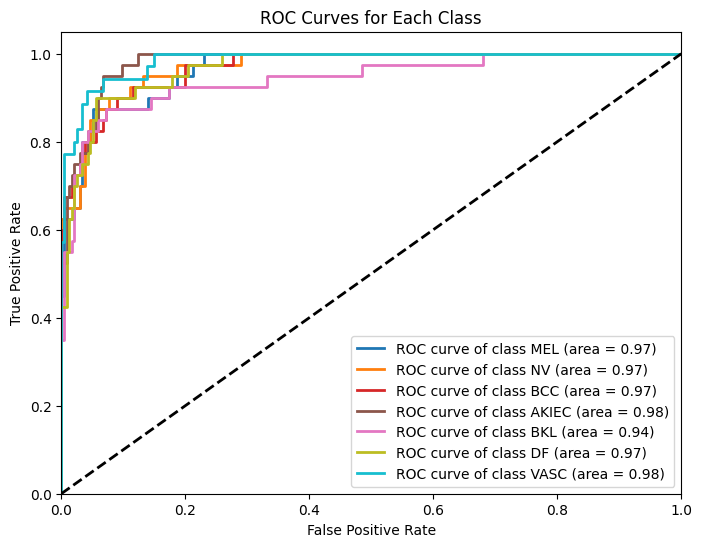

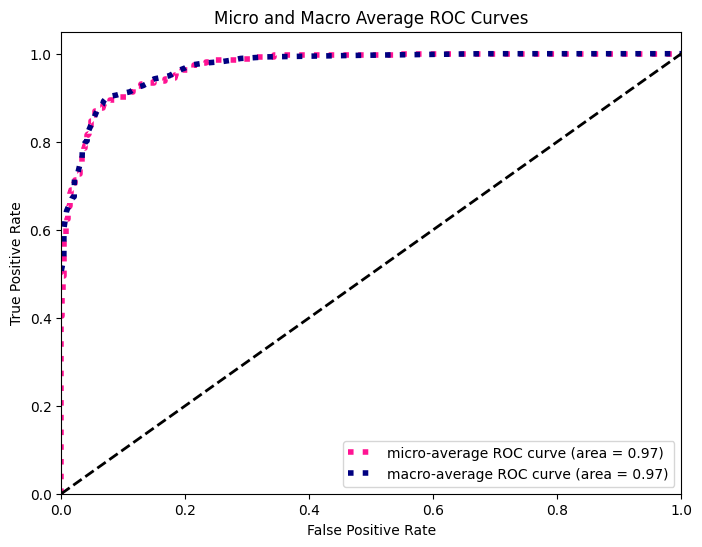

In [ ]:
# Binarize the labels for ROC and AUC computation
test_labels_bin = label_binarize(test_labels, classes=np.arange(7))  # 7 classes in total

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(7):
    fpr[i], tpr[i], _ = roc_curve(test_labels_bin[:, i], classifier.predict_proba(test_features)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes
for i in range(7):
    plt.plot(fpr[i], tpr[i], color=colors(i), lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels_bin.ravel(), classifier.predict_proba(test_features).ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(7)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(7):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= 7

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot micro and macro ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr["micro"], tpr["micro"], label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})', color='deeppink', linestyle=':', linewidth=4)
plt.plot(fpr["macro"], tpr["macro"], label=f'macro-average ROC curve (area = {roc_auc["macro"]:0.2f})', color='navy', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro and Macro Average ROC Curves')
plt.legend(loc="lower right")
plt.show()

Using KNN to visualise the clustering

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

# Number of neighbors for KNN
k_neighbors = 7

# Step 1: Fit a KNN model on the extracted features
knn = KNeighborsClassifier(n_neighbors=k_neighbors)
knn.fit(test_features, test_labels)

# Step 2: Predict the cluster labels using the KNN model
knn_cluster_labels = knn.predict(test_features)

# Step 3: Visualize the clustering using t-SNE

# Perform t-SNE on the extracted features
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

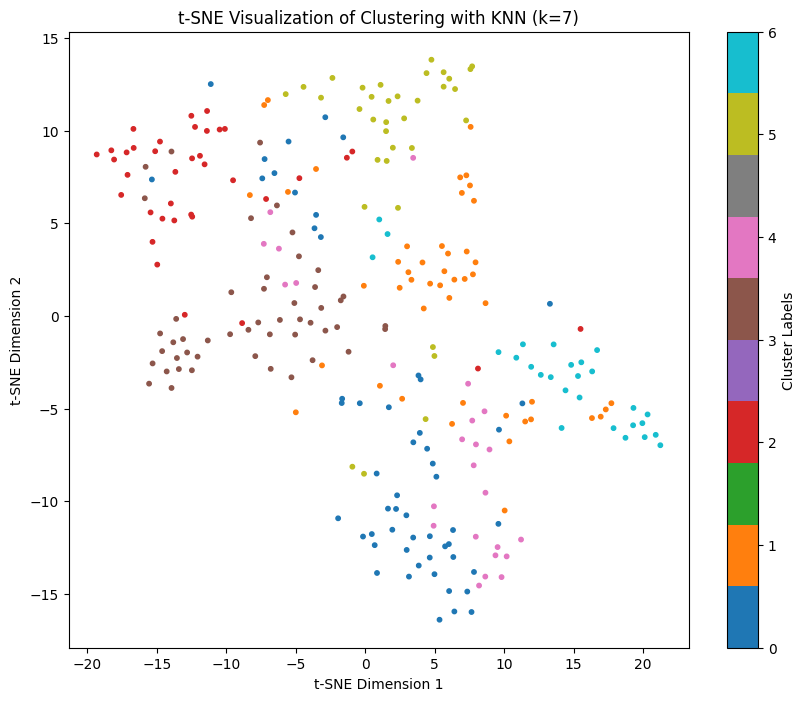

In [ ]:
# Create a scatter plot of the t-SNE results with cluster labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=knn_cluster_labels, cmap='tab10', s=10)
plt.colorbar(scatter, ticks=range(7), label='Cluster Labels')  # Adjust if the number of clusters is different
plt.title(f't-SNE Visualization of Clustering with KNN (k={k_neighbors})')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


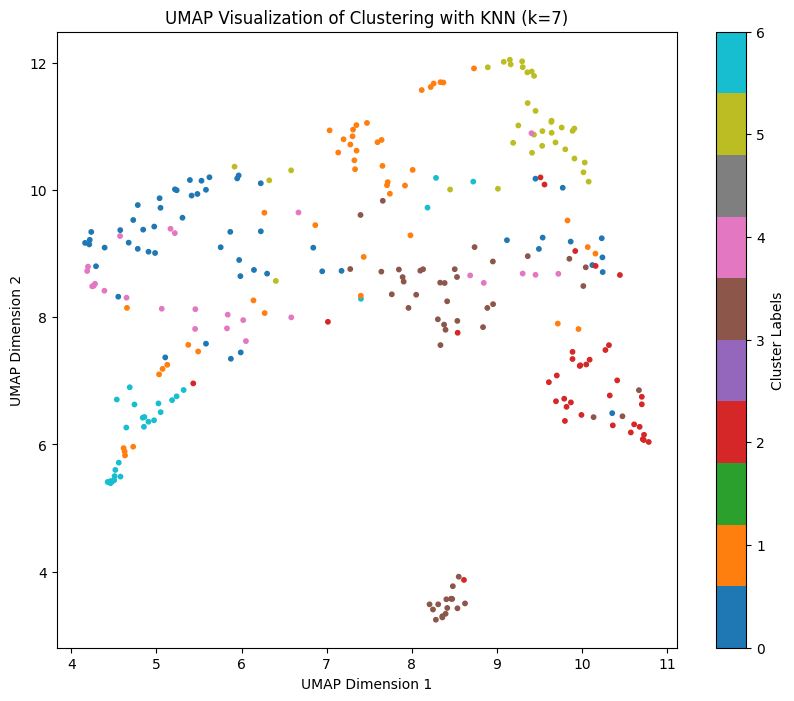

Test Accuracy of KNN clustering: 0.5600
Classification Report for KNN clustering:
              precision    recall  f1-score   support

         MEL       0.51      0.70      0.59        40
          NV       0.62      0.72      0.67        40
         BCC       0.54      0.50      0.52        40
       AKIEC       0.51      0.62      0.56        40
         BKL       0.48      0.30      0.37        40
          DF       0.57      0.50      0.53        40
        VASC       0.74      0.57      0.65        35

    accuracy                           0.56       275
   macro avg       0.57      0.56      0.56       275
weighted avg       0.56      0.56      0.55       275



In [ ]:
# Optional: Use UMAP for visualization
import umap

# Perform UMAP on the extracted features
umap_model = umap.UMAP(n_components=2, random_state=42)
umap_results = umap_model.fit_transform(test_features)

# Create a scatter plot of the UMAP results with cluster labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_results[:, 0], umap_results[:, 1], c=knn_cluster_labels, cmap='tab10', s=10)
plt.colorbar(scatter, ticks=range(7), label='Cluster Labels')  # Adjust if the number of clusters is different
plt.title(f'UMAP Visualization of Clustering with KNN (k={k_neighbors})')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()

# Step 4: Evaluate clustering quality using classification metrics
print(f"Test Accuracy of KNN clustering: {accuracy_score(test_labels, knn_cluster_labels):.4f}")
print("Classification Report for KNN clustering:")
print(classification_report(test_labels, knn_cluster_labels, target_names=class_names))

In [ ]:
import os

fine_tuned_model_path = 'finetuned_byol_with_regularization35.keras'

# Check if the file exists
if os.path.exists(fine_tuned_model_path):
    print(f"Model file '{fine_tuned_model_path}' exists.")
else:
    print(f"Model file '{fine_tuned_model_path}' does not exist.")


Model file 'finetuned_byol_with_regularization35.keras' exists.


In [ ]:
import tensorflow as tf

# Load the model if the file exists
if os.path.exists(fine_tuned_model_path):
    model = tf.keras.models.load_model(fine_tuned_model_path, compile=False)
    # Print the model summary to verify its structure
    model.summary()
else:
    print(f"Cannot load model. File '{fine_tuned_model_path}' not found.")


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 24,179,975 (92.24 MB)

 Trainable params: 24,126,855 (92.04 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
import os

fine_tuned_model_path = 'finetuned_byol_with_regularization50.keras'

# Check if the file exists
if os.path.exists(fine_tuned_model_path):
    print(f"Model file '{fine_tuned_model_path}' exists.")
else:
    print(f"Model file '{fine_tuned_model_path}' does not exist.")

import tensorflow as tf

# Load the model if the file exists
if os.path.exists(fine_tuned_model_path):
    model = tf.keras.models.load_model(fine_tuned_model_path, compile=False)
    # Print the model summary to verify its structure
    model.summary()
else:
    print(f"Cannot load model. File '{fine_tuned_model_path}' not found.")

Model file 'finetuned_byol_with_regularization50.keras' exists.


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 24,179,975 (92.24 MB)

 Trainable params: 24,126,855 (92.04 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
import os

fine_tuned_model_path = 'finetuned_byol_with_regularization.keras'

# Check if the file exists
if os.path.exists(fine_tuned_model_path):
    print(f"Model file '{fine_tuned_model_path}' exists.")
else:
    print(f"Model file '{fine_tuned_model_path}' does not exist.")
import tensorflow as tf

# Load the model if the file exists
if os.path.exists(fine_tuned_model_path):
    model = tf.keras.models.load_model(fine_tuned_model_path, compile=False)
    # Print the model summary to verify its structure
    model.summary()
else:
    print(f"Cannot load model. File '{fine_tuned_model_path}' not found.")


Model file 'finetuned_byol_with_regularization.keras' exists.


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 24,179,975 (92.24 MB)

 Trainable params: 24,126,855 (92.04 MB)

 Non-trainable params: 53,120 (207.50 KB)

try for 10% coz i have lost this trial

In [ ]:
import pandas as pd
import os
import shutil

# Define paths for the original datasets
train_csv_path = '/content/ISIC2018/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv'
train_image_dir = '/content/ISIC2018/ISIC2018_Task3_Training_Input'
val_csv_path = '/content/ISIC2018/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv'
val_image_dir = '/content/ISIC2018/ISIC2018_Task3_Validation_Input'
test_csv_path = '/content/ISIC2018/ISIC2018_Task3_Test_GroundTruth/ISIC2018_Task3_Test_GroundTruth.csv'
test_image_dir = '/content/ISIC2018/ISIC2018_Task3_Test_Input'

# Define paths for sampled data directories
sampled_data_dir = '/content/sampled_data/'
sampled_train_dir = os.path.join(sampled_data_dir, 'train')
sampled_val_dir = os.path.join(sampled_data_dir, 'val')
sampled_test_dir = os.path.join(sampled_data_dir, 'test')

# Create directories if they don't exist
os.makedirs(sampled_train_dir, exist_ok=True)
os.makedirs(sampled_val_dir, exist_ok=True)
os.makedirs(sampled_test_dir, exist_ok=True)

# Class distribution for stratified sampling (use same as your main dataset)
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}

# Map class names to indices
class_map = {
    'MEL': 0,
    'NV': 1,
    'BCC': 2,
    'AKIEC': 3,
    'BKL': 4,
    'DF': 5,
    'VASC': 6
}

# Function to sample data using stratified sampling
def sample_data(csv_path, image_dir, sample_size, output_dir):
    df = pd.read_csv(csv_path)

    # Adding a 'class_index' column based on the one-hot encoded class columns
    # First, get the class name with the maximum value and then map to class index
    df['class_index'] = df.iloc[:, 1:].idxmax(axis=1).map(class_map)

    min_class_count = min(class_distribution.values())
    sample_per_class = int(sample_size * min_class_count)  # Calculate sample per class
    sample_df = pd.DataFrame()

    # Stratified sampling for each class
    for class_idx in class_distribution:
        # Find rows belonging to the current class index using the newly created 'class_index' column
        class_df = df[df['class_index'] == class_idx]

        # If no samples are available for the class, skip it
        if len(class_df) == 0:
            print(f"Skipping class {class_idx} due to no available samples.")
            continue

        # Perform sampling only if there are enough samples
        if len(class_df) > sample_per_class:
            class_sample_df = class_df.sample(sample_per_class, random_state=42)
        else:
            class_sample_df = class_df

        sample_df = pd.concat([sample_df, class_sample_df])

    # Copy the sampled images to the output directory
    for index, row in sample_df.iterrows():
        image_path = os.path.join(image_dir, row['image'])
        dest_path = os.path.join(output_dir, row['image'])
        if os.path.exists(image_path):
            shutil.copy(image_path, dest_path)

    # Save the sampled CSV file
    sample_csv_path = os.path.join(output_dir, 'sampled_groundtruth.csv')
    sample_df.to_csv(sample_csv_path, index=False)
    print(f"Sampled data saved to {sample_csv_path}")
    return sample_csv_path

# Sampling data (change the sample_size as required)
sample_size = 0.10

# Sample training, validation, and test datasets
print("Sampling training data...")
sampled_train_csv = sample_data(train_csv_path, train_image_dir, sample_size, sampled_train_dir)

print("Sampling validation data...")
sampled_val_csv = sample_data(val_csv_path, val_image_dir, sample_size, sampled_val_dir)

print("Sampling test data...")
sampled_test_csv = sample_data(test_csv_path, test_image_dir, sample_size, sampled_test_dir)


Sampling training data...
Sampled data saved to /content/sampled_data/train/sampled_groundtruth.csv
Sampling validation data...
Sampled data saved to /content/sampled_data/val/sampled_groundtruth.csv
Sampling test data...
Sampled data saved to /content/sampled_data/test/sampled_groundtruth.csv


In [ ]:
import os
print(os.listdir('.'))


['.config', 'ISIC2018', 'sampled_data', 'drive', 'sample_data']


In [ ]:
byol_model_path = '/content/drive/MyDrive/BYOL_Models25/byol_model.keras'


In [ ]:
import tensorflow as tf

# Define the full path to the saved model file
byol_model_path = '/content/drive/MyDrive/BYOL_Models25/byol_model.keras'  # Update this path if necessary

# Verify the file exists
if not os.path.exists(byol_model_path):
    print(f"File not found: {byol_model_path}")
else:
    # Load the pre-trained BYOL model
    byol_model = tf.keras.models.load_model(byol_model_path, custom_objects={'focal_loss_fixed': focal_loss(gamma=2., alpha=0.25)})
    print("Model loaded successfully.")

    # Check and extract output tensor from the BYOL model
    byol_output = byol_model.output if isinstance(byol_model.output, tf.Tensor) else byol_model.output[0]
    print(f"BYOL model output shape: {byol_output.shape}")


Model loaded successfully.
BYOL model output shape: (None, 128)


Defining Focal loss and class distribution

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import pandas as pd
import os

# Clear TensorFlow session
tf.keras.backend.clear_session()

# Define focal loss function
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_sum(loss, axis=1)
    return focal_loss_fixed

# Define your class weights based on class imbalance
class_distribution = {
    0: 1113,   # MEL
    1: 6705,   # NV
    2: 514,    # BCC
    3: 327,    # AKIEC
    4: 1099,   # BKL
    5: 115,    # DF
    6: 142     # VASC
}
total_samples = sum(class_distribution.values())
class_weights = {class_id: total_samples / (len(class_distribution) * count) for class_id, count in class_distribution.items()}

# # Load the pre-trained BYOL model
# byol_model_path = 'byol_model.keras'  # Ensure this path is correct
# byol_model = tf.keras.models.load_model(byol_model_path)

# # Check and extract output tensor from the BYOL model
# byol_output = byol_model.output if isinstance(byol_model.output, tf.Tensor) else byol_model.output[0]


# Define the full path to the saved model file
byol_model_path = '/content/drive/MyDrive/BYOL_Models25/byol_model.keras'  # Update this path if necessary

# Verify the file exists
if not os.path.exists(byol_model_path):
    print(f"File not found: {byol_model_path}")
else:
    # Load the pre-trained BYOL model
    byol_model = tf.keras.models.load_model(byol_model_path, custom_objects={'focal_loss_fixed': focal_loss(gamma=2., alpha=0.25)})
    print("Model loaded successfully.")

    # Check and extract output tensor from the BYOL model
    byol_output = byol_model.output if isinstance(byol_model.output, tf.Tensor) else byol_model.output[0]
    print(f"BYOL model output shape: {byol_output.shape}")


Model loaded successfully.
BYOL model output shape: (None, 128)


In [ ]:
# Add a classification head to the BYOL model with unique names
x = layers.Dense(256, activation='relu', name='dense_finetune_1')(byol_output)
x = layers.Dropout(0.5, name='dropout_finetune_1')(x)
output = layers.Dense(7, activation='softmax', name='dense_finetune_output')(x)  # 7 classes for skin cancer dataset

# Create the fine-tuning model
model_finetune = Model(inputs=byol_model.input, outputs=output)

# Explicitly build the model with the input shape before training
model_finetune.build((None, 224, 224, 3))  # Adjust the input shape as necessary

# Compile the fine-tuning model
model_finetune.compile(optimizer=Adam(learning_rate=1e-4),
                       loss=focal_loss(gamma=2., alpha=0.25),
                       metrics=['accuracy'])

# Define callbacks
callbacks = [
    ModelCheckpoint(filepath='finetuned_byol_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

In [ ]:
# Function to create a labeled dataset for fine-tuning
def create_labeled_dataset(csv_path, image_dir, batch_size=32):
    df = pd.read_csv(csv_path)

    # Drop any extra columns except the 'image' column and the 7 class columns
    expected_columns = ['image', 'MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']
    df = df[expected_columns]

    # Ensure that the labels are properly one-hot encoded
    labels = df.drop(columns=['image']).values
    image_paths = [os.path.join(image_dir, fname) for fname in df['image']]

    def parse_function(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        image = tf.image.per_image_standardization(image)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    dataset = dataset.map(lambda x, y: parse_function(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(df))  # Add shuffle for reproducibility
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Define paths for sampled data
sampled_train_csv = '/content/sampled_data/train/sampled_groundtruth.csv'
sampled_train_dir = '/content/sampled_data/train'
sampled_val_csv = '/content/sampled_data/val/sampled_groundtruth.csv'
sampled_val_dir = '/content/sampled_data/val'

# Create labeled datasets for fine-tuning
train_dataset = create_labeled_dataset(sampled_train_csv, sampled_train_dir)
val_dataset = create_labeled_dataset(sampled_val_csv, sampled_val_dir)

# Fine-tune the model using the class weights
history = model_finetune.fit(train_dataset,
                             validation_data=val_dataset,
                             epochs=20,
                             class_weight=class_weights,
                             callbacks=callbacks)

# Save the fine-tuned model
model_finetune.save('finetuned_byol_with_regularization.keras')
print("Fine-tuned BYOL model with regularization saved.")

Epoch 1/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 96s 17s/step - accuracy: 0.1066 - loss: 7.3340 - val_accuracy: 0.1964 - val_loss: 1.7316 - learning_rate: 1.0000e-04
Epoch 2/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 3s/step - accuracy: 0.1560 - loss: 6.5488 - val_accuracy: 0.1964 - val_loss: 1.3310 - learning_rate: 1.0000e-04
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.1664 - loss: 4.7598 - val_accuracy: 0.1071 - val_loss: 1.0892 - learning_rate: 1.0000e-04
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.1976 - loss: 2.9999 - val_accuracy: 0.0179 - val_loss: 1.0185 - learning_rate: 1.0000e-04
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.1600 - loss: 2.7734 - val_accuracy: 0.0357 - val_loss: 0.9789 - learning_rate: 1.0000e-04
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 309ms/step - accuracy: 0.1755 - loss: 2.5349 - val_accuracy: 0.0536 - val_loss: 0.9883 - learning_rate: 1.0000e-04
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.2249 - loss: 1.9096 - val_ac

In [ ]:
import os

# Define the directory path on Google Drive
drive_directory = '/content/drive/MyDrive/BYOL_Models25/'

# Ensure the directory exists, if not, create it
if not os.path.exists(drive_directory):
    os.makedirs(drive_directory)
    print(f"Directory '{drive_directory}' created.")
else:
    print(f"Directory '{drive_directory}' already exists.")

# Save the fine-tuned BYOL model to the directory
finetuned_byol_model_path = os.path.join(drive_directory, 'finetuned_byol_model10.keras')
model_finetune.save(finetuned_byol_model_path)
print(f"Fine-tuned BYOL model saved to: {finetuned_byol_model_path}")


Directory '/content/drive/MyDrive/BYOL_Models25/' already exists.
Fine-tuned BYOL model saved to: /content/drive/MyDrive/BYOL_Models25/finetuned_byol_model10.keras


In [ ]:
# Define paths for test data
test_csv_path = '/content/sampled_data/test/sampled_groundtruth.csv'  # Update with the correct path if needed
test_image_dir = '/content/sampled_data/test'

# Create the test dataset
test_dataset = create_labeled_dataset(test_csv_path, test_image_dir)

# Evaluate the fine-tuned model on the test dataset
test_loss, test_accuracy = model_finetune.evaluate(test_dataset)
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.1404 - loss: 0.5060 
Test Loss: 0.4868
Test Accuracy: 0.1558


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Predict labels for test data
test_predictions = model_finetune.predict(test_dataset)
test_predictions = np.argmax(test_predictions, axis=1)  # Convert probabilities to class labels

# Get true labels from the test dataset
test_labels = np.concatenate([y.numpy() for _, y in test_dataset])
test_labels = np.argmax(test_labels, axis=1)  # Convert one-hot encoded labels to class labels

# Print classification report
class_names = ['MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC']
print(classification_report(test_labels, test_predictions, target_names=class_names))

# Print confusion matrix
cm = confusion_matrix(test_labels, test_predictions)
print("Confusion Matrix:\n", cm)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
              precision    recall  f1-score   support

         MEL       0.00      0.00      0.00        11
          NV       0.00      0.00      0.00        11
         BCC       0.00      0.00      0.00        11
       AKIEC       0.00      0.00      0.00        11
         BKL       0.00      0.00      0.00        11
          DF       0.22      0.36      0.28        11
        VASC       0.14      0.73      0.23        11

    accuracy                           0.16        77
   macro avg       0.05      0.16      0.07        77
weighted avg       0.05      0.16      0.07        77

Confusion Matrix:
 [[ 0  0  0  0  0  2  9]
 [ 0  0  0  0  0  4  7]
 [ 0  0  0  0  0  3  8]
 [ 0  0  0  0  0  1 10]
 [ 0  0  0  0  0  1 10]
 [ 0  0  0  0  0  4  7]
 [ 0  0  0  0  0  3  8]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step


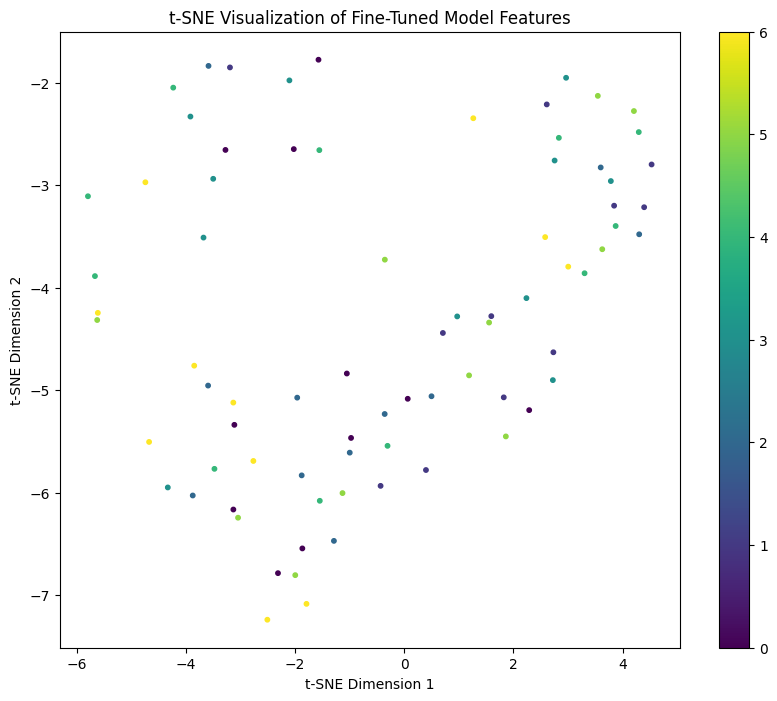

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Extract features from the fine-tuned model's feature extractor
feature_extractor = Model(inputs=model_finetune.input, outputs=model_finetune.layers[-3].output)  # Adjust layer index if needed
test_features = feature_extractor.predict(test_dataset)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

# Visualize with t-SNE
plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Fine-Tuned Model Features')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()


In [ ]:
!pip install umap-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.5 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


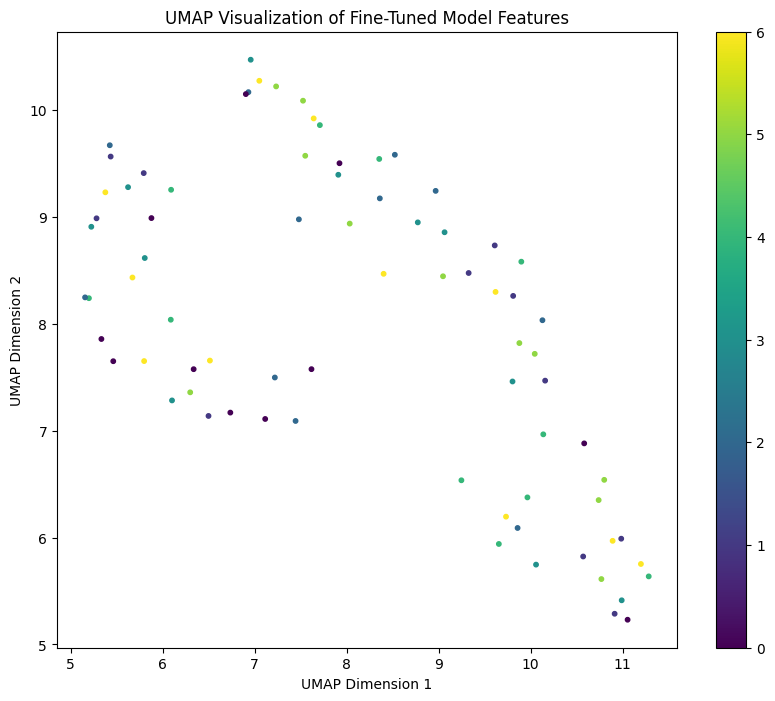

In [ ]:
import umap

# Apply UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_results = reducer.fit_transform(test_features)

# Visualize with UMAP
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_results[:, 0], umap_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('UMAP Visualization of Fine-Tuned Model Features')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()


Extract features for downstream task

In [ ]:
def extract_features(dataset, model):
    features = []
    labels = []
    for images, lbls in dataset:
        feats = model.predict(images)  # Extract features using the feature extractor model
        features.append(feats)
        labels.append(lbls)

    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0)
    return features, labels

# Create test dataset
test_dataset = create_labeled_dataset(sampled_test_csv, sampled_test_dir, batch_size=32)

# Extract features and labels from the test dataset
test_features, test_labels = extract_features(test_dataset, feature_extractor)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Flatten labels if one-hot encoded
test_labels = np.argmax(test_labels, axis=1)

# Initialize and train a classifier (Logistic Regression or SVM)
classifier = LogisticRegression(max_iter=5000, class_weight='balanced')
#classifier = SVC(class_weight='balanced', probability=True)

# Train the classifier
classifier.fit(test_features, test_labels)

# Evaluate on the test set
predictions = classifier.predict(test_features)
accuracy = accuracy_score(test_labels, predictions)
print(f'Test Accuracy of the downstream classifier: {accuracy:.4f}')
print('Classification Report:')
print(classification_report(test_labels, predictions))


Test Accuracy of the downstream classifier: 0.5714
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.69        11
           1       0.75      0.55      0.63        11
           2       0.55      0.55      0.55        11
           3       0.45      0.82      0.58        11
           4       0.50      0.18      0.27        11
           5       0.75      0.27      0.40        11
           6       0.78      0.64      0.70        11

    accuracy                           0.57        77
   macro avg       0.61      0.57      0.54        77
weighted avg       0.61      0.57      0.54        77



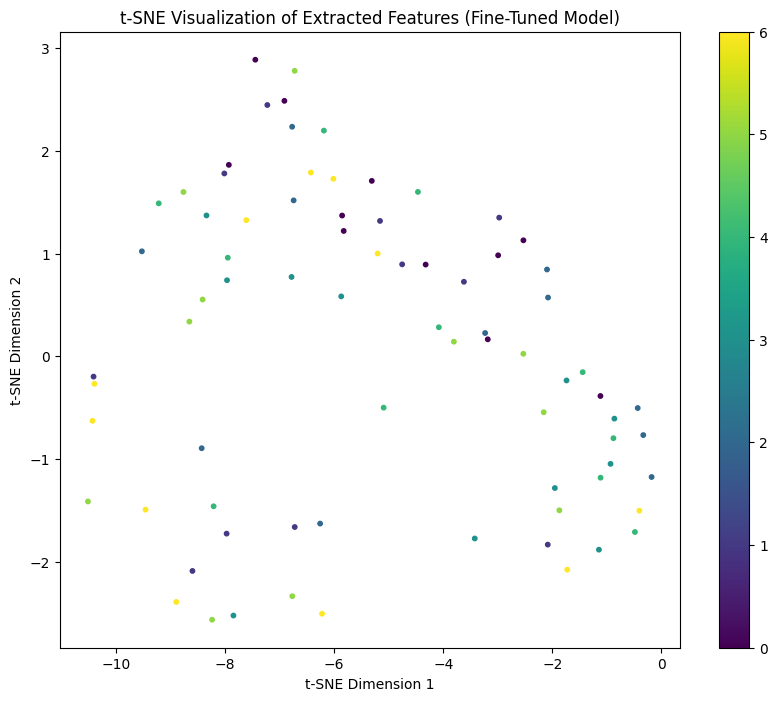

In [ ]:
# Visualize using t-SNE
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Extracted Features (Fine-Tuned Model)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()


Confusion Matrix

<Figure size 1000x800 with 0 Axes>

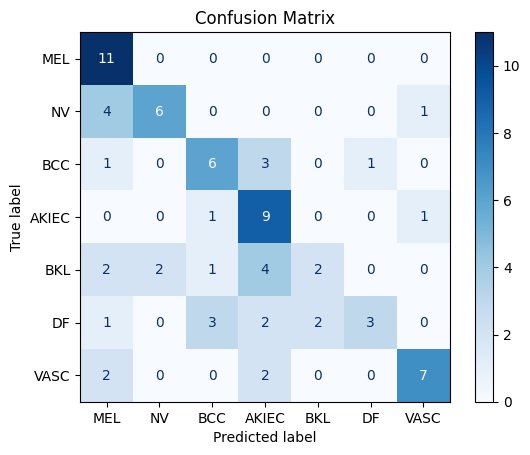

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute confusion matrix
conf_matrix = confusion_matrix(test_labels, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.show()


ROC Curve and AUC

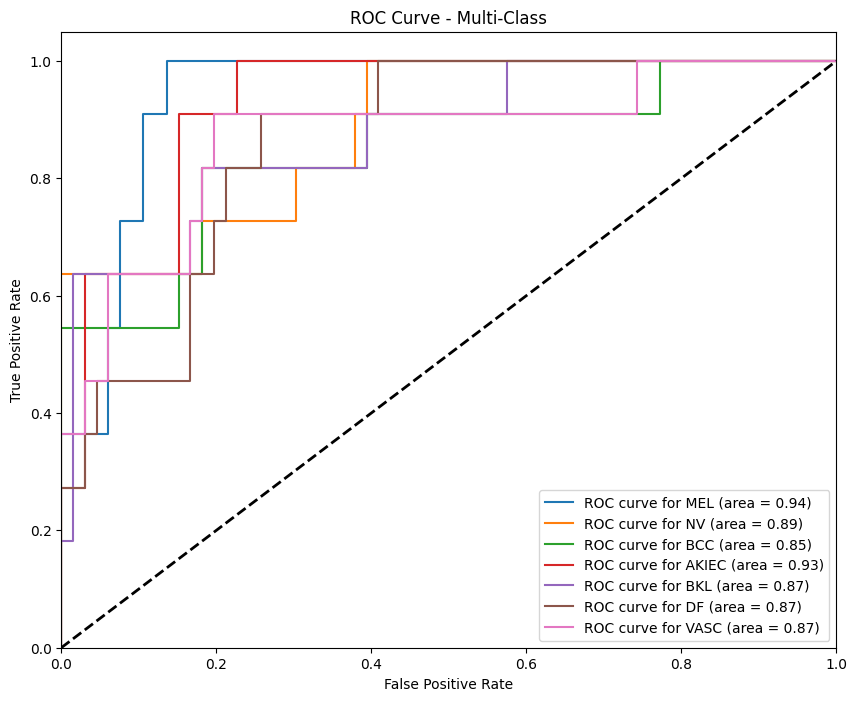

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay

# Binarize the labels for multi-class ROC
test_labels_bin = label_binarize(test_labels, classes=range(len(class_names)))
n_classes = test_labels_bin.shape[1]

# Predict probabilities for ROC calculation
y_score = classifier.predict_proba(test_features)

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(test_labels_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve for {class_names[i]} (area = {roc_auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--', lw=2)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class')
plt.legend(loc='lower right')
plt.show()


 Precision-Recall Curve

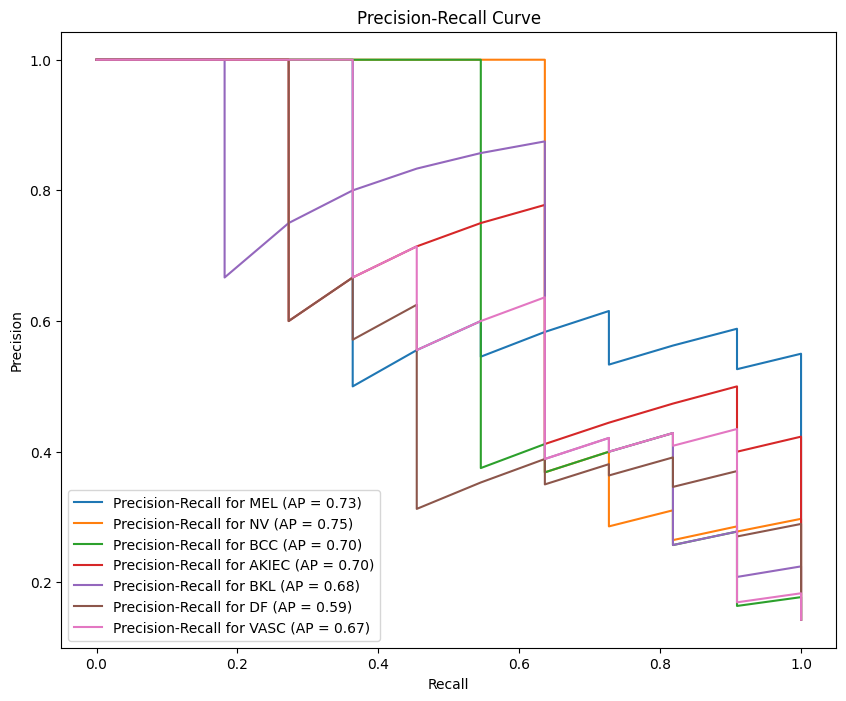

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate precision and recall for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(test_labels_bin[:, i], y_score[:, i])
    average_precision = average_precision_score(test_labels_bin[:, i], y_score[:, i])
    plt.plot(recall, precision, label=f'Precision-Recall for {class_names[i]} (AP = {average_precision:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()


Classification Report Visualization

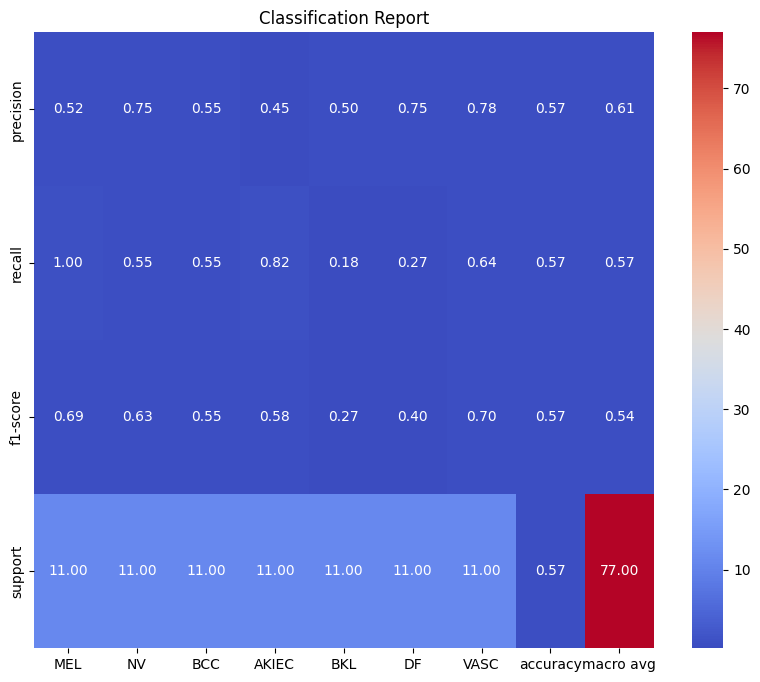

In [ ]:
import seaborn as sns
import pandas as pd

# Get classification report as a dictionary
report_dict = classification_report(test_labels, predictions, target_names=class_names, output_dict=True)

# Convert classification report to a DataFrame
report_df = pd.DataFrame(report_dict).transpose()

# Plot heatmap of the classification report
plt.figure(figsize=(10, 8))
sns.heatmap(report_df.iloc[:-1, :].T, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Classification Report')
plt.show()


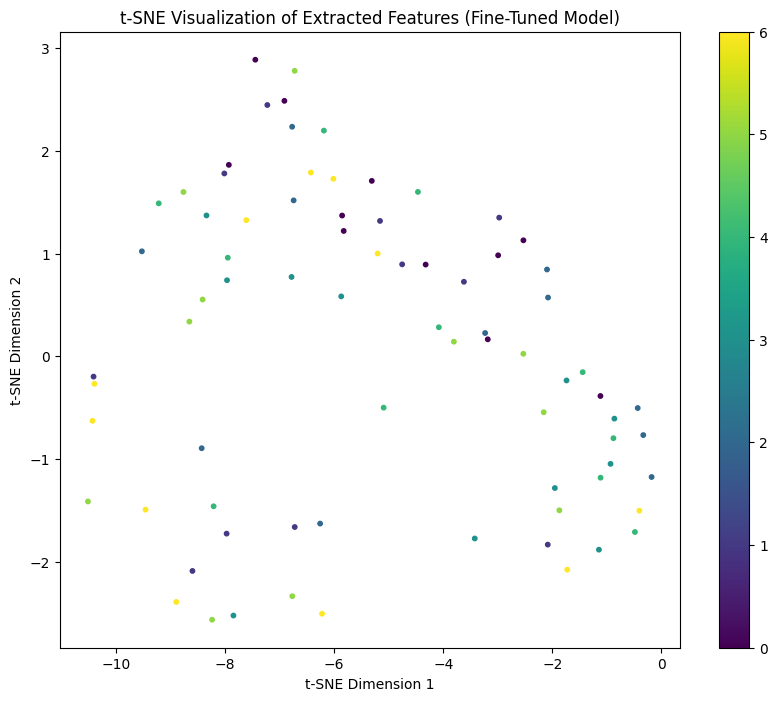

In [ ]:
# Visualize using t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(test_features)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_labels, cmap='viridis', s=10)
plt.colorbar(scatter)
plt.title('t-SNE Visualization of Extracted Features (Fine-Tuned Model)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

<ipython-input-64-1908ddc8871a>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes


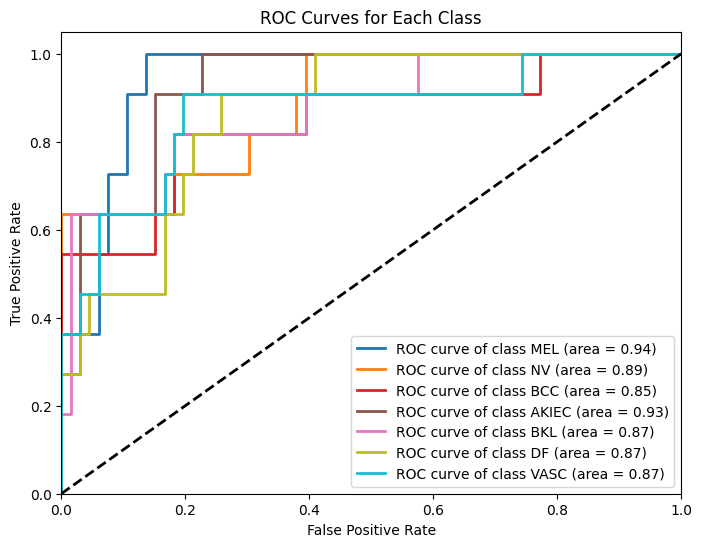

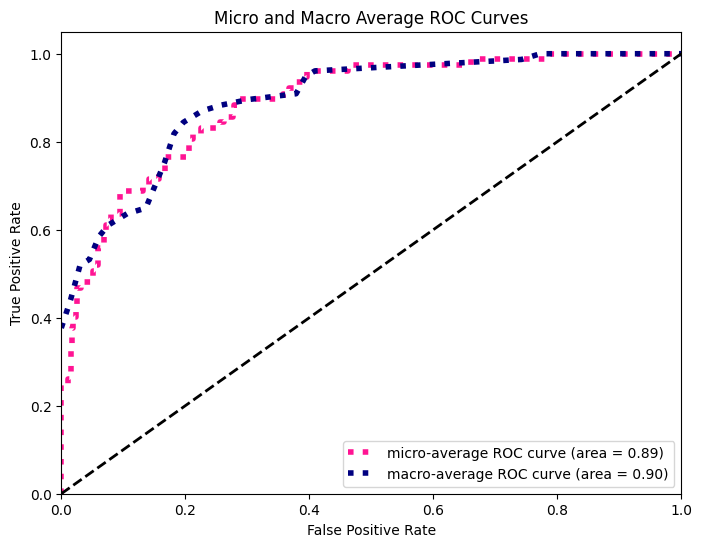

In [ ]:
# Binarize the labels for ROC and AUC computation
test_labels_bin = label_binarize(test_labels, classes=np.arange(7))  # 7 classes in total

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(7):
    fpr[i], tpr[i], _ = roc_curve(test_labels_bin[:, i], classifier.predict_proba(test_features)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
colors = plt.cm.get_cmap('tab10', 7)  # Get a color map for 7 classes
for i in range(7):
    plt.plot(fpr[i], tpr[i], color=colors(i), lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels_bin.ravel(), classifier.predict_proba(test_features).ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(7)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(7):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= 7

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot micro and macro ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr["micro"], tpr["micro"], label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})', color='deeppink', linestyle=':', linewidth=4)
plt.plot(fpr["macro"], tpr["macro"], label=f'macro-average ROC curve (area = {roc_auc["macro"]:0.2f})', color='navy', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro and Macro Average ROC Curves')
plt.legend(loc="lower right")
plt.show()